In [2]:
install.packages("lmtest")
install.packages("forecast")
install.packages("DIMORA")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘zoo’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘xts’, ‘TTR’, ‘quadprog’, ‘quantmod’, ‘fracdiff’, ‘Rcpp’, ‘timeDate’, ‘tseries’, ‘urca’, ‘RcppArmadillo’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘plyr’, ‘minpack.lm’, ‘numDeriv’, ‘reshape2’, ‘deSolve’




In [3]:
library(readxl)
library(lmtest)
library(forecast)
library(DIMORA)

Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric


Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Loading required package: minpack.lm

Loading required package: numDeriv

Loading required package: reshape2

Loading required package: deSolve



In [4]:
library(dplyr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [88]:
car<- read.csv("car_sales_data.csv")
car<-data.frame(car)
head(car)

,Date,Salesperson,Customer.Name,Car.Make,Car.Model,Car.Year,Sale.Price,Commission.Rate,Commission.Earned
,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>
1,2022-08-01,Monica Moore MD,Mary Butler,Nissan,Altima,2018,15983,0.07049523,1126.73
2,2023-03-15,Roberto Rose,Richard Pierce,Nissan,F-150,2016,38474,0.13443884,5172.40
3,2023-04-29,Ashley Ramos,Sandra Moore,Ford,Civic,2016,33340,0.11453592,3818.63
4,2022-09-04,Patrick Harris,Johnny Scott,Ford,Altima,2013,41937,0.09219072,3866.20
5,2022-06-16,Eric Lopez,Vanessa Jones,Honda,Silverado,2022,20256,0.11348979,2298.85
6,2022-12-18,Terry Perkins MD,John Olsen,Ford,Altima,2015,14769,0.07724694,1140.86


In [236]:
unique(car["Car.Model"])

,Car.Model
,<chr>
1,Altima
2,F-150
3,Civic
5,Silverado
9,Corolla


In [238]:
al <-car %>% filter(Car.Model=="Altima")

In [239]:
al

Date,Salesperson,Customer.Name,Car.Make,Car.Model,Car.Year,Sale.Price,Commission.Rate,Commission.Earned
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>
2022-08-01,Monica Moore MD,Mary Butler,Nissan,Altima,2018,15983,0.07049523,1126.73
2022-09-04,Patrick Harris,Johnny Scott,Ford,Altima,2013,41937,0.09219072,3866.20
2022-12-18,Terry Perkins MD,John Olsen,Ford,Altima,2015,14769,0.07724694,1140.86
2022-06-20,Norma Watkins,Michael Bond,Ford,Altima,2015,46233,0.07162376,3311.38
2022-05-29,Mia Acosta,Rebecca Best,Ford,Altima,2017,36409,0.12234885,4454.60
2023-04-06,Carrie Howard,Rodney Black,Chevrolet,Altima,2021,10313,0.10387489,1071.26
2022-08-12,Kristin Holmes,Michael Hill,Nissan,Altima,2010,39916,0.05200777,2075.94
2023-03-09,Patricia Reynolds,Alison Walker,Ford,Altima,2014,28796,0.09345121,2691.02
2022-07-26,Jeremiah Thompson,Clifford Evans,Nissan,Altima,2013,16797,0.14423733,2422.75


In [136]:
d_total<-car %>% group_by(Date,Salesperson)%>% summarise(daily_sales_brand = n())

`summarise()` has grouped output by 'Date'. You can override using the
`.groups` argument.


In [209]:
commission_p<-car %>% group_by(Date,Salesperson)%>% summarise(com = sum(Commission.Earned))

`summarise()` has grouped output by 'Date'. You can override using the
`.groups` argument.


In [121]:
sumation_per <-d_total %>% group_by(Salesperson)%>% summarise(s = sum(daily_sales_brand))

In [124]:
sumation_per[order(sumation_per$s, decreasing = TRUE), ]

Salesperson,s
<chr>,<int>
Michael Smith,1229
Michael Johnson,976
David Smith,821
James Smith,796
Jennifer Smith,753
Michael Williams,752
Christopher Smith,751
Robert Smith,743
John Smith,742


In [ ]:
Michael Johnson

In [220]:
robert <-commission_p %>% filter(Salesperson=="Michael Smith")

In [221]:
robert$Date<-as.Date(robert$Date, "%Y-%m-%d")
robert$year <- format(robert$Date, '%Y')
d_22 <-robert %>% filter(year=='2022')
d_23 <-robert %>% filter(year=="2023")

In [222]:
week <- lubridate::week(d_22$Date)
d_22<-cbind(week,d_22)

New names:
• `` -> `...1`


In [223]:
d_22_w <-d_22 %>% group_by(...1)%>% summarise(weekly = sum(com))

In [224]:
w <- d_22_w$weekly
tt<- 1:NROW(d_22_w)


Call:
lm(formula = w ~ tt)

Residuals:
   Min     1Q Median     3Q    Max 
-58886 -10064  -1344   8651  37540 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  73594.8     6319.2  11.646 2.05e-13 ***
tt            -258.2      297.8  -0.867    0.392    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 18560 on 34 degrees of freedom
Multiple R-squared:  0.02163,	Adjusted R-squared:  -0.007142 
F-statistic: 0.7518 on 1 and 34 DF,  p-value: 0.392


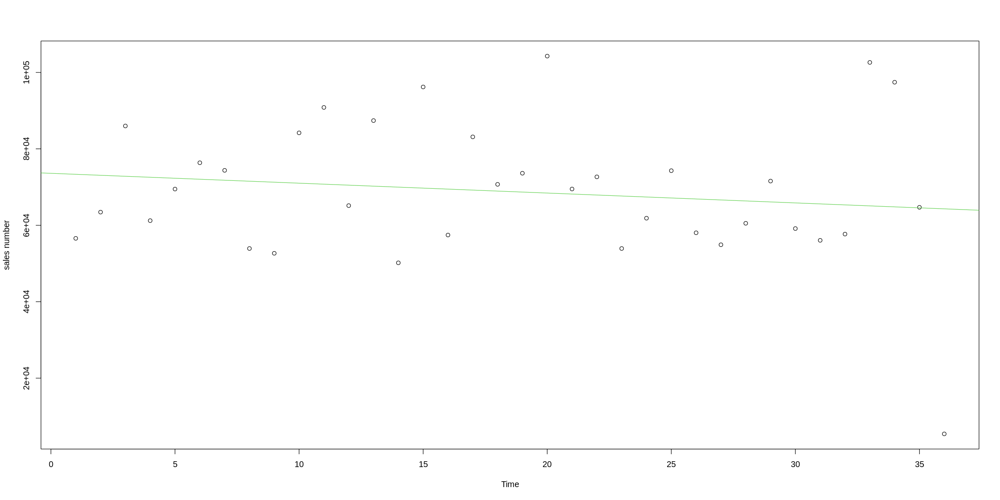

In [225]:

l_p <- lm(w~ tt)
summary(l_p)

plot(tt, w, xlab="Time", ylab="sales number")
abline(l_p, col=3)

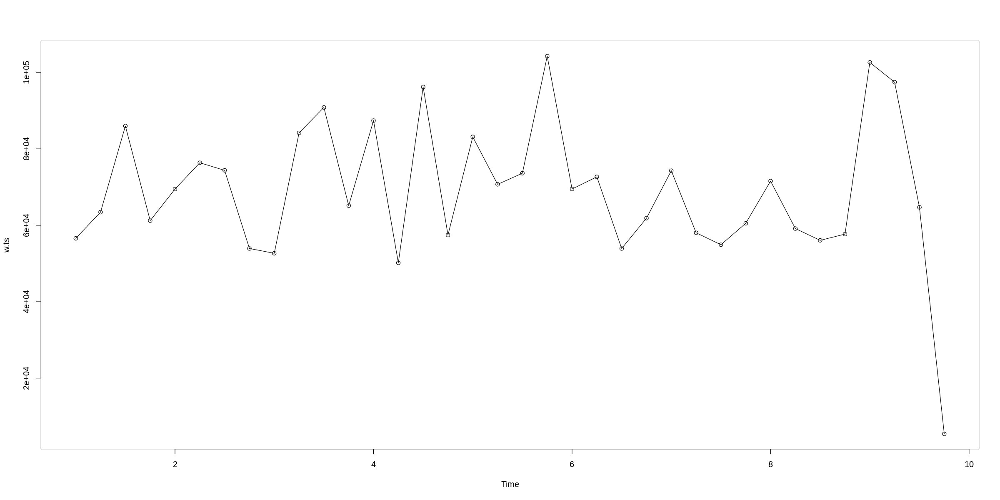

In [226]:
library("lmtest")
# dwtest(l_che)
# ##check the residuals
# resfit_b<- residuals(l_che)
# plot(resfit_b,xlab="Time", ylab="residuals" )
# ##let us do the same with a linear model for time series, so we transform the data into a ts object
w.ts <- ts(w, frequency = 4)
ts.plot(w.ts, type="o")

In [227]:
w_tslm_sea<- tslm(w.ts~trend+season)
summary(w_tslm_sea)

dwtest(w_tslm_sea)


Call:
tslm(formula = w.ts ~ trend + season)

Residuals:
   Min     1Q Median     3Q    Max 
-49851  -8978    206   5898  45658 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  77688.8     7941.1   9.783  5.4e-11 ***
trend         -209.1      296.8  -0.704   0.4865    
season2      -3686.2     8676.4  -0.425   0.6739    
season3      -1428.9     8691.6  -0.164   0.8705    
season4     -14898.6     8716.9  -1.709   0.0974 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 18390 on 31 degrees of freedom
Multiple R-squared:  0.1242,	Adjusted R-squared:  0.01114 
F-statistic: 1.099 on 4 and 31 DF,  p-value: 0.3747



	Durbin-Watson test

data:  w_tslm_sea
DW = 1.6155, p-value = 0.1299
alternative hypothesis: true autocorrelation is greater than 0


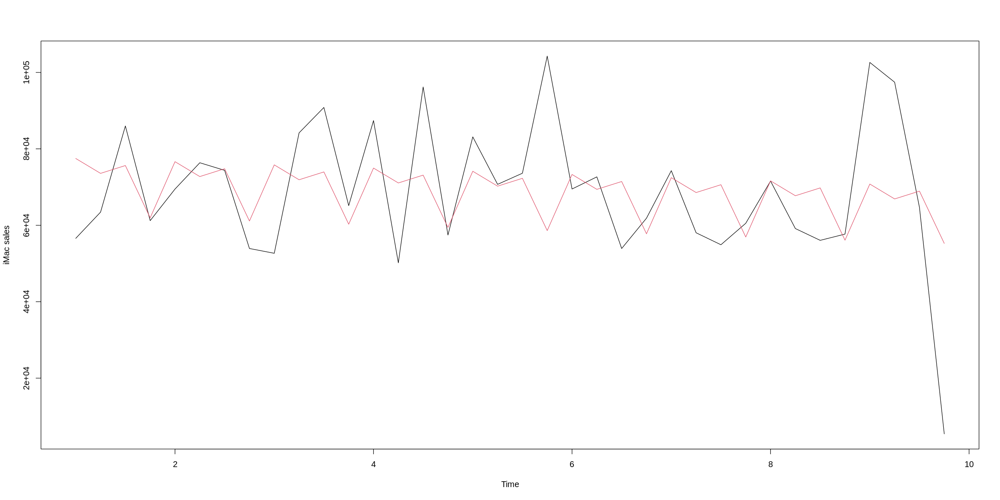

In [228]:
###plot of the model
plot(w.ts, ylab="iMac sales", xlab="Time")
lines(fitted(w_tslm_sea), col=2)

In [ ]:
d_22_w

...1,weekly
<dbl>,<int>
18,16
19,26
20,28
21,20
22,23
23,25
24,27
25,16
26,20


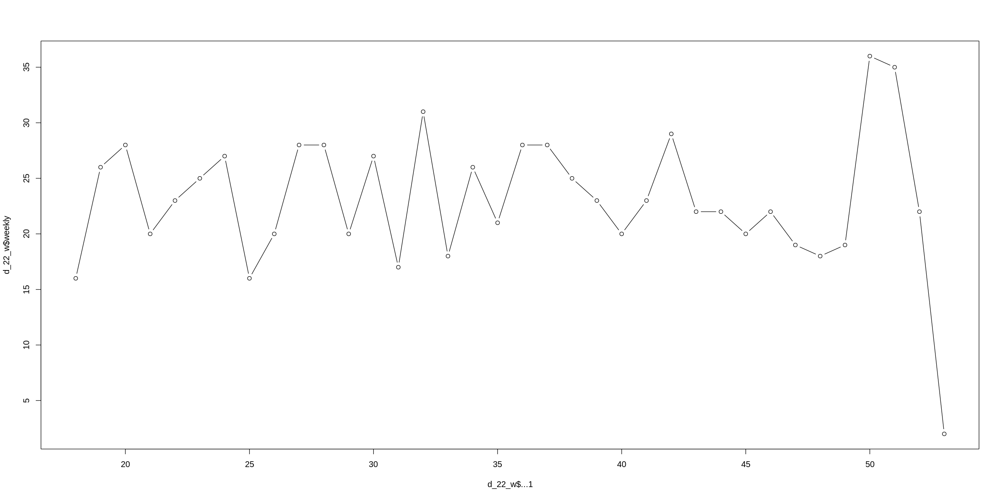

In [ ]:
plot(d_22_w$...1,d_22_w$weekly, type='b')

In [137]:
Eric <-d_total %>% filter(Salesperson=="Michael Smith")

In [138]:
Eric$Date<-as.Date(Eric$Date, "%Y-%m-%d")
Eric$year <- format(Eric$Date, '%Y')
d_22 <-Eric %>% filter(year=='2022')
d_23 <-Eric %>% filter(year=="2023")

In [139]:
week <- lubridate::week(d_22$Date)
d_22<-cbind(week,d_22)

New names:
• `` -> `...1`


In [141]:
d_22_w <-d_22 %>% group_by(...1)%>% summarise(weekly = sum(daily_sales_brand))

In [145]:
w <- d_22_w$weekly
tt<- 1:NROW(d_22_w)


Call:
lm(formula = w ~ tt)

Residuals:
     Min       1Q   Median       3Q      Max 
-20.1952  -3.4164  -0.3918   3.8011  13.6573 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 23.96508    2.10202  11.401 3.66e-13 ***
tt          -0.04916    0.09907  -0.496    0.623    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.175 on 34 degrees of freedom
Multiple R-squared:  0.007191,	Adjusted R-squared:  -0.02201 
F-statistic: 0.2463 on 1 and 34 DF,  p-value: 0.6229


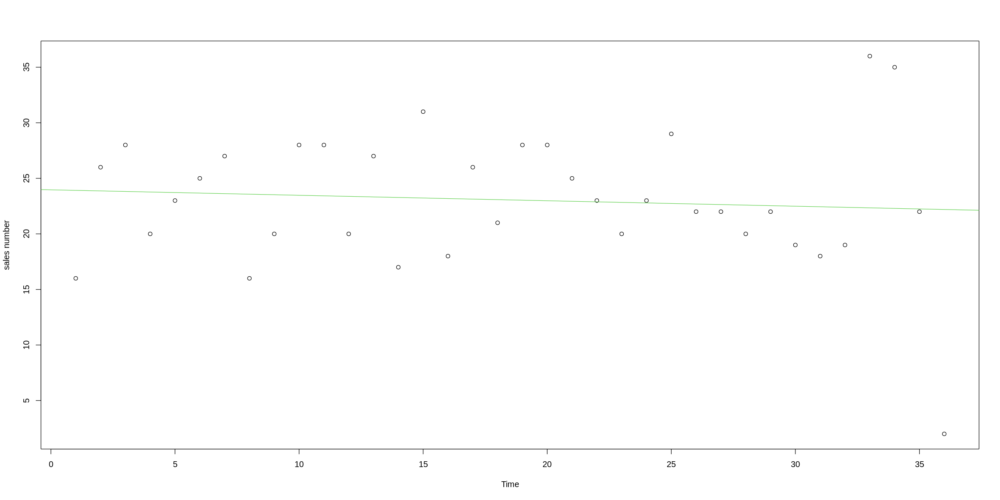

In [146]:

l_p <- lm(w~ tt)
summary(l_p)

plot(tt, w, xlab="Time", ylab="sales number")
abline(l_p, col=3)

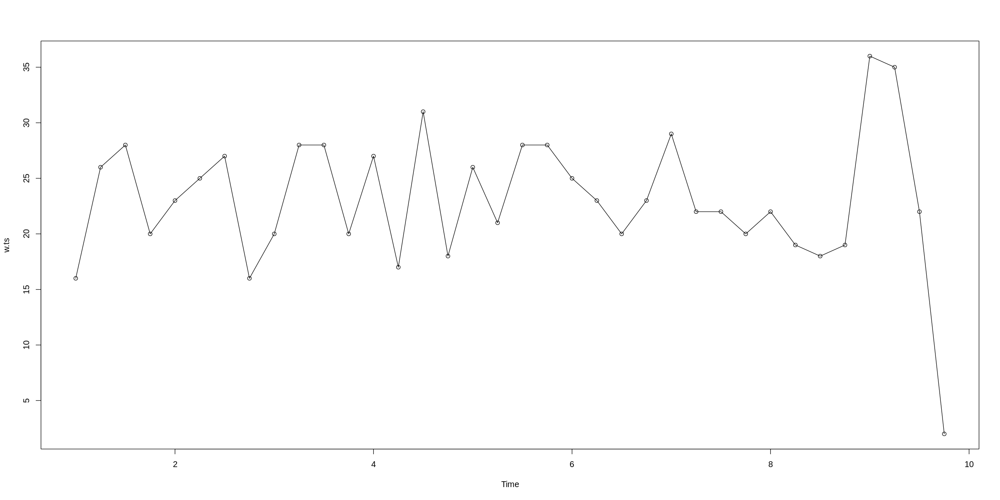

In [147]:
library("lmtest")
# dwtest(l_che)
# ##check the residuals
# resfit_b<- residuals(l_che)
# plot(resfit_b,xlab="Time", ylab="residuals" )
# ##let us do the same with a linear model for time series, so we transform the data into a ts object
w.ts <- ts(w, frequency = 4)
ts.plot(w.ts, type="o")

In [148]:
w_tslm_sea<- tslm(w.ts~trend+season)
summary(w_tslm_sea)

dwtest(w_tslm_sea)


Call:
tslm(formula = w.ts ~ trend + season)

Residuals:
     Min       1Q   Median       3Q      Max 
-15.9944  -2.6934   0.7778   2.7174  11.5611 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 25.36701    2.50405  10.130 2.35e-11 ***
trend       -0.02812    0.09360  -0.300   0.7658    
season2     -0.86076    2.73591  -0.315   0.7552    
season3      0.05625    2.74071   0.021   0.9838    
season4     -6.36007    2.74869  -2.314   0.0275 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 5.8 on 31 degrees of freedom
Multiple R-squared:  0.2013,	Adjusted R-squared:  0.09829 
F-statistic: 1.954 on 4 and 31 DF,  p-value: 0.1264



	Durbin-Watson test

data:  w_tslm_sea
DW = 1.4109, p-value = 0.04065
alternative hypothesis: true autocorrelation is greater than 0


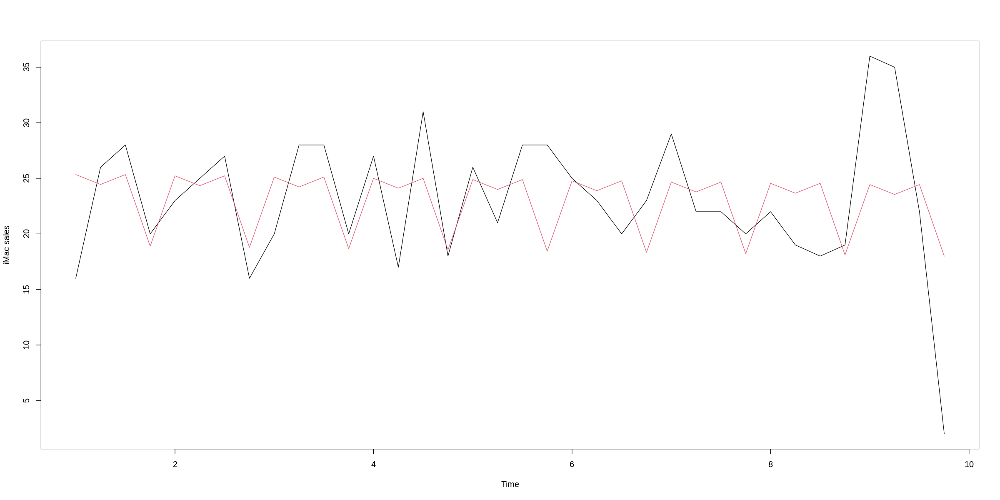

In [149]:
###plot of the model
plot(w.ts, ylab="iMac sales", xlab="Time")
lines(fitted(w_tslm_sea), col=2)

In [142]:
d_22_w

...1,weekly
<dbl>,<int>
18,16
19,26
20,28
21,20
22,23
23,25
24,27
25,16
26,20


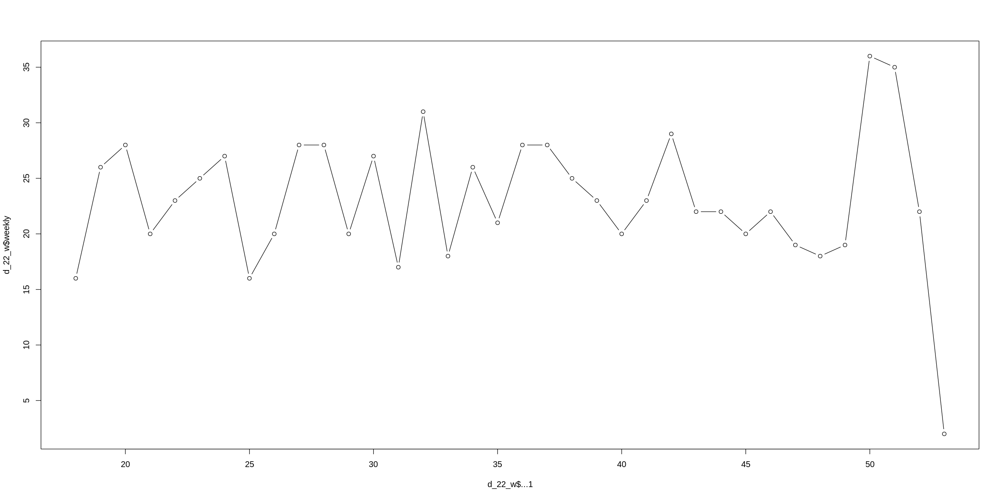

In [143]:
plot(d_22_w$...1,d_22_w$weekly, type='b')

In [107]:
head(d_total)
tt<-1:NROW(d_total)

Date,daily_sales_brand
<chr>,<int>
2022-05-01,6887
2022-05-02,6811
2022-05-03,6810
2022-05-04,6953
2022-05-05,6815
2022-05-06,6799


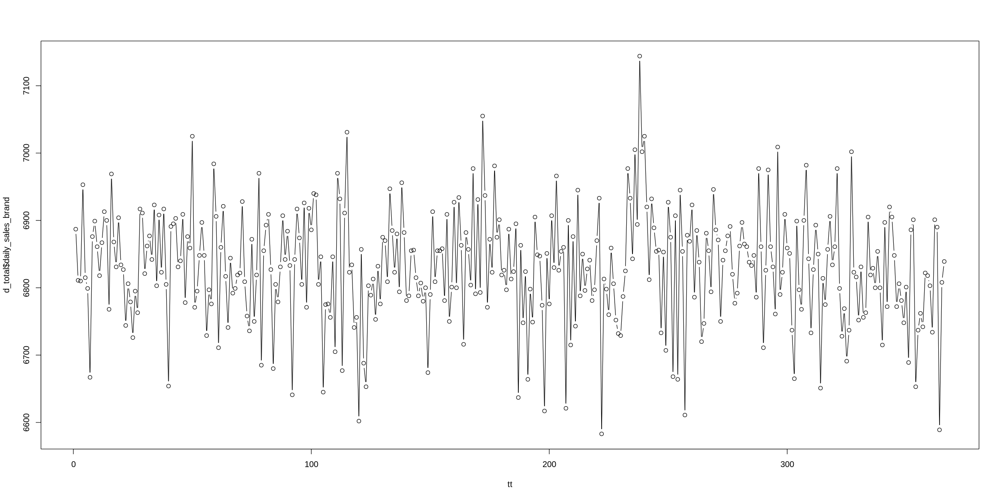

In [108]:
plot(tt, d_total$daily_sales_brand, type='b')
# plot(c_10$...1,c_10$weekly, type='b')

In [89]:
d_sales<-car %>% group_by(Date,Car.Make)%>% summarise(daily_sales_brand = n())
head(d_sales)

`summarise()` has grouped output by 'Date'. You can override using the
`.groups` argument.


Date,Car.Make,daily_sales_brand
<chr>,<chr>,<int>
2022-05-01,Chevrolet,1437
2022-05-01,Ford,1356
2022-05-01,Honda,1368
2022-05-01,Nissan,1351
2022-05-01,Toyota,1375
2022-05-02,Chevrolet,1413


In [90]:
NROW(unique(d_sales["Car.Make"]))

[1] 5

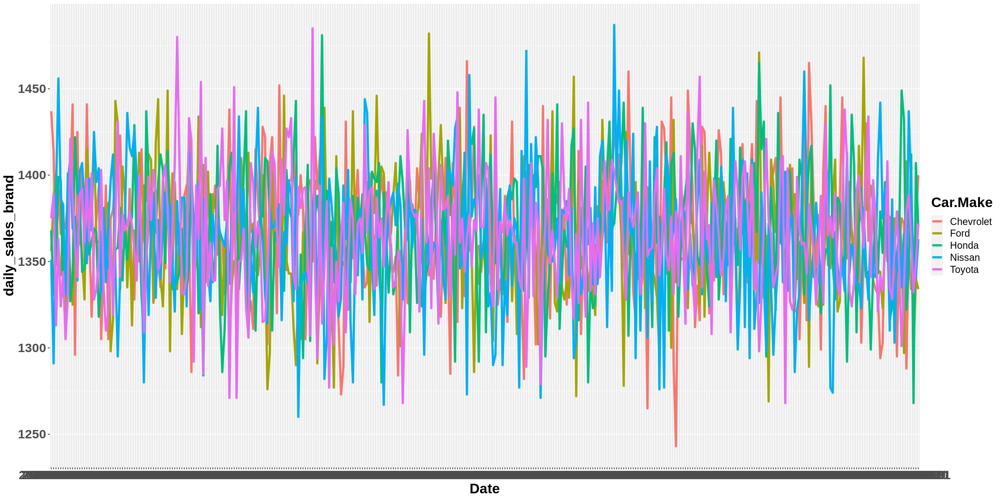

In [91]:
library(ggplot2)
options(repr.plot.width=20, repr.plot.height=10)

ggplot(d_sales, aes(x = Date, y = daily_sales_brand, colour =Car.Make, group = Car.Make)) +
geom_line(size=1.5)+
theme(legend.text = element_text(size = 14),
      axis.text.y = element_text(face="bold", size=18),
      axis.text.x = element_text(face="bold", size=18),
      axis.title.x = element_text(size = 20),
      axis.title.y = element_text(size = 20),
      title =element_text(size=20, face='bold'))

#weekly

In [52]:
m_toyota <-car %>% filter(Car.Make=="Toyota")
m_toy_sales <-m_toyota %>% group_by(Date,Car.Year)%>% summarise(daily_sales_brand = n())

`summarise()` has grouped output by 'Date'. You can override using the
`.groups` argument.


In [65]:
m_toy_sales$Date<-as.Date(m_toy_sales$Date, "%Y-%m-%d")

In [66]:
m_toy_sales$year <- format(m_toy_sales$Date, '%Y')

In [71]:
d_22 <-m_toy_sales %>% filter(year=='2022')
d_23 <-m_toy_sales %>% filter(year=="2023")

In [72]:
week <- lubridate::week(d_22$Date)

In [73]:
d_22<-cbind(week,d_22)

New names:
• `` -> `...1`


In [79]:
d_22

...1,Date,Car.Year,daily_sales_brand,year
<dbl>,<date>,<int>,<int>,<chr>
18,2022-05-01,2010,126,2022
18,2022-05-01,2011,104,2022
18,2022-05-01,2012,96,2022
18,2022-05-01,2013,110,2022
18,2022-05-01,2014,85,2022
18,2022-05-01,2015,118,2022
18,2022-05-01,2016,99,2022
18,2022-05-01,2017,94,2022
18,2022-05-01,2018,106,2022


In [80]:
d_22_w <-d_22 %>% group_by(...1,Car.Year)%>% summarise(weekly = sum(daily_sales_brand))

`summarise()` has grouped output by '...1'. You can override using the
`.groups` argument.


In [81]:
d_22_w

...1,Car.Year,weekly
<dbl>,<int>,<int>
18,2010,682
18,2011,595
18,2012,599
18,2013,633
18,2014,598
18,2015,631
18,2016,626
18,2017,596
18,2018,638


In [86]:
c_10 <-d_22_w %>% filter(Car.Year=="2022")

In [83]:
c_10

...1,Car.Year,weekly
<dbl>,<int>,<int>
18,2010,682
19,2010,748
20,2010,742
21,2010,717
22,2010,739
23,2010,741
24,2010,703
25,2010,713
26,2010,764


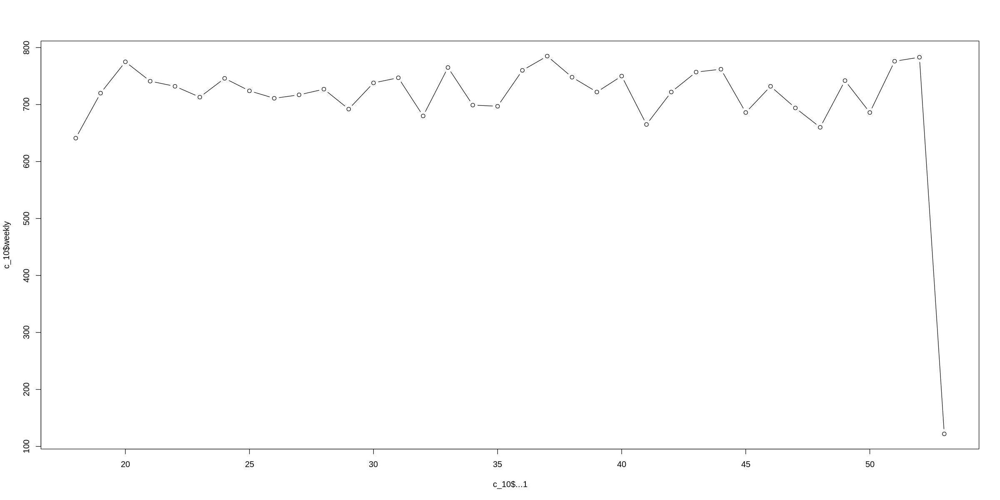

In [87]:
plot(c_10$...1,c_10$weekly, type='b')

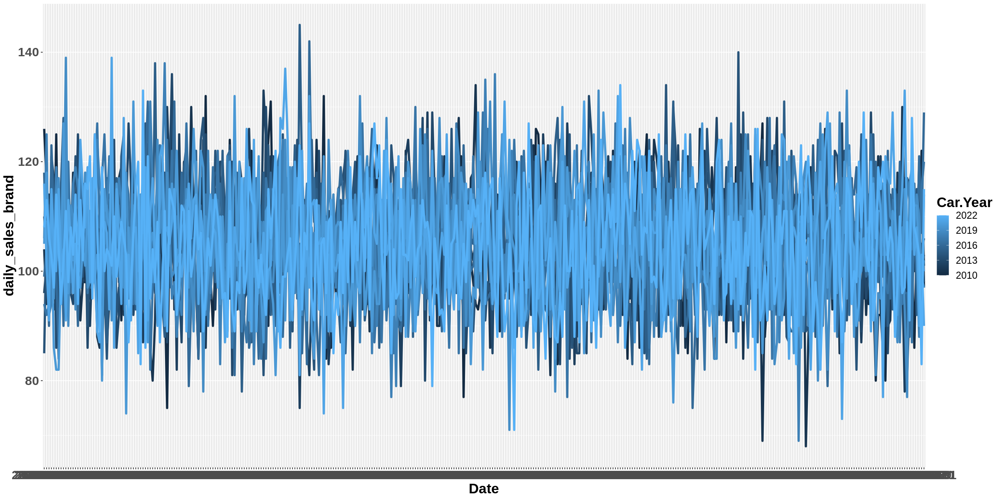

In [48]:
library(ggplot2)
options(repr.plot.width=20, repr.plot.height=10)

ggplot(m_toy_sales, aes(x = Date, y = daily_sales_brand, colour =Car.Year, group = Car.Year)) +
geom_line(size=1.5)+
theme(legend.text = element_text(size = 14),
      axis.text.y = element_text(face="bold", size=18),
      axis.text.x = element_text(face="bold", size=18),
      axis.title.x = element_text(size = 20),
      axis.title.y = element_text(size = 20),
      title =element_text(size=20, face='bold'))

#Chevrolet

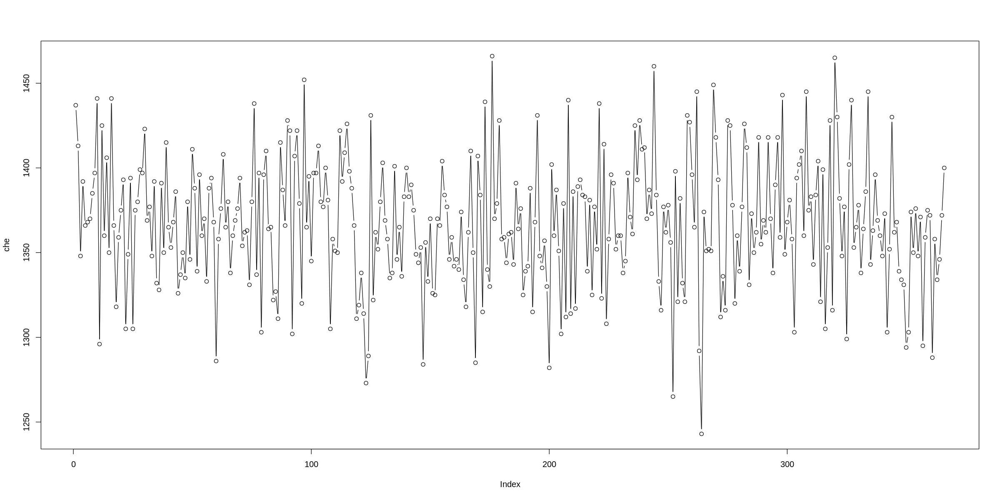

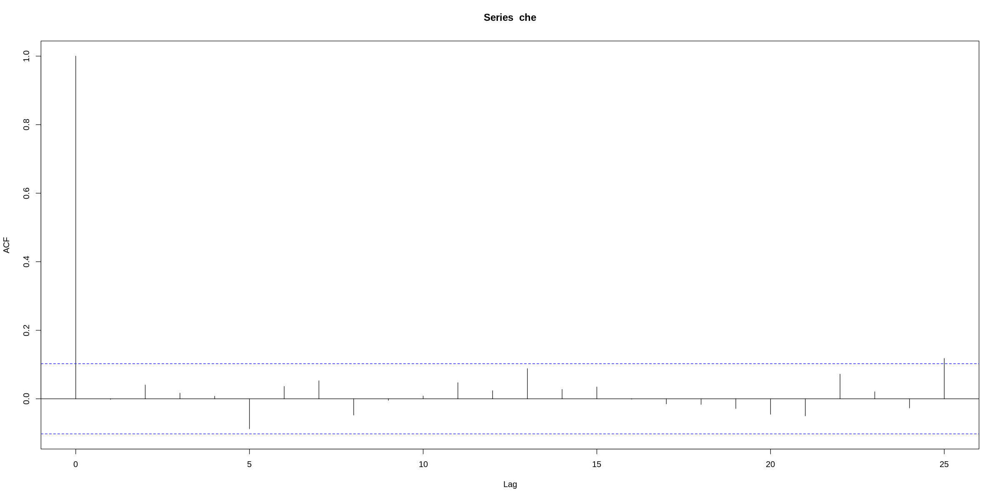

In [92]:
Chevrolet<-d_sales %>% filter(Car.Make=="Chevrolet")
che <- Chevrolet$daily_sales_brand
N_che <- 1:NROW(Chevrolet)
plot(che, type='b')
acf(che)


Call:
lm(formula = che ~ N_che)

Residuals:
     Min       1Q   Median       3Q      Max 
-123.376  -23.724   -1.477   24.129   99.311 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) 1369.61434    4.01270 341.320   <2e-16 ***
N_che         -0.01227    0.01895  -0.647    0.518    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 38.31 on 364 degrees of freedom
Multiple R-squared:  0.00115,	Adjusted R-squared:  -0.001594 
F-statistic: 0.419 on 1 and 364 DF,  p-value: 0.5178


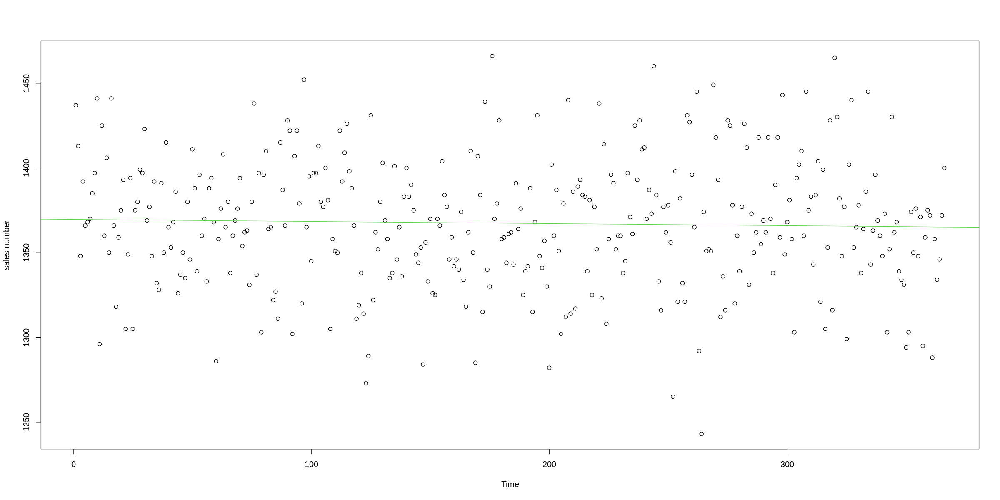

In [93]:
##fit a linear regression
l_che <- lm(che~ N_che)
summary(l_che)

plot(N_che, che, xlab="Time", ylab="sales number")
abline(l_che, col=3)


	Durbin-Watson test

data:  l_che
DW = 1.995, p-value = 0.4598
alternative hypothesis: true autocorrelation is greater than 0


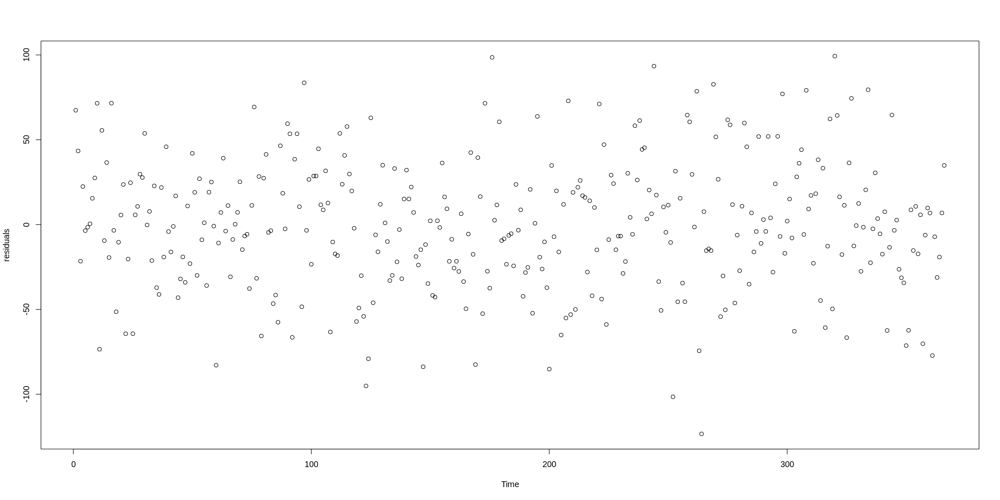

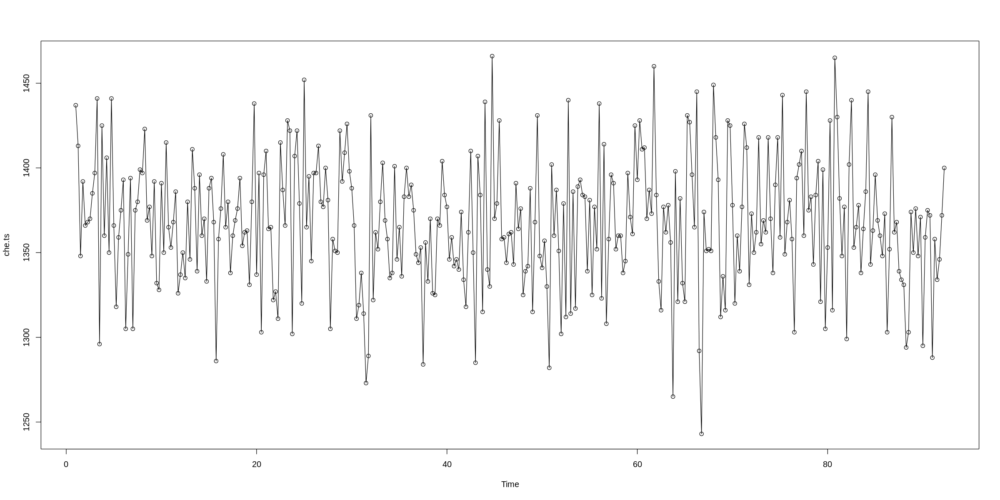

In [94]:
library("lmtest")
dwtest(l_che)
##check the residuals
resfit_b<- residuals(l_che)
plot(resfit_b,xlab="Time", ylab="residuals" )
##let us do the same with a linear model for time series, so we transform the data into a ts object
che.ts <- ts(che, frequency = 4)
ts.plot(che.ts, type="o")

In [95]:
che_tslm<- tslm(che.ts~trend)
summary(che_tslm)

dwtest(che_tslm)


Call:
tslm(formula = che.ts ~ trend)

Residuals:
     Min       1Q   Median       3Q      Max 
-123.376  -23.724   -1.477   24.129   99.311 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) 1369.61434    4.01270 341.320   <2e-16 ***
trend         -0.01227    0.01895  -0.647    0.518    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 38.31 on 364 degrees of freedom
Multiple R-squared:  0.00115,	Adjusted R-squared:  -0.001594 
F-statistic: 0.419 on 1 and 364 DF,  p-value: 0.5178



	Durbin-Watson test

data:  che_tslm
DW = 1.995, p-value = 0.4598
alternative hypothesis: true autocorrelation is greater than 0


In [96]:
che_tslm_sea<- tslm(che.ts~trend+season)
summary(che_tslm_sea)

dwtest(che_tslm_sea)


Call:
tslm(formula = che.ts ~ trend + season)

Residuals:
     Min       1Q   Median       3Q      Max 
-121.356  -23.878   -1.479   24.294  101.334 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) 1370.03548    5.29952 258.521   <2e-16 ***
trend         -0.01231    0.01899  -0.648    0.517    
season2        3.53405    5.65879   0.625    0.533    
season3       -2.80459    5.67429  -0.494    0.621    
season4       -2.42964    5.67432  -0.428    0.669    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 38.38 on 361 degrees of freedom
Multiple R-squared:  0.005525,	Adjusted R-squared:  -0.005494 
F-statistic: 0.5014 on 4 and 361 DF,  p-value: 0.7347



	Durbin-Watson test

data:  che_tslm_sea
DW = 1.995, p-value = 0.4809
alternative hypothesis: true autocorrelation is greater than 0



	Durbin-Watson test

data:  che_tslm_sea
DW = 1.995, p-value = 0.4809
alternative hypothesis: true autocorrelation is greater than 0


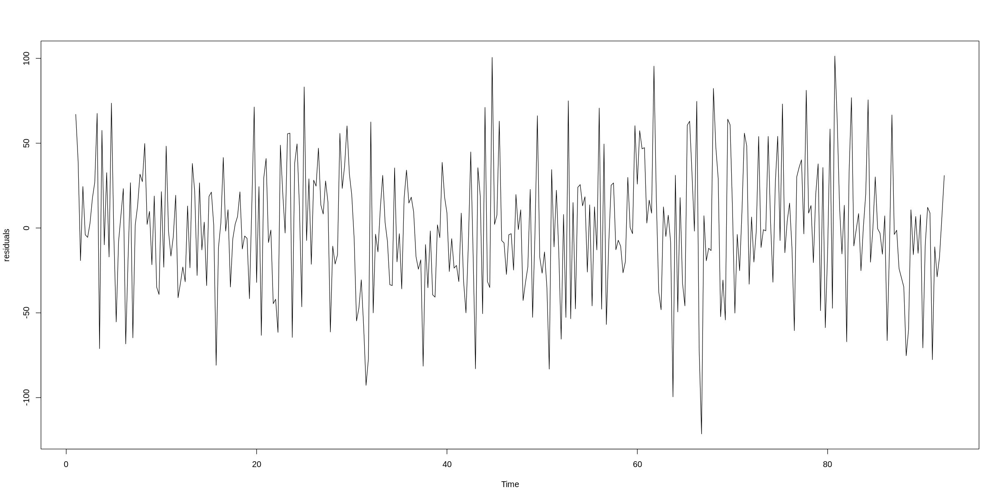

In [98]:
#check the residuals
res_che <- residuals(che_tslm_sea)

plot(res_che, ylab="residuals")
dwtest(che_tslm_sea)

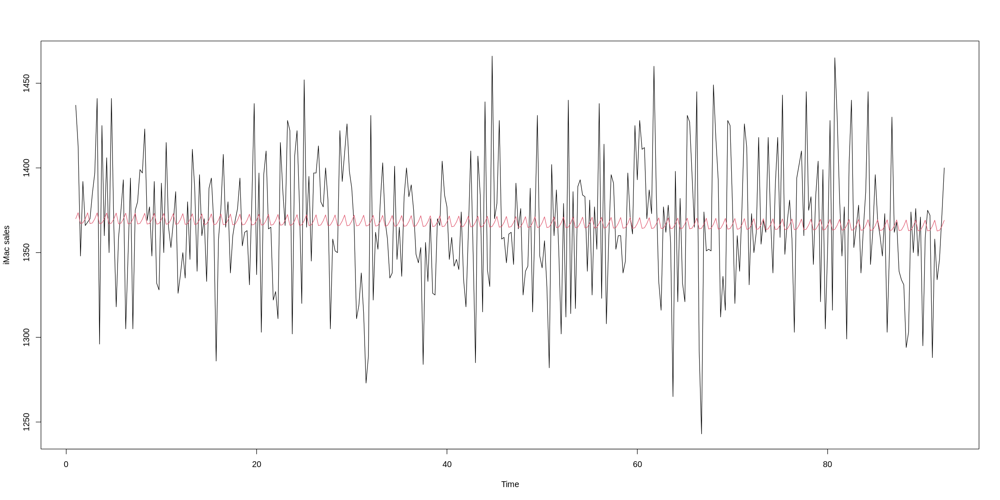

In [111]:
###plot of the model
plot(che.ts, ylab="iMac sales", xlab="Time")
lines(fitted(che_tslm_sea), col=2)

#Ford

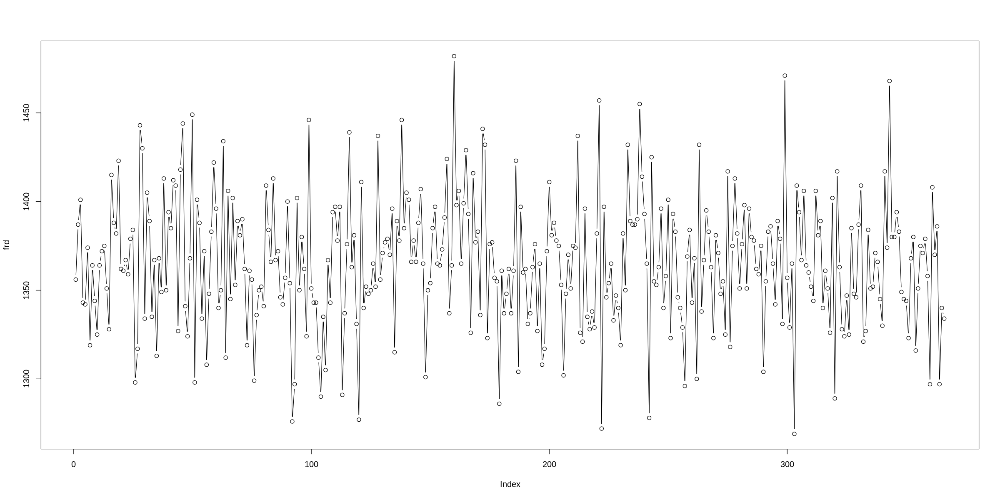

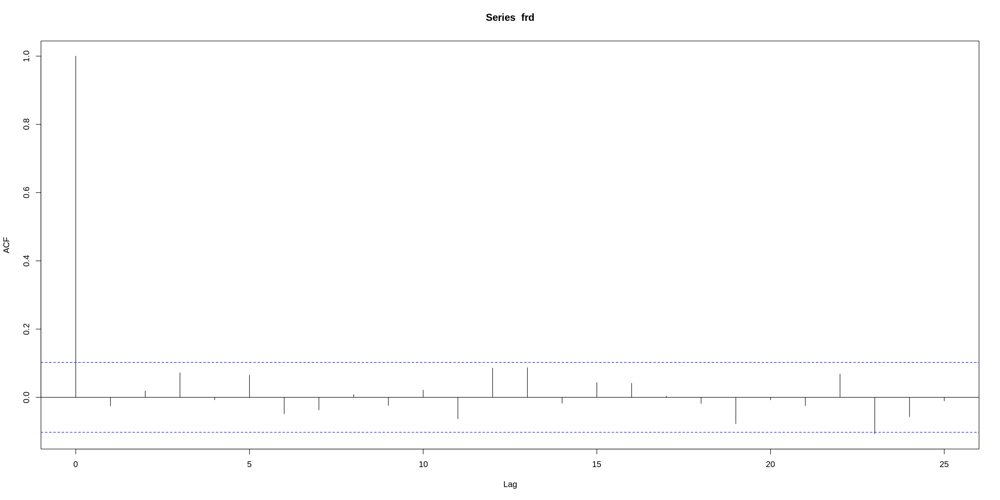

In [35]:
Ford<-d_sales %>% filter(Car.Make=="Ford")
frd <- Ford$daily_sales_brand
N_frd <- 1:NROW(Ford)

plot(frd, type='b')
acf(frd)


Call:
lm(formula = frd ~ N_frd)

Residuals:
    Min      1Q  Median      3Q     Max 
-94.761 -23.700  -0.774  22.046 116.132 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) 1368.22514    3.82746 357.476   <2e-16 ***
N_frd         -0.01473    0.01808  -0.815    0.416    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 36.54 on 364 degrees of freedom
Multiple R-squared:  0.001821,	Adjusted R-squared:  -0.0009208 
F-statistic: 0.6642 on 1 and 364 DF,  p-value: 0.4156


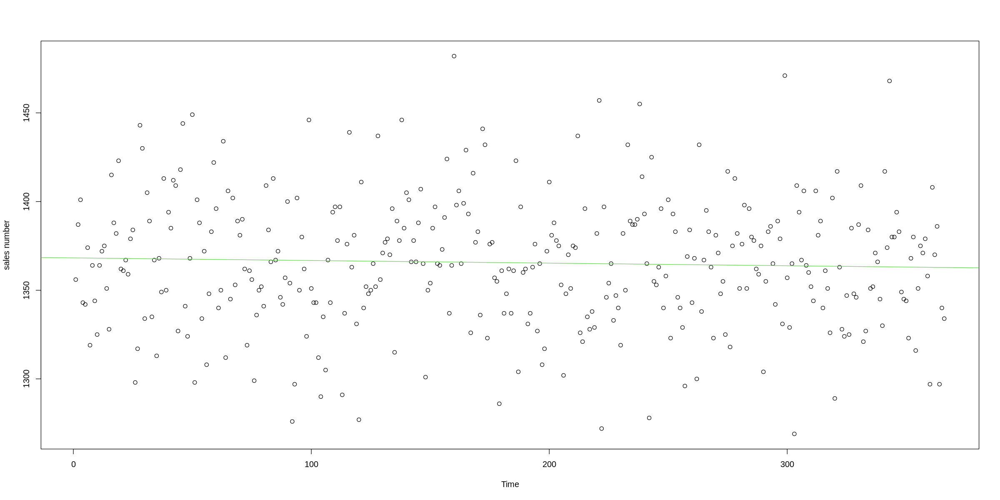

In [36]:
##fit a linear regression
l_frd <- lm(frd~ N_frd)
summary(l_frd)

plot(N_frd, frd, xlab="Time", ylab="sales number")
abline(l_frd, col=3)

#Honda

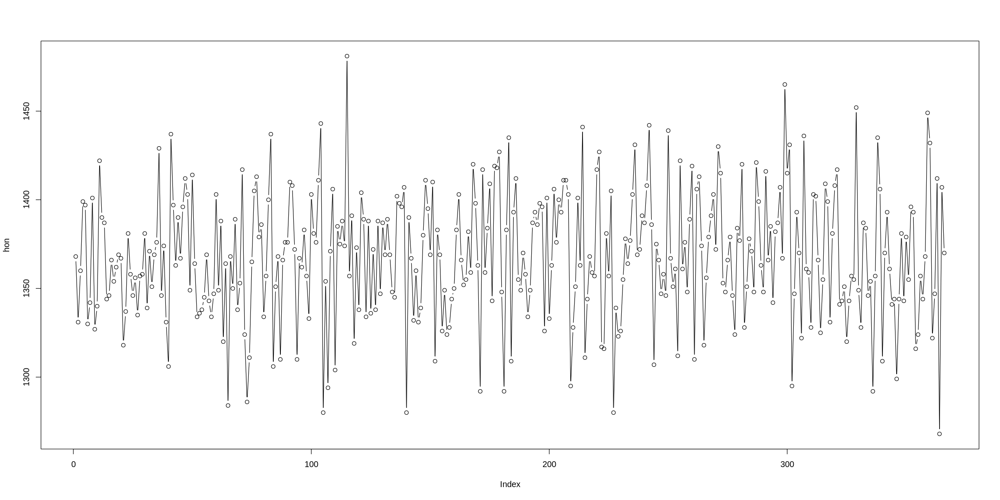

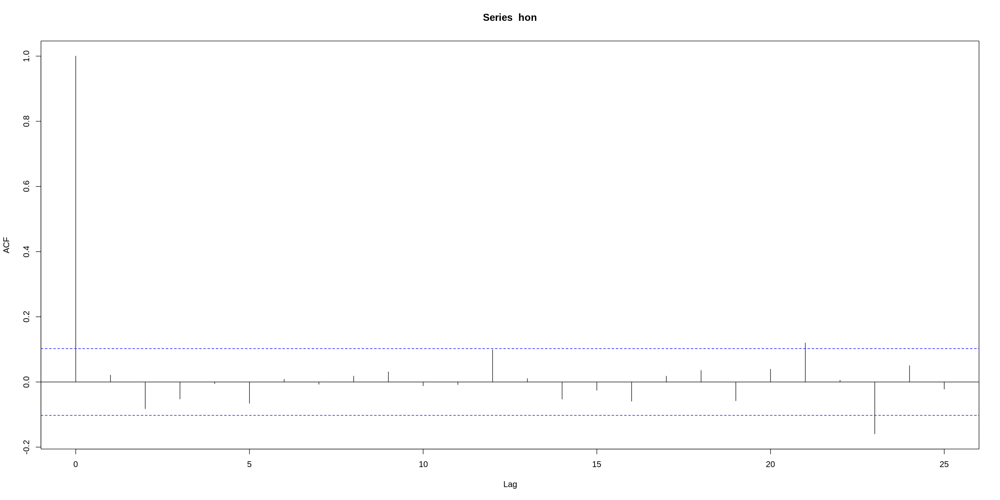

In [37]:
Honda<-d_sales %>% filter(Car.Make=="Honda")
hon <- Honda$daily_sales_brand
N_hon <- 1:NROW(Honda)

plot(hon, type='b')
acf(hon)


Call:
lm(formula = hon ~ N_hon)

Residuals:
     Min       1Q   Median       3Q      Max 
-103.307  -23.196   -0.429   24.887  114.259 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 1.365e+03  3.776e+00 361.360   <2e-16 ***
N_hon       1.834e-02  1.783e-02   1.028    0.305    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 36.05 on 364 degrees of freedom
Multiple R-squared:  0.002895,	Adjusted R-squared:  0.0001559 
F-statistic: 1.057 on 1 and 364 DF,  p-value: 0.3046


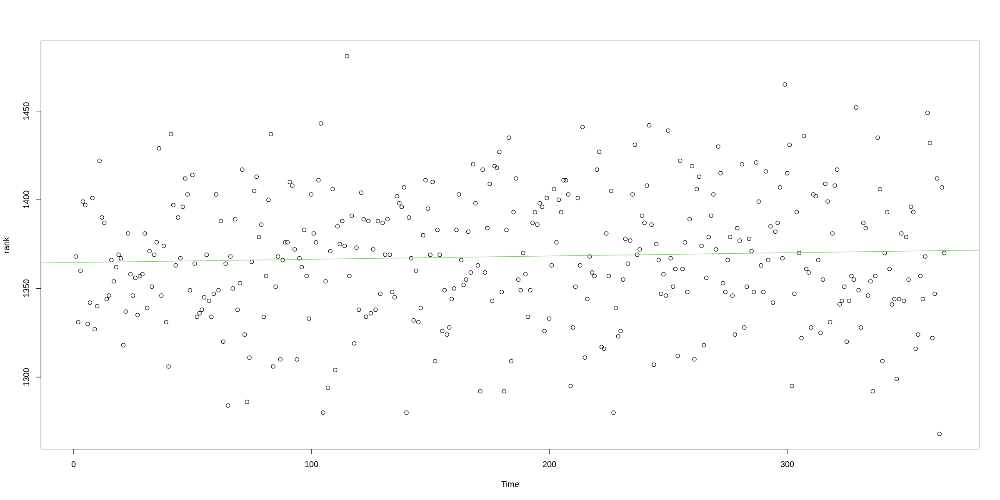

In [38]:
##fit a linear regression
l_hon <- lm(hon~ N_hon)
summary(l_hon)

plot(N_hon, hon, xlab="Time", ylab="rank")
abline(l_hon, col=3)

#Nissan

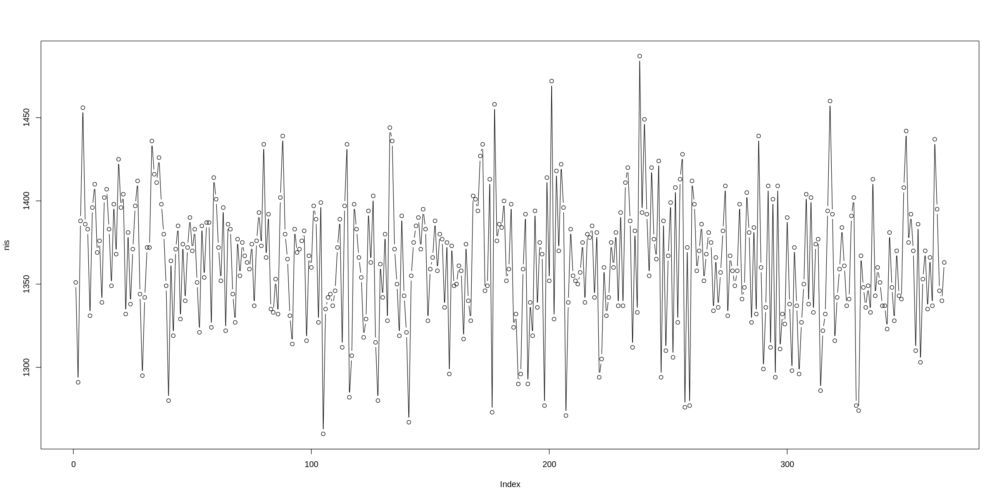

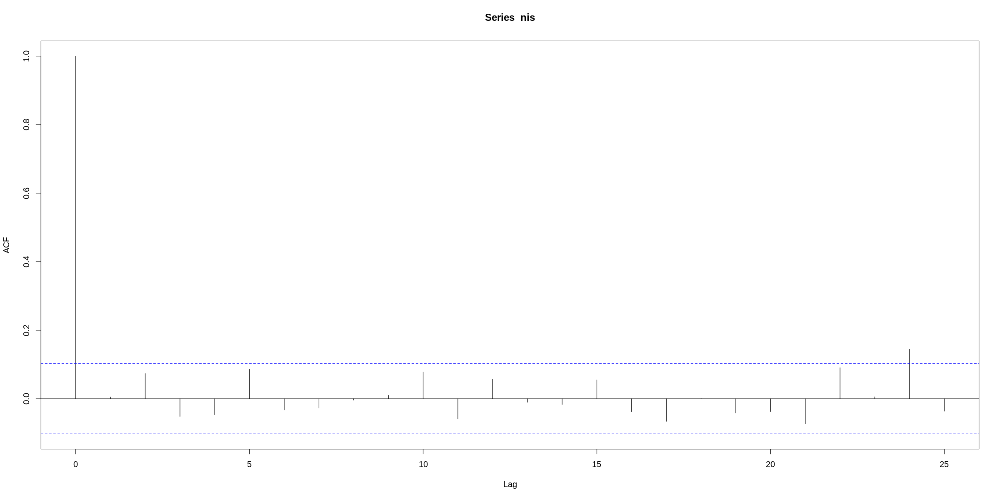

In [39]:
Nissan<-d_sales %>% filter(Car.Make=="Nissan")
nis <- Nissan$daily_sales_brand
N_nis <- 1:NROW(Nissan)

plot(nis, type='b')
acf(nis)


Call:
lm(formula = nis ~ N_nis)

Residuals:
     Min       1Q   Median       3Q      Max 
-106.154  -24.325    1.804   25.260  125.856 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) 1370.10887    4.03083 339.907   <2e-16 ***
N_nis         -0.03767    0.01904  -1.979   0.0486 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 38.48 on 364 degrees of freedom
Multiple R-squared:  0.01064,	Adjusted R-squared:  0.007924 
F-statistic: 3.915 on 1 and 364 DF,  p-value: 0.0486


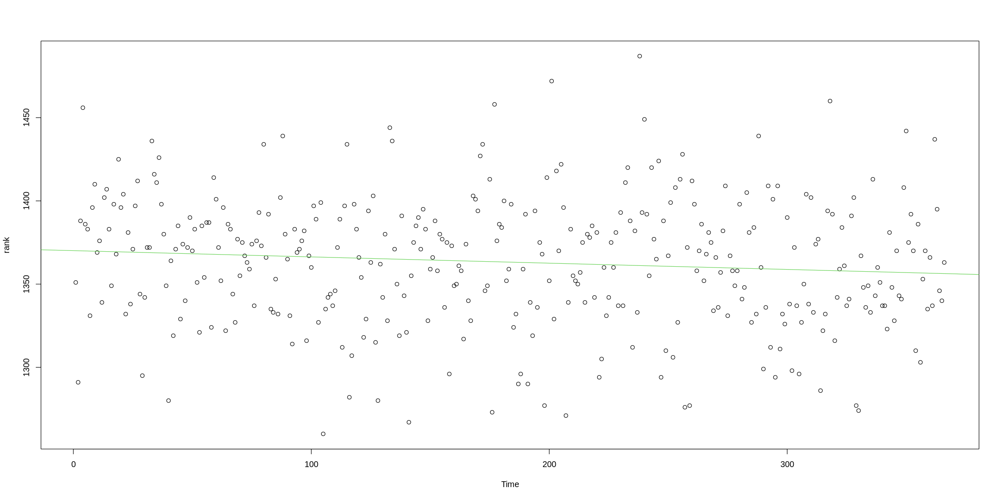

In [40]:
##fit a linear regression
l_nis <- lm(nis~ N_nis)
summary(l_nis)

plot(N_nis, nis, xlab="Time", ylab="rank")
abline(l_nis, col=3)

#Toyota

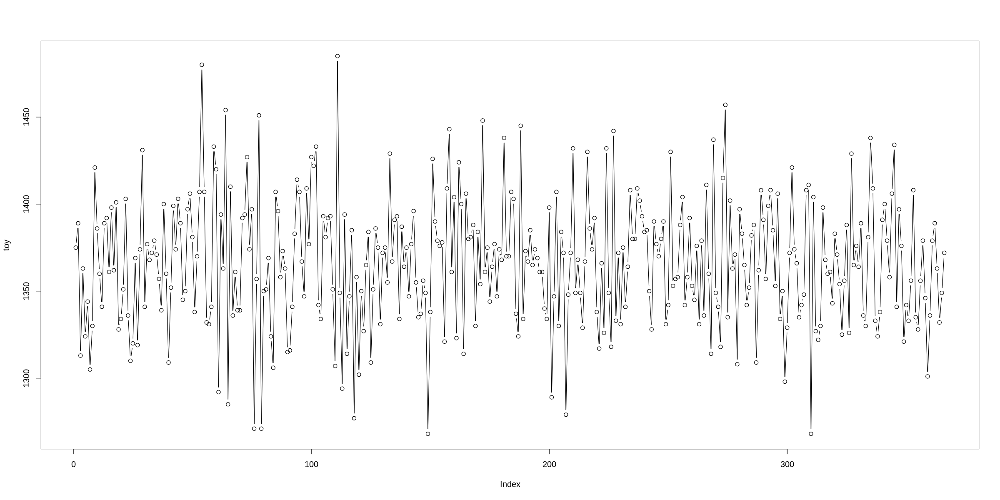

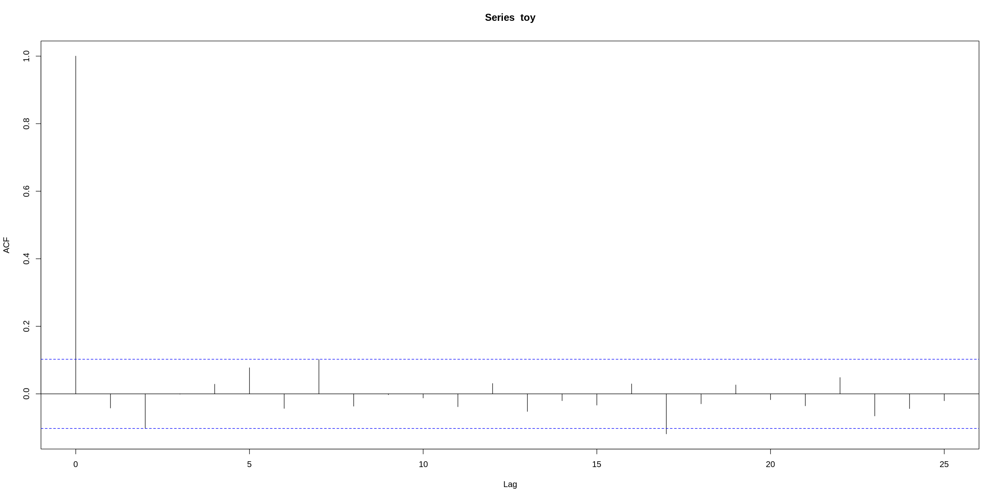

In [41]:
Toyota<-d_sales %>% filter(Car.Make=="Toyota")
toy <- Toyota$daily_sales_brand
N_toy <- 1:NROW(Toyota)

plot(toy, type='b')
acf(toy)


Call:
lm(formula = toy ~ N_toy)

Residuals:
    Min      1Q  Median      3Q     Max 
-98.660 -26.108   0.204  24.147 118.188 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  1.367e+03  3.847e+00  355.44   <2e-16 ***
N_toy       -4.004e-03  1.817e-02   -0.22    0.826    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 36.72 on 364 degrees of freedom
Multiple R-squared:  0.0001334,	Adjusted R-squared:  -0.002613 
F-statistic: 0.04858 on 1 and 364 DF,  p-value: 0.8257


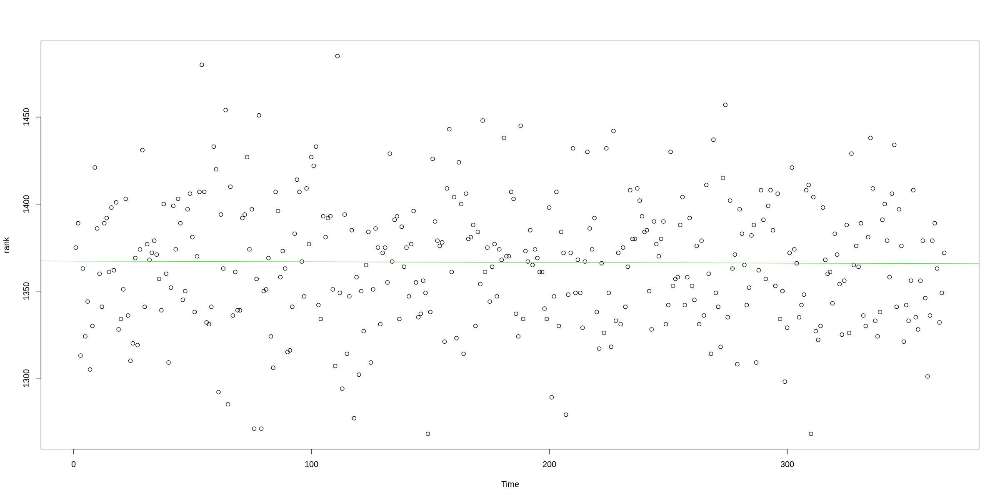

In [42]:
##fit a linear regression
l_toy <- lm(toy~ N_toy)
summary(l_toy)

plot(N_toy, toy, xlab="Time", ylab="rank")
abline(l_toy, col=3)

#models of toyota

#baghiye

In [ ]:
###read the data
NBA<- read_excel("NBA_Stats_71_Years.xlsx")
#str(NBA)
##create a variable 'time'
tt<- 1:NROW(NBA)
NROW(unique(NBA["Player"]))
NBA<-data.frame(NBA)

sum.NBA <- aggregate(Points.Scored ~ Player, NBA, sum)

names(sum.NBA)[2] <- "sum_point"

NBA_player_merge<-merge(NBA, sum.NBA)
head(NBA_player_merge[order(-NBA_player_merge$sum_point),])

[1] 4387

,Player,Rank,Year,Season.Start.Year,Season.Type,Player.ID,Team.ID,Team,Games.Played,Minutes.Played,⋯,Assists,Steals,Blocks,Turnovers,Personal.Fouls,Points.Scored,Efficency,AST.TOV,STL.TOV,sum_point
,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<dbl>
20296,LeBron James,44,2020-21,2020,Playoffs,2544,1610612747,LAL,6,224,⋯,48,TRUE,TRUE,TRUE,7,140,148,TRUE,FALSE,46675
20297,LeBron James,6,2022-23,2022,Playoffs,2544,1610612747,LAL,16,619,⋯,104,TRUE,TRUE,TRUE,28,392,479,TRUE,FALSE,46675
20298,LeBron James,2,2011-12,2011,Regular Season,2544,1610612748,MIA,62,2326,⋯,387,TRUE,TRUE,TRUE,96,1683,1851,TRUE,FALSE,46675
20299,LeBron James,8,2009-10,2009,Playoffs,2544,1610612739,CLE,11,460,⋯,84,TRUE,TRUE,TRUE,23,320,366,TRUE,FALSE,46675
20300,LeBron James,1,2017-18,2017,Regular Season,2544,1610612739,CLE,82,3026,⋯,747,TRUE,TRUE,TRUE,136,2251,2681,TRUE,FALSE,46675
20301,LeBron James,2,2005-06,2005,Regular Season,2544,1610612739,CLE,79,3361,⋯,521,TRUE,TRUE,TRUE,181,2478,2323,TRUE,FALSE,46675


In [ ]:
sum.NBA.team <- aggregate(Points.Scored ~Team+Year, NBA, sum)

names(sum.NBA.team)[3] <- "sum_point_Team"
NBA_team_merge<-merge(NBA, sum.NBA.team)

NBA_team_merge<-NBA_team_merge[order(-NBA_team_merge$sum_point_Team),]

NBA_team_merge<-(NBA_team_merge[,c(1,2,ncol(NBA_team_merge))])
NBA_team_merge
head(unique(NBA_team_merge["Team"]))

,Year,Team,sum_point_Team
,<chr>,<chr>,<dbl>
32898,2022-23,LAL,12289
32899,2022-23,LAL,12289
32900,2022-23,LAL,12289
32901,2022-23,LAL,12289
32902,2022-23,LAL,12289
32903,2022-23,LAL,12289
32904,2022-23,LAL,12289
32905,2022-23,LAL,12289
32906,2022-23,LAL,12289


,Team
,<chr>
32898,LAL
29882,MIL
30147,TOR
29698,GSW
30073,POR
2647,PHL


In [ ]:
NBA<-data.frame(NBA)
head(NBA)

,Rank,Year,Season.Start.Year,Season.Type,Player.ID,Player,Team.ID,Team,Games.Played,Minutes.Played,⋯,Rebounds,Assists,Steals,Blocks,Turnovers,Personal.Fouls,Points.Scored,Efficency,AST.TOV,STL.TOV
,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>
1,1,1951-52,1951,Regular Season,76056,Paul Arizin,1610612744,PHW,66,2939,⋯,745,170,NA,NA,NA,250,1674,1786,NA,NA
2,2,1951-52,1951,Regular Season,600012,George Mikan,1610612747,MNL,64,2572,⋯,866,194,NA,NA,NA,286,1523,1592,NA,NA
3,3,1951-52,1951,Regular Season,600003,Bob Cousy,1610612738,BOS,66,2681,⋯,421,441,NA,NA,NA,190,1433,1322,NA,NA
4,4,1951-52,1951,Regular Season,77429,Ed Macauley,1610612738,BOS,66,2631,⋯,529,232,NA,NA,NA,174,1264,1396,NA,NA
5,5,1951-52,1951,Regular Season,76514,Bob Davies,1610612758,ROC,65,2394,⋯,189,390,NA,NA,NA,269,1052,935,NA,NA
6,6,1951-52,1951,Regular Season,76250,Frank Brian,1610612765,FTW,66,2672,⋯,232,233,NA,NA,NA,220,1051,820,NA,NA


In [ ]:
mean.NBA.team <- aggregate(Points.Scored ~Team+Season.Start.Year, NBA, sum)

names(mean.NBA.team)[3] <- "point_score_Team"
head(mean.NBA.team)

,Team,Season.Start.Year,point_score_Team
,<chr>,<dbl>,<dbl>
1,BAL,1951,4920
2,BOS,1951,6316
3,FTW,1951,5868
4,INO,1951,5622
5,MIH,1951,4216
6,MNL,1951,6936


In [ ]:
library(dplyr)

mean.NBA.team_count<-mean.NBA.team %>% group_by(Team)%>% summarise(total_count = n())
head(mean.NBA.team_count[order(-mean.NBA.team_count$total_count),])

Team,total_count
<chr>,<int>
BOS,72
NYK,72
DET,66
LAL,63
CHI,57
ATL,55


In [ ]:
BOS<-mean.NBA.team%>% filter(Team=="BOS")
tt_Bos<-BOS$Season.Start.Year
N_BOS<-1:NROW(BOS)
DET<-mean.NBA.team%>% filter(Team=="DET")
tt_Det<-DET$Season.Start.Year
N_DET<-1:NROW(DET)
LAL<-mean.NBA.team%>% filter(Team=="LAL")
tt_Lal<-LAL$Season.Start.Year
N_LAL<-1:NROW(LAL)Rank_Mean
NYK<-mean.NBA.team%>% filter(Team=="NYK")
tt_Nyk<-NYK$Season.Start.Year
N_NYK<-1:NROW(NYK)

In [ ]:
team_data<-rbind(BOS,DET,LAL,NYK)
head(team_data)

,Team,Season.Start.Year,point_score_Team
,<chr>,<dbl>,<dbl>
1,BOS,1951,6316
2,BOS,1952,6789
3,BOS,1953,6922
4,BOS,1954,8041
5,BOS,1955,7937
6,BOS,1956,8611


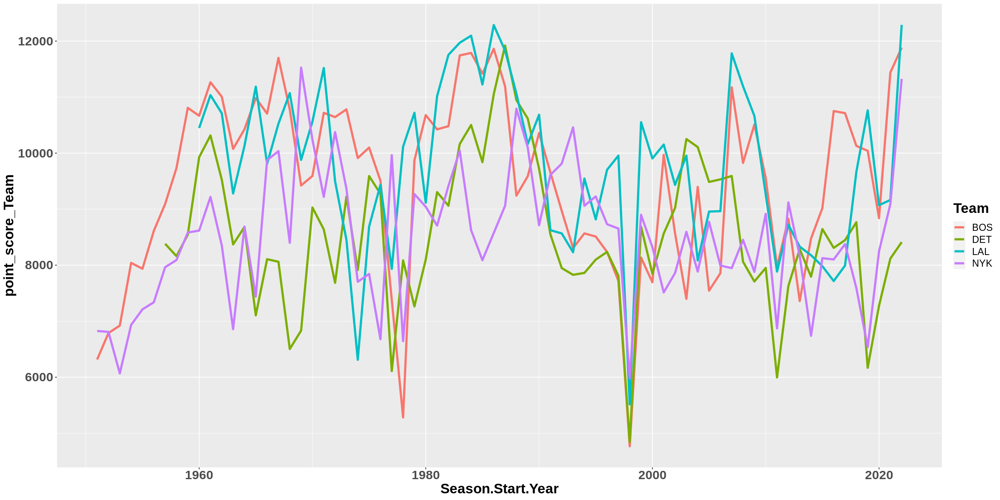

In [ ]:
library(ggplot2)
options(repr.plot.width=20, repr.plot.height=10)

ggplot(team_data, aes(x = Season.Start.Year, y = point_score_Team, colour =Team, group = Team)) +
geom_line(size=1.5)+
theme(legend.text = element_text(size = 14),
      axis.text.y = element_text(face="bold", size=18),
      axis.text.x = element_text(face="bold", size=18),
      axis.title.x = element_text(size = 20),
      axis.title.y = element_text(size = 20),
      title =element_text(size=20, face='bold'))

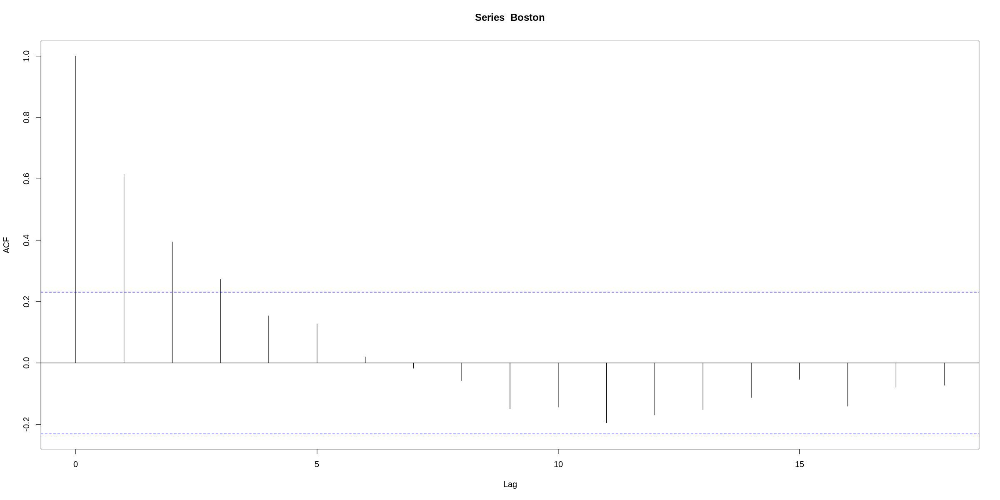

In [ ]:
Boston<-BOS$point_score_Team
acf(Boston)

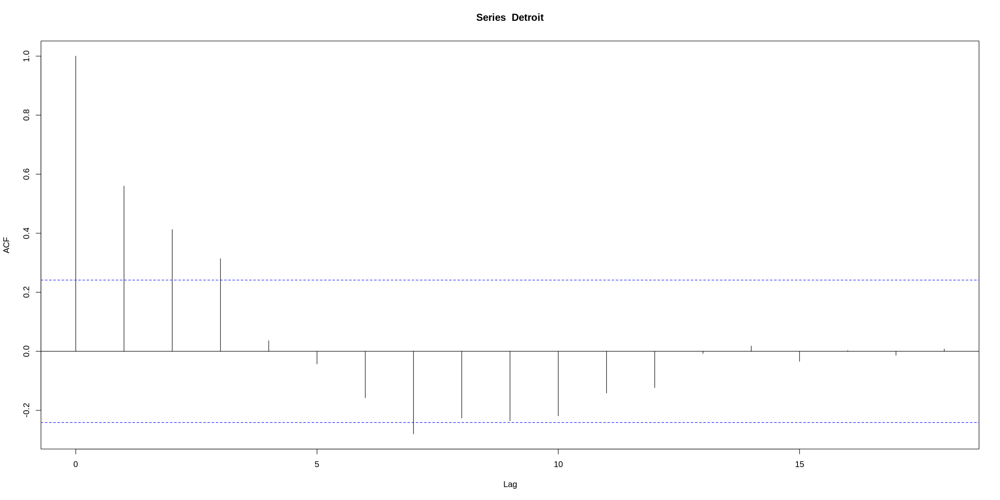

In [ ]:
Detroit<-DET$point_score_Team
acf(Detroit)

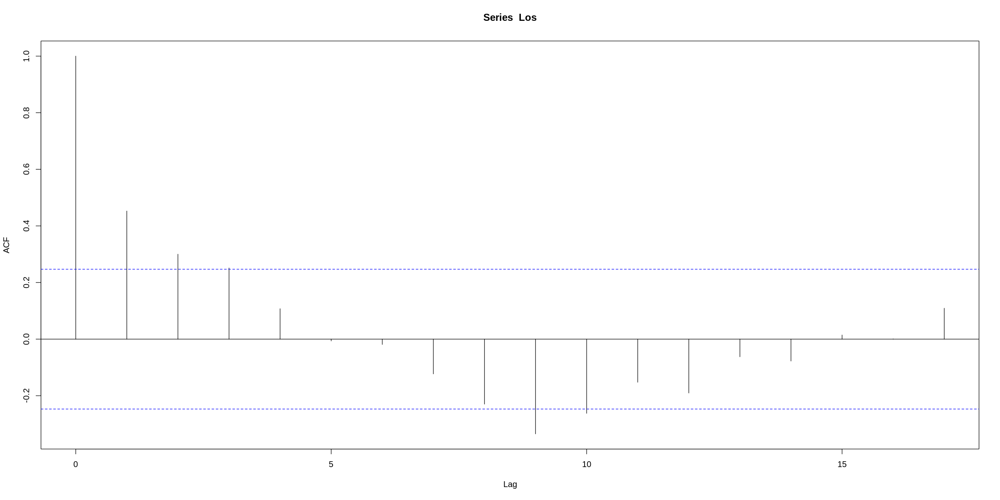

In [ ]:
Los<-LAL$point_score_Team
acf(Los)

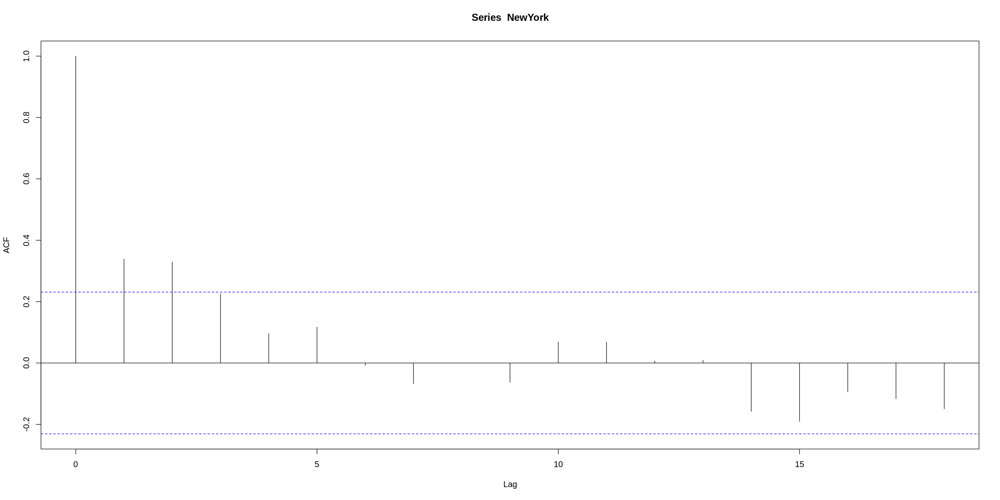

In [ ]:
NewYork<-NYK$point_score_Team
acf(NewYork)


Call:
lm(formula = Boston ~ N_BOS)

Residuals:
    Min      1Q  Median      3Q     Max 
-4686.2 -1006.4   211.2  1217.2  2459.5 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 9512.694    379.031  25.097   <2e-16 ***
N_BOS         -1.239      9.024  -0.137    0.891    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1591 on 70 degrees of freedom
Multiple R-squared:  0.0002692,	Adjusted R-squared:  -0.01401 
F-statistic: 0.01885 on 1 and 70 DF,  p-value: 0.8912


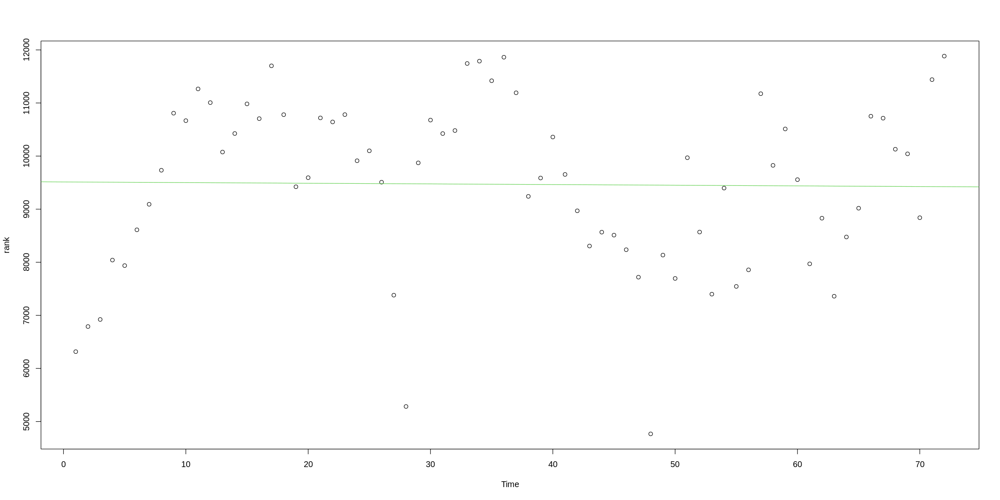

In [ ]:
##fit a linear regression model for boston

fit_b <- lm(Boston~ N_BOS)
summary(fit_b)

plot(N_BOS, Boston, xlab="Time", ylab="rank")

abline(fit_b, col=3)


	Durbin-Watson test

data:  fit_b
DW = 0.67895, p-value = 2.251e-11
alternative hypothesis: true autocorrelation is greater than 0


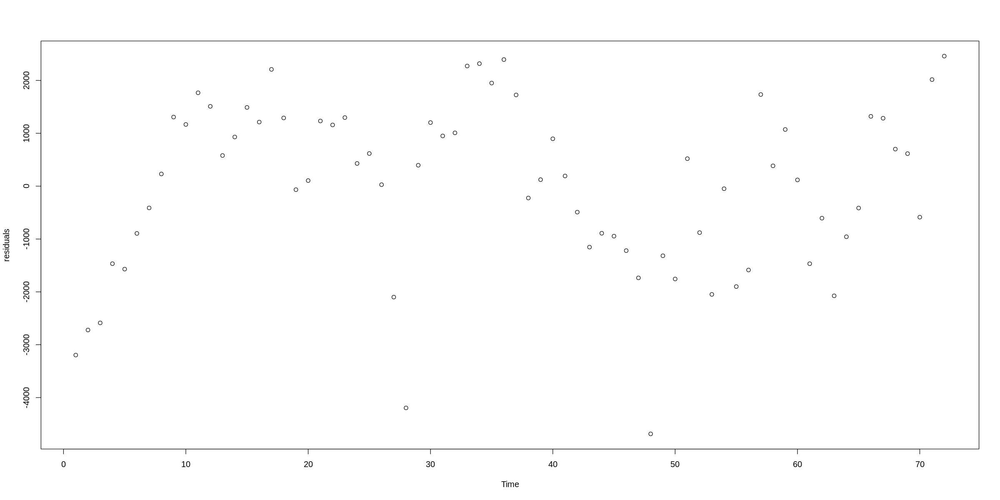

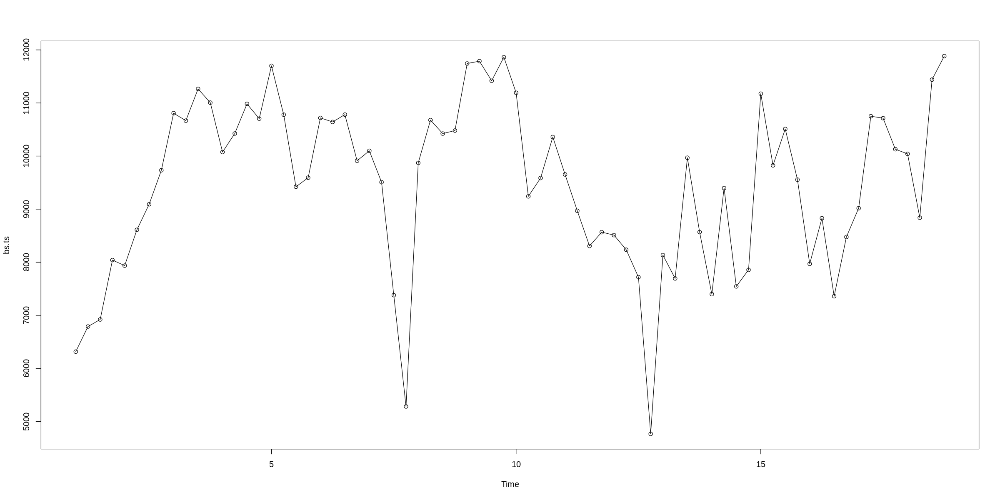

In [ ]:
library("lmtest")
dwtest(fit_b)
##check the residuals
resfit_b<- residuals(fit_b)
plot(resfit_b,xlab="Time", ylab="residuals" )
##let us do the same with a linear model for time series, so we transform the data into a ts object
bs.ts <- ts(Boston, frequency = 4)
ts.plot(bs.ts, type="o")


Call:
lm(formula = Detroit ~ N_DET)

Residuals:
    Min      1Q  Median      3Q     Max 
-3633.1  -661.8   -83.7   720.2  3346.7 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 8844.227    319.336  27.696   <2e-16 ***
N_DET         -8.740      8.286  -1.055    0.295    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1282 on 64 degrees of freedom
Multiple R-squared:  0.01709,	Adjusted R-squared:  0.001729 
F-statistic: 1.113 on 1 and 64 DF,  p-value: 0.2955


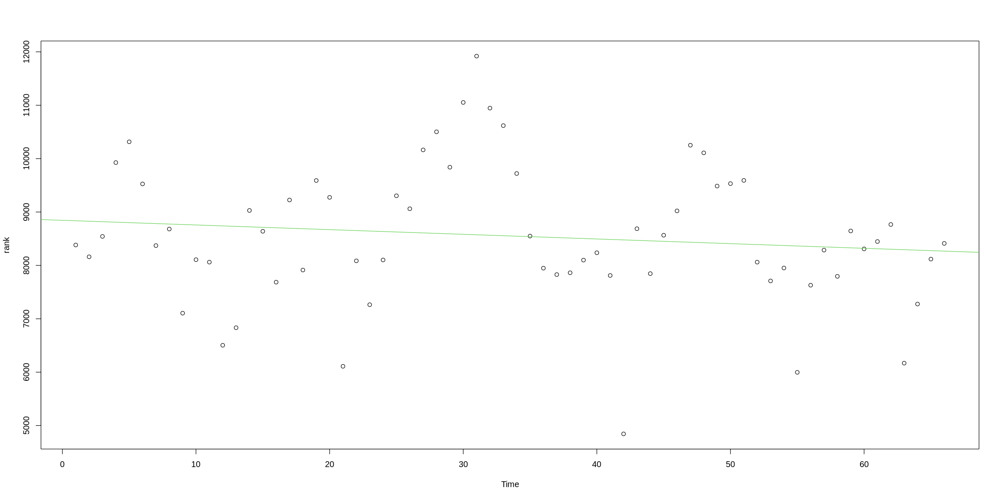

In [ ]:
##fit a linear regression model for boston

fit_d <- lm(Detroit~ N_DET)
summary(fit_d)

plot(N_DET, Detroit, xlab="Time", ylab="rank")

abline(fit_d, col=3)


	Durbin-Watson test

data:  fit_d
DW = 0.89504, p-value = 2.072e-07
alternative hypothesis: true autocorrelation is greater than 0


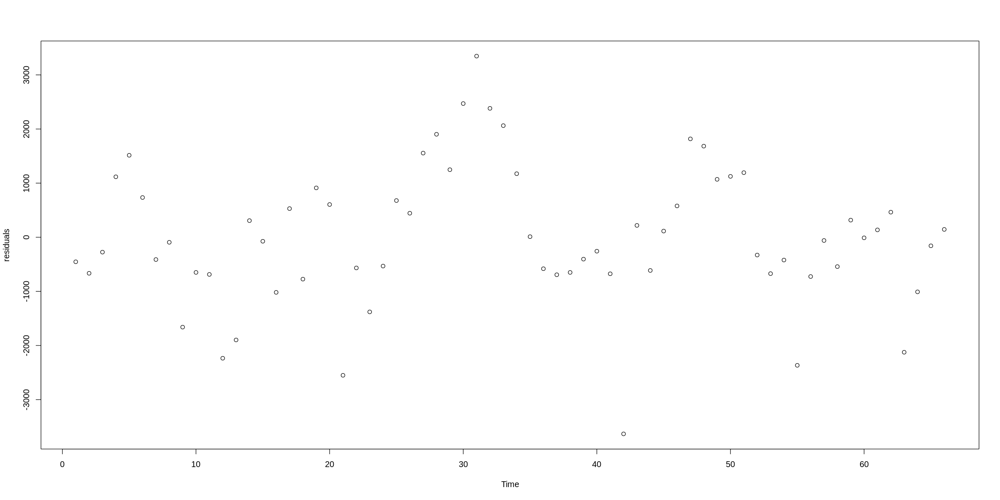

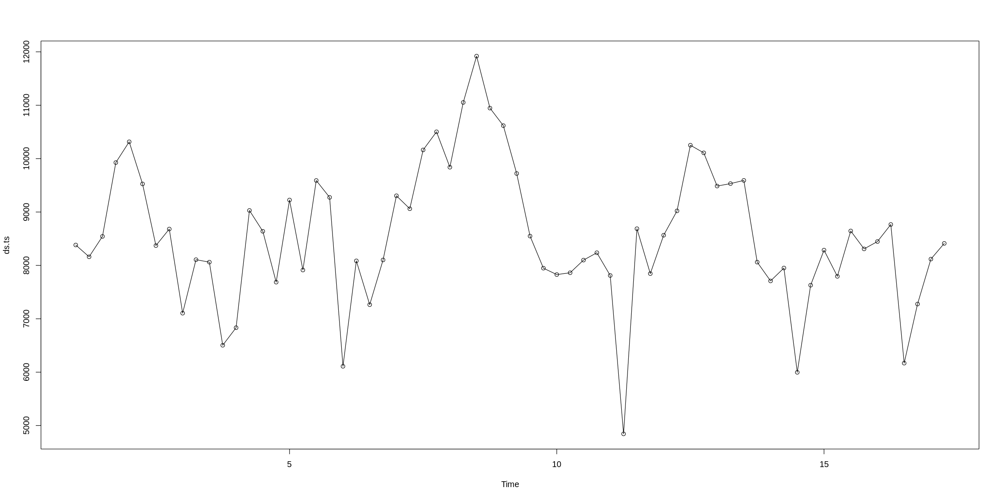

In [ ]:
dwtest(fit_d)
##check the residuals
resfit_d<- residuals(fit_d)
plot(resfit_d,xlab="Time", ylab="residuals" )
##let us do the same with a linear model for time series, so we transform the data into a ts object
ds.ts <- ts(Detroit, frequency = 4)
ts.plot(ds.ts, type="o")


Call:
lm(formula = Los ~ N_LAL)

Residuals:
    Min      1Q  Median      3Q     Max 
-4126.6  -950.9    21.2   890.7  3117.3 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 10407.761    355.666   29.26   <2e-16 ***
N_LAL         -19.620      9.663   -2.03   0.0467 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1395 on 61 degrees of freedom
Multiple R-squared:  0.0633,	Adjusted R-squared:  0.04794 
F-statistic: 4.122 on 1 and 61 DF,  p-value: 0.04669


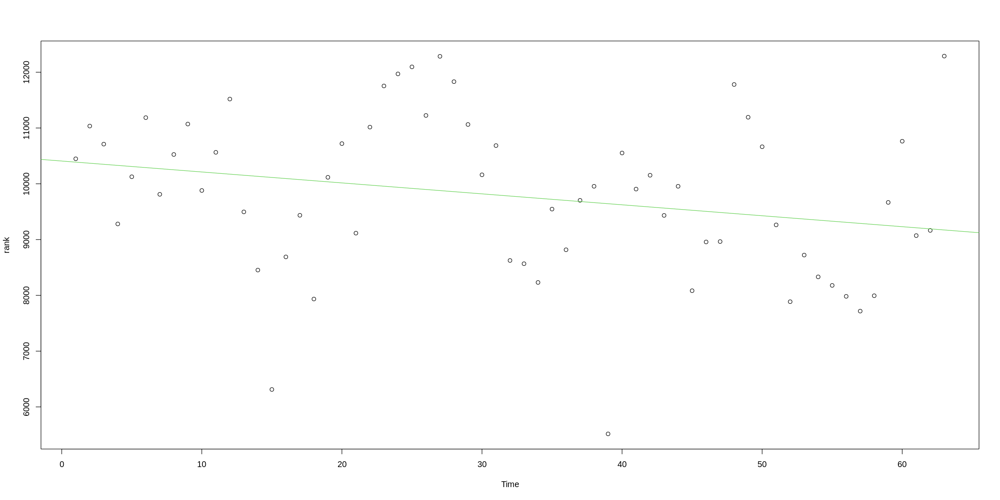

In [ ]:
##fit a linear regression model for boston

fit_l <- lm(Los~ N_LAL)
summary(fit_l)

plot(N_LAL, Los, xlab="Time", ylab="rank")

abline(fit_l, col=3)


	Durbin-Watson test

data:  fit_l
DW = 1.1127, p-value = 5.412e-05
alternative hypothesis: true autocorrelation is greater than 0


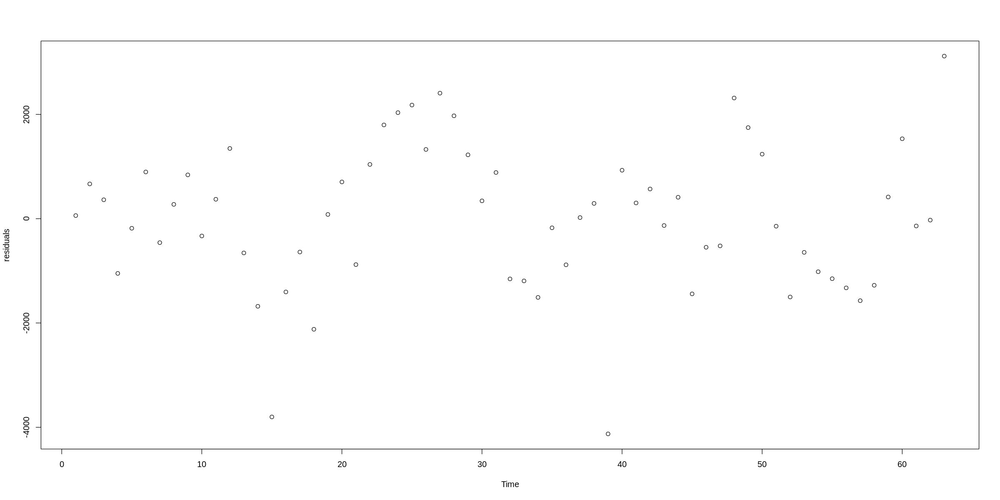

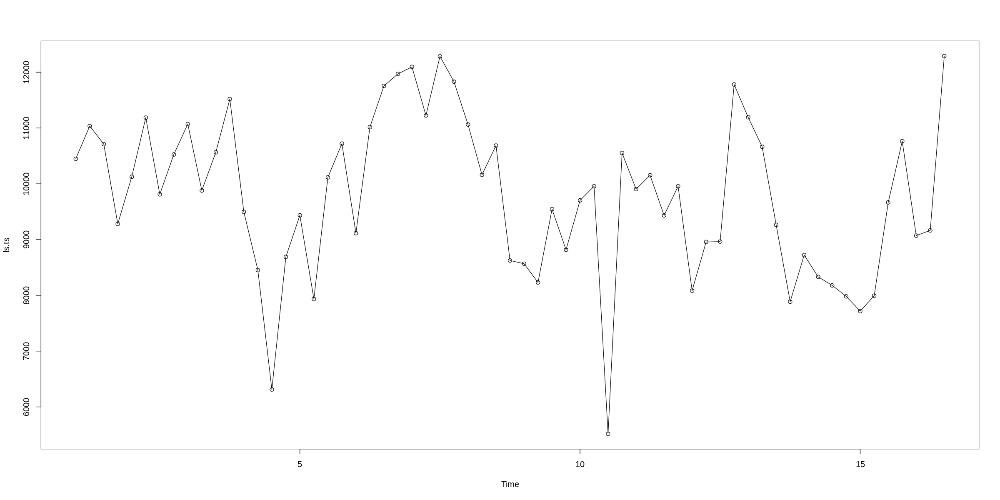

In [ ]:
dwtest(fit_l)
##check the residuals
resfit_l<- residuals(fit_l)
plot(resfit_l,xlab="Time", ylab="residuals" )
##let us do the same with a linear model for time series, so we transform the data into a ts object
ls.ts <- ts(Los, frequency = 4)
ts.plot(ls.ts, type="o")


Call:
lm(formula = NewYork ~ N_NYK)

Residuals:
     Min       1Q   Median       3Q      Max 
-2562.56  -692.88    56.74   714.75  3080.07 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 8384.578    287.702  29.143   <2e-16 ***
N_NYK          3.229      6.850   0.471    0.639    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1208 on 70 degrees of freedom
Multiple R-squared:  0.003164,	Adjusted R-squared:  -0.01108 
F-statistic: 0.2222 on 1 and 70 DF,  p-value: 0.6388


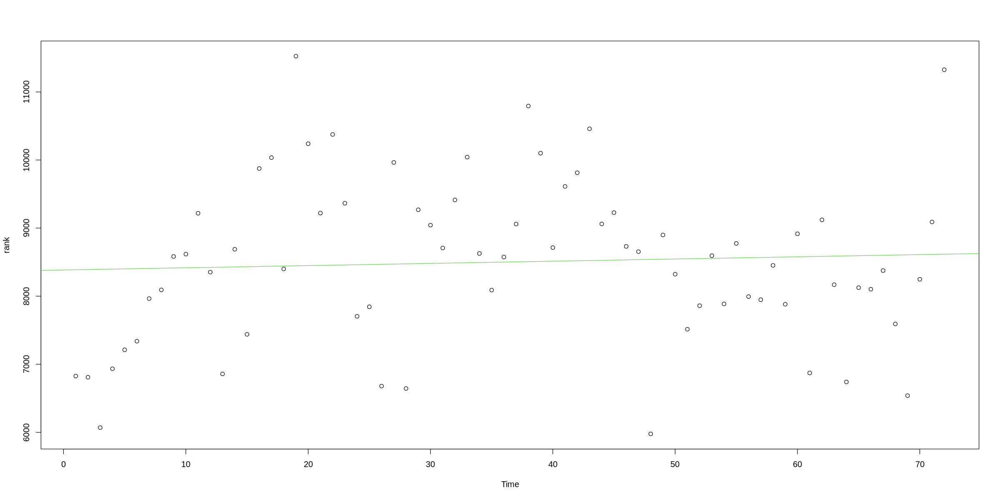

In [ ]:
##fit a linear regression model for boston

fit_n <- lm(NewYork~ N_NYK)
summary(fit_n)

plot(N_NYK, NewYork, xlab="Time", ylab="rank")

abline(fit_n, col=3)


	Durbin-Watson test

data:  fit_n
DW = 1.2212, p-value = 0.000171
alternative hypothesis: true autocorrelation is greater than 0


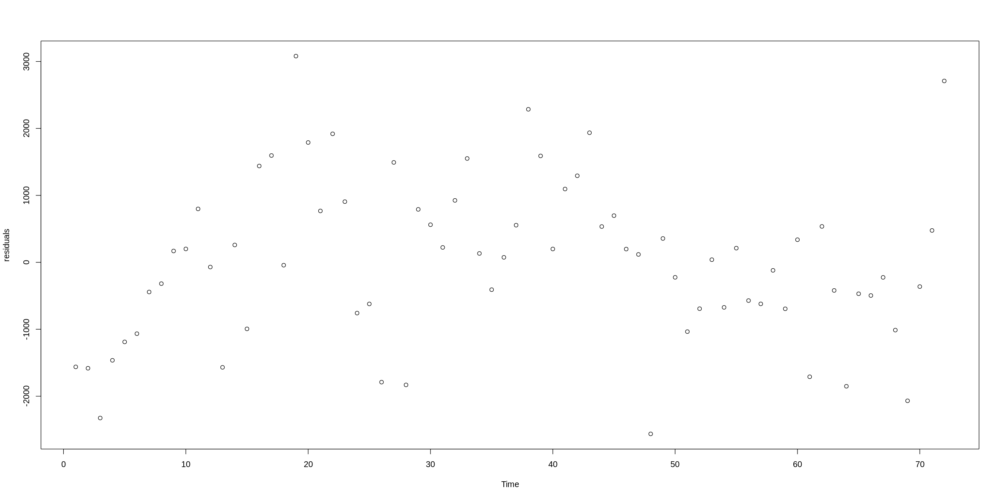

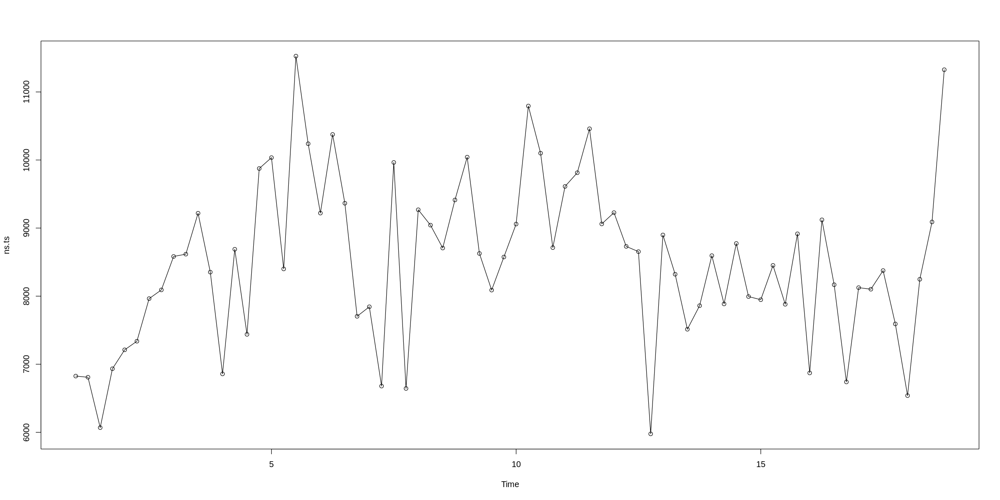

In [ ]:
dwtest(fit_n)
##check the residuals
resfit_n<- residuals(fit_n)
plot(resfit_n,xlab="Time", ylab="residuals" )
##let us do the same with a linear model for time series, so we transform the data into a ts object
ns.ts <- ts(NewYork, frequency = 4)
ts.plot(ns.ts, type="o")

In [ ]:
fitts1<- tslm(bs.ts~trend)
summary(fitts1)

dwtest(fitts1)


Call:
tslm(formula = bs.ts ~ trend)

Residuals:
    Min      1Q  Median      3Q     Max 
-4686.2 -1006.4   211.2  1217.2  2459.5 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 9512.694    379.031  25.097   <2e-16 ***
trend         -1.239      9.024  -0.137    0.891    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1591 on 70 degrees of freedom
Multiple R-squared:  0.0002692,	Adjusted R-squared:  -0.01401 
F-statistic: 0.01885 on 1 and 70 DF,  p-value: 0.8912



	Durbin-Watson test

data:  fitts1
DW = 0.67895, p-value = 2.251e-11
alternative hypothesis: true autocorrelation is greater than 0


In [ ]:
fitts<- tslm(bs.ts~trend+season)

In [ ]:
###obviously it gives the same results of the first model
summary(fitts)

dwtest(fitts)


Call:
tslm(formula = bs.ts ~ trend + season)

Residuals:
    Min      1Q  Median      3Q     Max 
-4489.0 -1086.3   309.5  1207.8  2650.0 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 9609.5042   500.0647  19.217   <2e-16 ***
trend         -0.9588     9.2106  -0.104    0.917    
season2      -37.6523   540.7116  -0.070    0.945    
season3      -82.9712   540.9469  -0.153    0.879    
season4     -307.5123   541.3388  -0.568    0.572    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1622 on 67 degrees of freedom
Multiple R-squared:  0.006046,	Adjusted R-squared:  -0.05329 
F-statistic: 0.1019 on 4 and 67 DF,  p-value: 0.9815



	Durbin-Watson test

data:  fitts
DW = 0.64752, p-value = 3.336e-11
alternative hypothesis: true autocorrelation is greater than 0



	Durbin-Watson test

data:  fitts
DW = 0.64752, p-value = 3.336e-11
alternative hypothesis: true autocorrelation is greater than 0


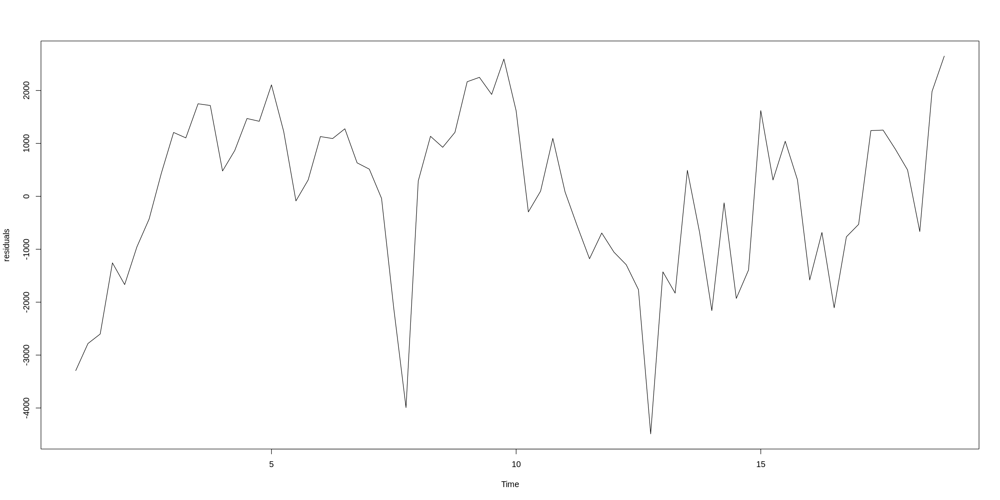

In [ ]:
#check the residuals
res3 <- residuals(fitts)

plot(res3, ylab="residuals")
dwtest(fitts)


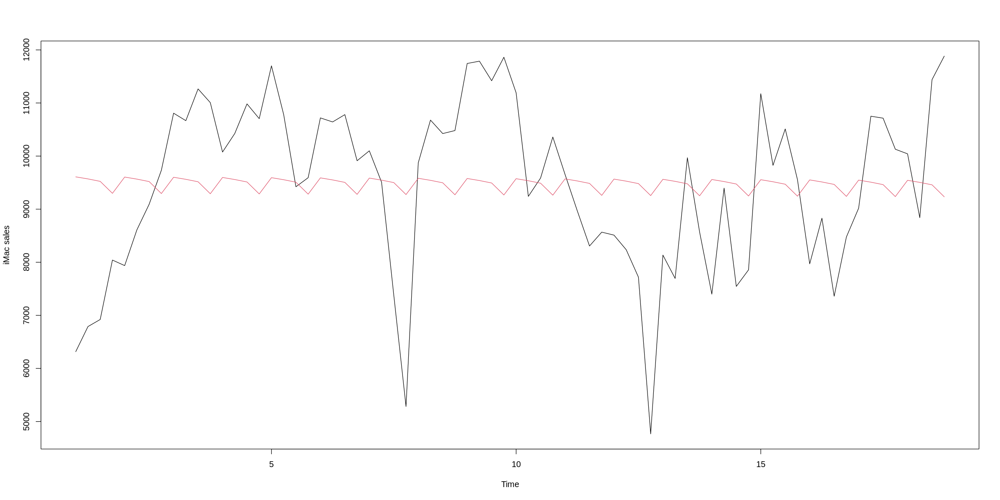

In [ ]:
###plot of the model
plot(bs.ts, ylab="iMac sales", xlab="Time")
lines(fitted(fitts), col=2)

In [ ]:
fitts1_d<- tslm(ds.ts~trend)
summary(fitts1_d)

dwtest(fitts1_d)


Call:
tslm(formula = ds.ts ~ trend)

Residuals:
    Min      1Q  Median      3Q     Max 
-3633.1  -661.8   -83.7   720.2  3346.7 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 8844.227    319.336  27.696   <2e-16 ***
trend         -8.740      8.286  -1.055    0.295    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1282 on 64 degrees of freedom
Multiple R-squared:  0.01709,	Adjusted R-squared:  0.001729 
F-statistic: 1.113 on 1 and 64 DF,  p-value: 0.2955



	Durbin-Watson test

data:  fitts1_d
DW = 0.89504, p-value = 2.072e-07
alternative hypothesis: true autocorrelation is greater than 0


In [ ]:
fitts_d<- tslm(ds.ts~trend+season)

In [ ]:
###obviously it gives the same results of the first model
summary(fitts_d)

dwtest(fitts_d)


Call:
tslm(formula = ds.ts ~ trend + season)

Residuals:
    Min      1Q  Median      3Q     Max 
-3606.0  -618.5  -101.5   763.9  3243.8 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 8757.655    423.640  20.672   <2e-16 ***
trend         -8.733      8.478  -1.030    0.307    
season2       59.145    449.967   0.131    0.896    
season3      189.279    456.863   0.414    0.680    
season4      103.950    456.941   0.227    0.821    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1312 on 61 degrees of freedom
Multiple R-squared:  0.02002,	Adjusted R-squared:  -0.04424 
F-statistic: 0.3115 on 4 and 61 DF,  p-value: 0.8692



	Durbin-Watson test

data:  fitts_d
DW = 0.89211, p-value = 7.027e-07
alternative hypothesis: true autocorrelation is greater than 0



	Durbin-Watson test

data:  fitts_d
DW = 0.89211, p-value = 7.027e-07
alternative hypothesis: true autocorrelation is greater than 0


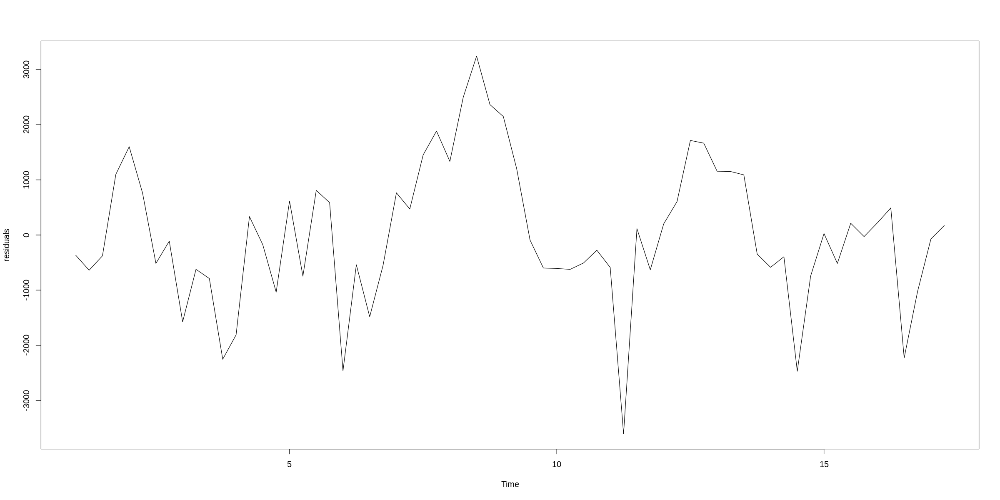

In [ ]:
#check the residuals
res3 <- residuals(fitts_d)

plot(res3, ylab="residuals")
dwtest(fitts_d)

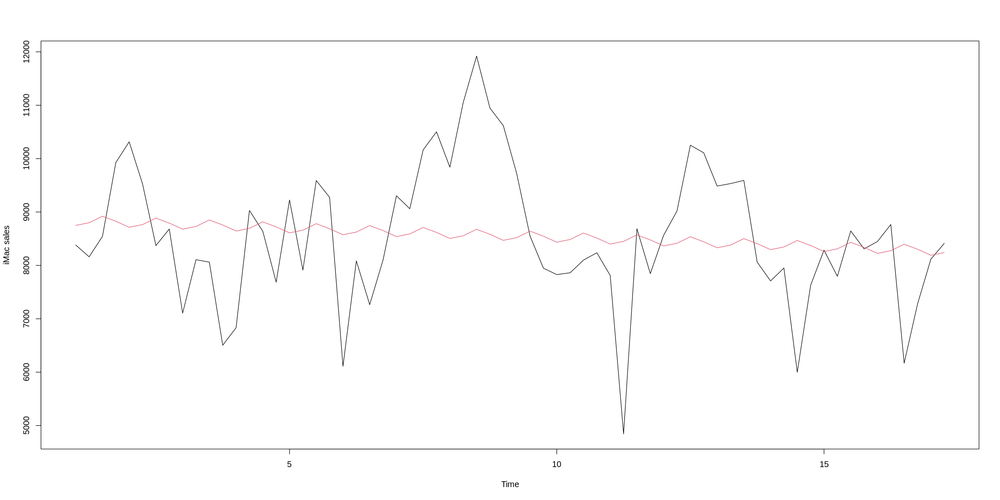

In [ ]:
###plot of the model
plot(ds.ts, ylab="iMac sales", xlab="Time")
lines(fitted(fitts_d), col=2)

In [ ]:
fitts1_l<- tslm(ls.ts~trend)
summary(fitts1_l)

dwtest(fitts1_l)


Call:
tslm(formula = ls.ts ~ trend)

Residuals:
    Min      1Q  Median      3Q     Max 
-4126.6  -950.9    21.2   890.7  3117.3 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 10407.761    355.666   29.26   <2e-16 ***
trend         -19.620      9.663   -2.03   0.0467 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1395 on 61 degrees of freedom
Multiple R-squared:  0.0633,	Adjusted R-squared:  0.04794 
F-statistic: 4.122 on 1 and 61 DF,  p-value: 0.04669



	Durbin-Watson test

data:  fitts1_l
DW = 1.1127, p-value = 5.412e-05
alternative hypothesis: true autocorrelation is greater than 0


In [ ]:
fitts_l<- tslm(ls.ts~trend+season)

In [ ]:
###obviously it gives the same results of the first model
summary(fitts_l)

dwtest(fitts_l)


Call:
tslm(formula = ls.ts ~ trend + season)

Residuals:
    Min      1Q  Median      3Q     Max 
-4059.6  -983.7    82.5   926.9  3184.1 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 10346.258    468.413  22.088   <2e-16 ***
trend         -19.615      9.851  -1.991   0.0512 .  
season2       -72.447    502.399  -0.144   0.8858    
season3        -5.645    502.688  -0.011   0.9911    
season4       341.028    510.700   0.668   0.5069    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1421 on 58 degrees of freedom
Multiple R-squared:  0.07586,	Adjusted R-squared:  0.01213 
F-statistic:  1.19 on 4 and 58 DF,  p-value: 0.3247



	Durbin-Watson test

data:  fitts_l
DW = 1.0766, p-value = 7.119e-05
alternative hypothesis: true autocorrelation is greater than 0



	Durbin-Watson test

data:  fitts_l
DW = 1.0766, p-value = 7.119e-05
alternative hypothesis: true autocorrelation is greater than 0


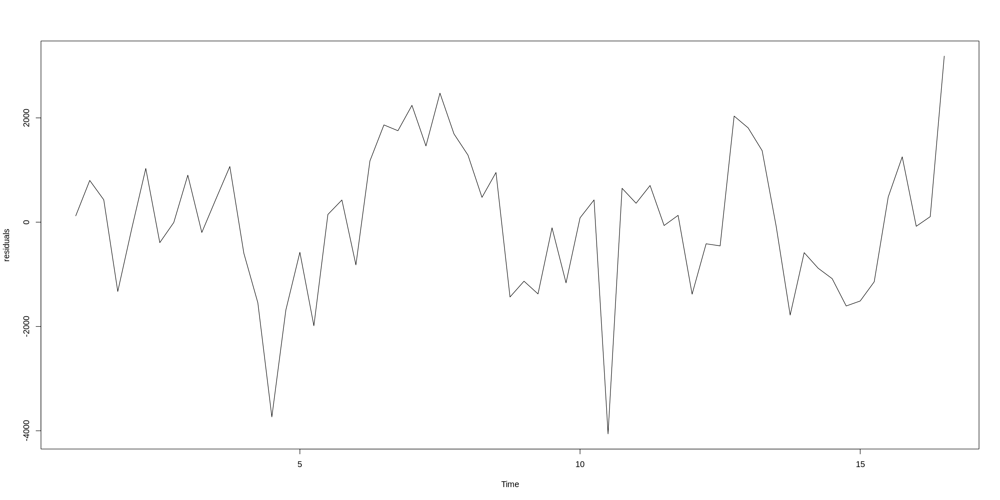

In [ ]:
#check the residuals
res3 <- residuals(fitts_l)

plot(res3, ylab="residuals")
dwtest(fitts_l)

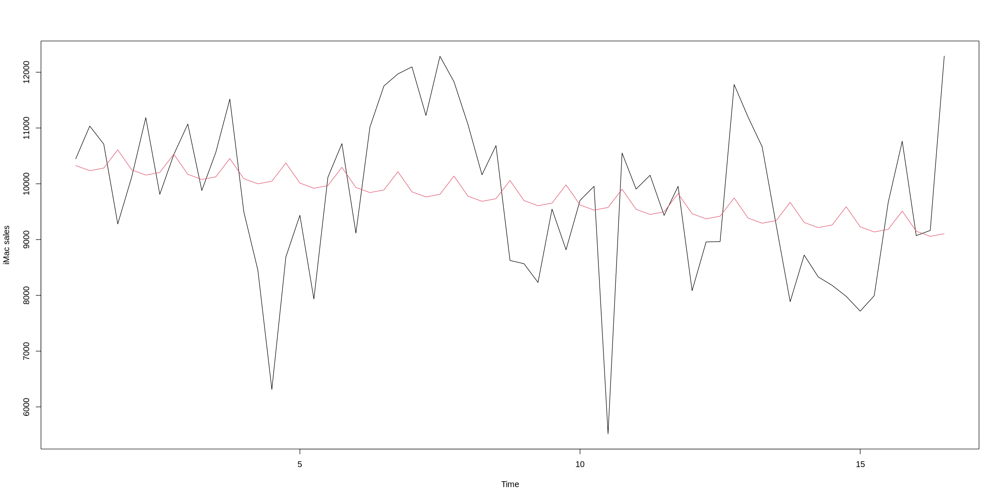

In [ ]:
###plot of the model
plot(ls.ts, ylab="iMac sales", xlab="Time")
lines(fitted(fitts_l), col=2)

In [ ]:
fitts1_n<- tslm(ns.ts~trend)
summary(fitts1_n)

dwtest(fitts1_n)


Call:
tslm(formula = ns.ts ~ trend)

Residuals:
     Min       1Q   Median       3Q      Max 
-2562.56  -692.88    56.74   714.75  3080.07 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 8384.578    287.702  29.143   <2e-16 ***
trend          3.229      6.850   0.471    0.639    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1208 on 70 degrees of freedom
Multiple R-squared:  0.003164,	Adjusted R-squared:  -0.01108 
F-statistic: 0.2222 on 1 and 70 DF,  p-value: 0.6388



	Durbin-Watson test

data:  fitts1_n
DW = 1.2212, p-value = 0.000171
alternative hypothesis: true autocorrelation is greater than 0


In [ ]:
fitts_n<- tslm(ns.ts~trend+season)

In [ ]:
###obviously it gives the same results of the first model
summary(fitts_n)

dwtest(fitts_n)


Call:
tslm(formula = ns.ts ~ trend + season)

Residuals:
     Min       1Q   Median       3Q      Max 
-2563.53  -693.57   -20.88   684.52  2882.69 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 8263.083    377.140  21.910   <2e-16 ***
trend          3.221      6.946   0.464    0.644    
season2      179.001    407.795   0.439    0.662    
season3      359.779    407.973   0.882    0.381    
season4      -51.720    408.269  -0.127    0.900    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1223 on 67 degrees of freedom
Multiple R-squared:  0.02158,	Adjusted R-squared:  -0.03683 
F-statistic: 0.3695 on 4 and 67 DF,  p-value: 0.8295



	Durbin-Watson test

data:  fitts_n
DW = 1.1973, p-value = 0.0002448
alternative hypothesis: true autocorrelation is greater than 0



	Durbin-Watson test

data:  fitts_n
DW = 1.1973, p-value = 0.0002448
alternative hypothesis: true autocorrelation is greater than 0


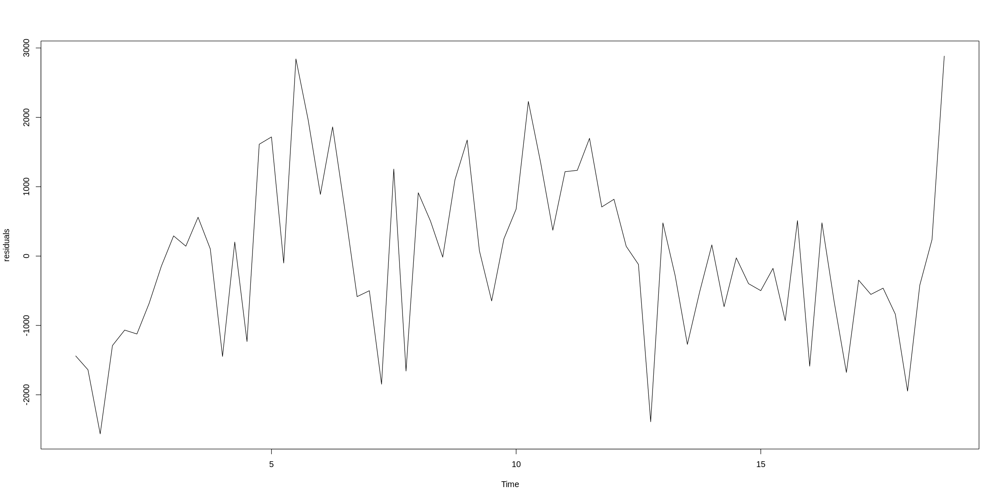

In [ ]:
#check the residuals
res3 <- residuals(fitts_n)

plot(res3, ylab="residuals")
dwtest(fitts_n)

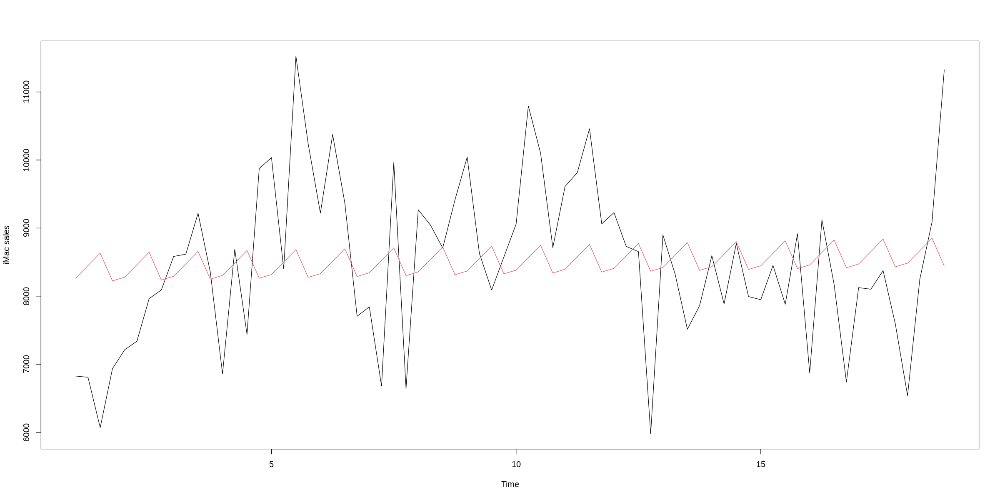

In [ ]:
###plot of the model
plot(ns.ts, ylab="iMac sales", xlab="Time")
lines(fitted(fitts_n), col=2)

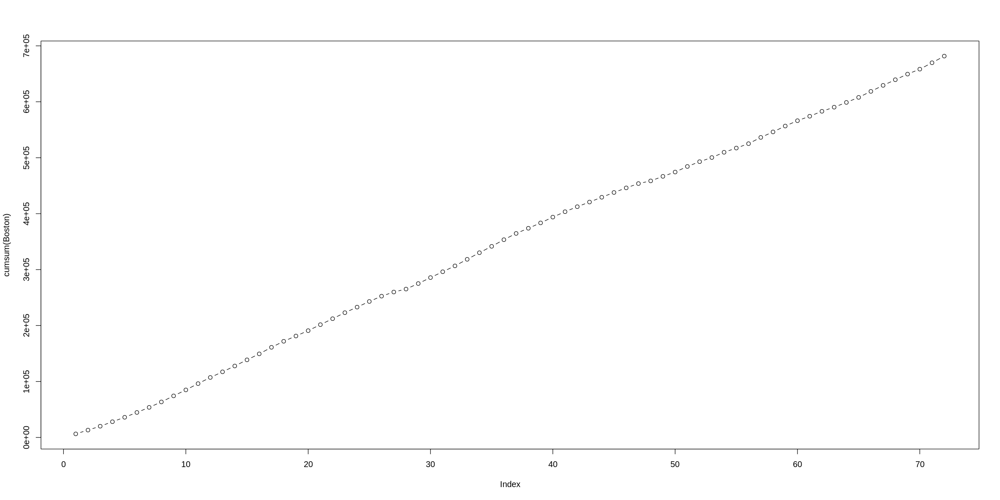

In [ ]:
plot(cumsum(Boston), type="b")

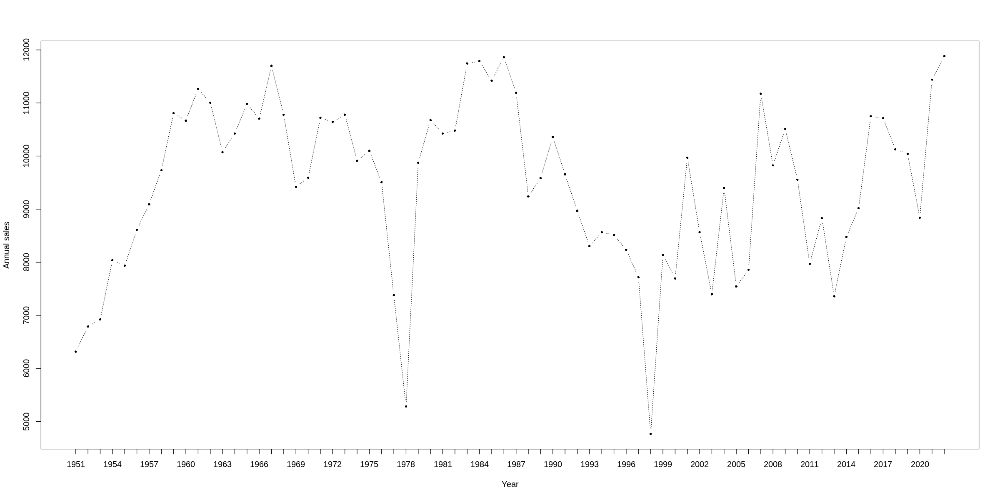

In [ ]:
###a better plot of the yearly time series
plot(Boston, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Bos)

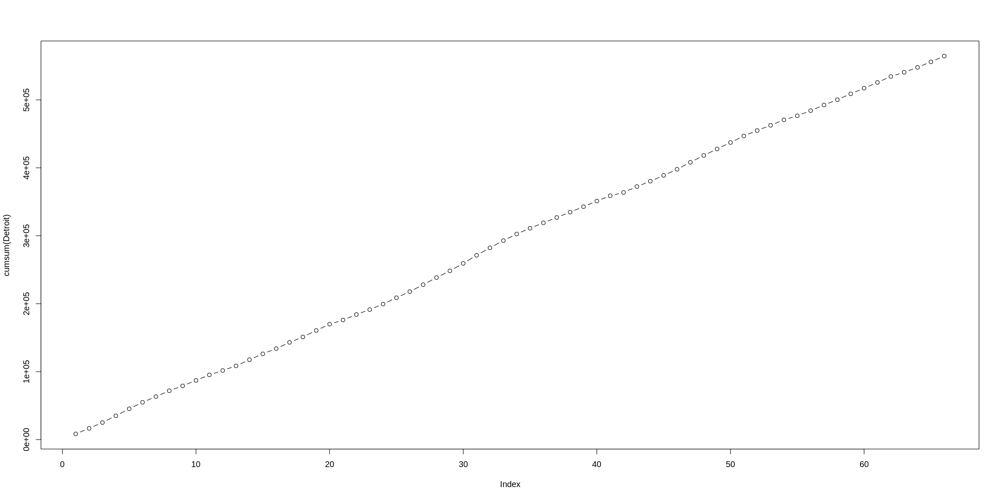

In [ ]:
plot(cumsum(Detroit), type="b")

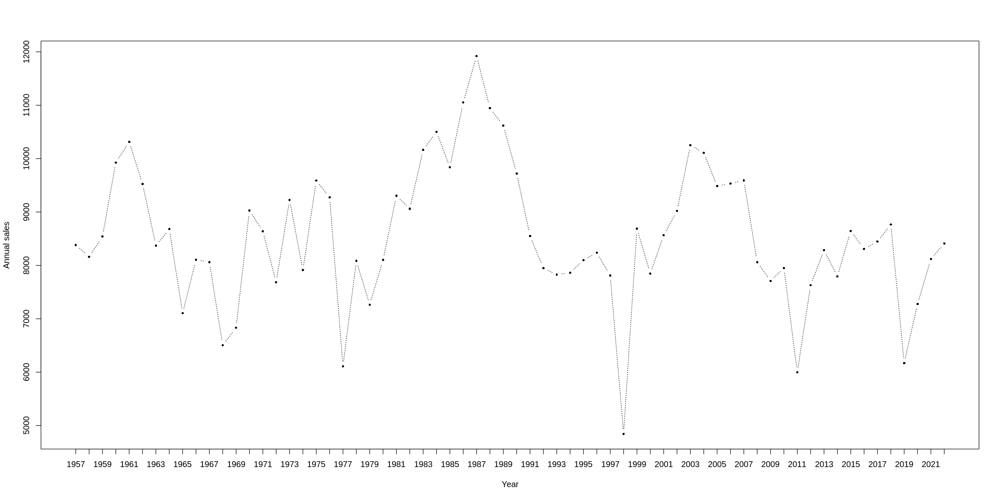

In [ ]:
###a better plot of the yearly time series
plot(Detroit, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:66), labels=tt_Det)

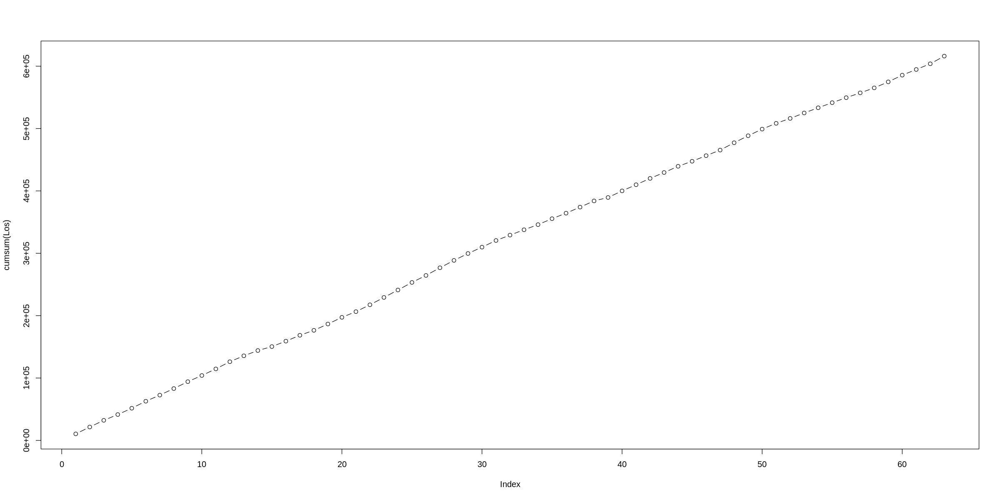

In [ ]:
plot(cumsum(Los), type="b")

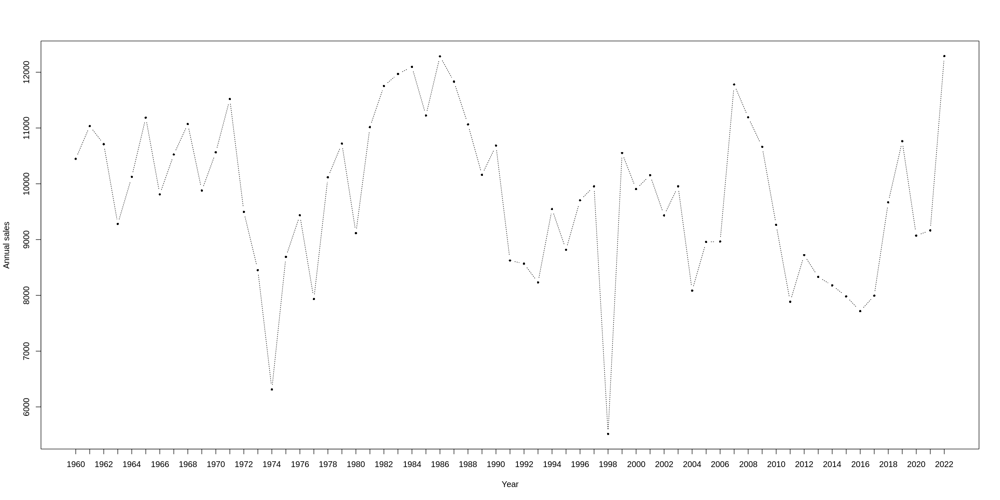

In [ ]:
###a better plot of the yearly time series
plot(Los, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:63), labels=tt_Lal)

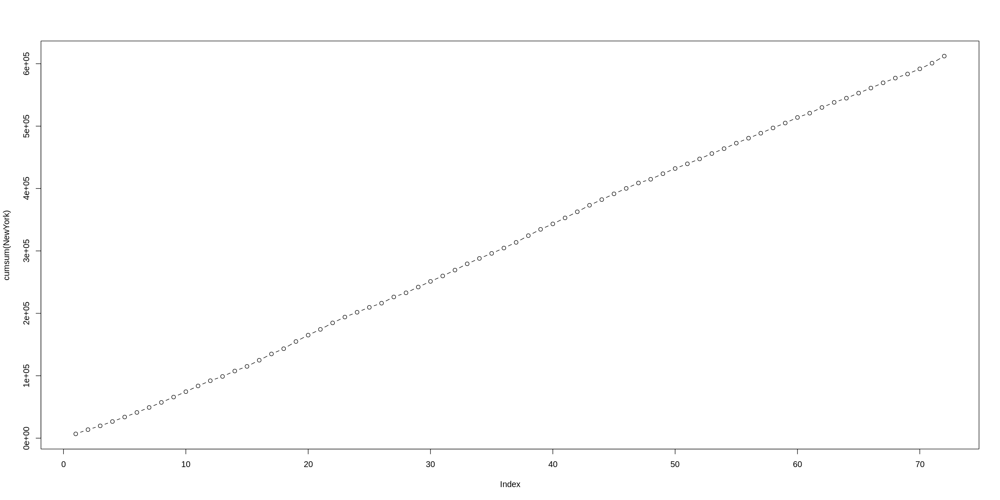

In [ ]:
plot(cumsum(NewYork), type="b")

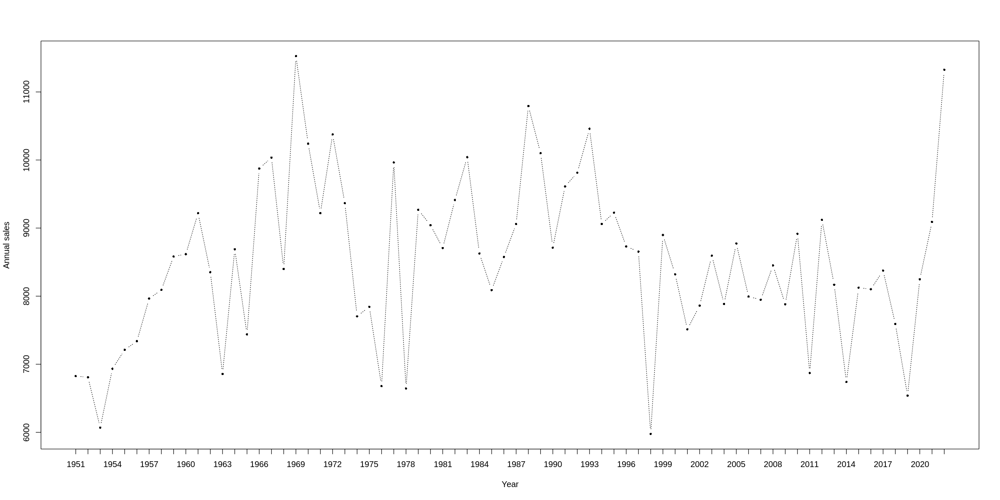

In [ ]:
###a better plot of the yearly time series
plot(NewYork, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Nyk)

BM for boston


Call: ( Standard Bass Model )

  BM(series = Boston, display = T)

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-10815.4  -4957.8  -1898.6   -885.1   3985.9  13451.4 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 1.150838e+06 7.736456e+04 9.992065e+05 1.302470e+06 3.24e-23 ***
p 7.847513e-03 4.120612e-04 7.039888e-03 8.655138e-03 3.50e-29 ***
q 1.419225e-02 1.890836e-03 1.048628e-02 1.789822e-02 1.60e-10 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  5950.642  on  69  degrees of freedom
 Multiple R-squared:   0.999778  Residual sum of squares:  2443299297


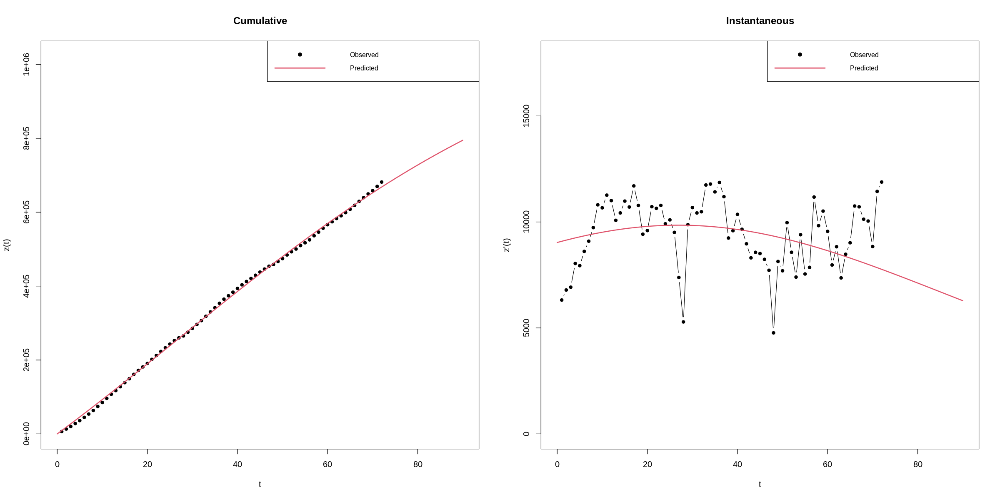

In [ ]:
###we estimate a simple Bass Model
bm_cass<-BM(Boston,display = T)
summary(bm_cass)

In [ ]:
###prediction (out-of-sample)
pred_bmcas<- predict(bm_cass, newx=c(1:80))
pred.instcas_bos<- make.instantaneous(pred_bmcas)

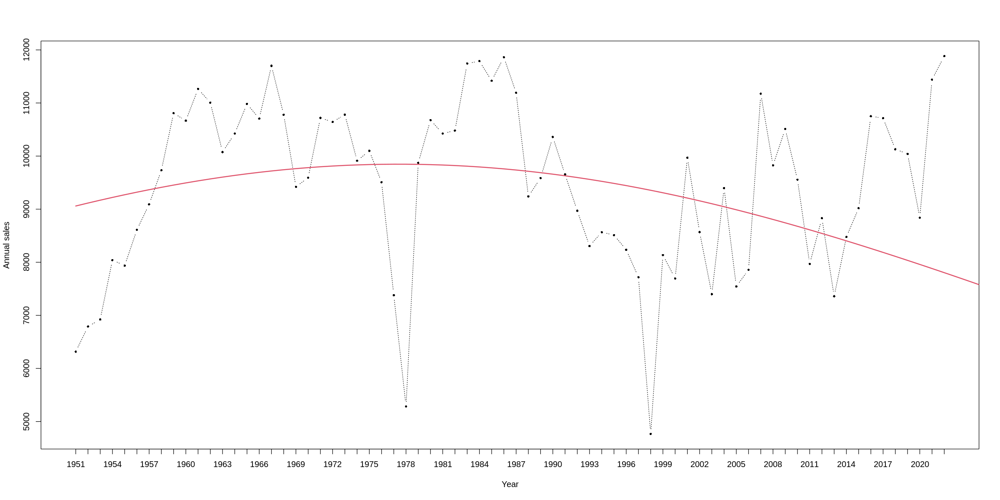

In [ ]:
###plot of fitted model
plot(Boston, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Bos)
lines(pred.instcas_bos, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = Boston[1:36], display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-6765.5 -3701.4   473.9  -454.8  1998.5  7875.1 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 5.312026e+05 3.402226e+04 4.645201e+05 5.978850e+05 8.43e-17 ***
p 1.401863e-02 5.739845e-04 1.289364e-02 1.514361e-02 1.05e-22 ***
q 4.756194e-02 5.151335e-03 3.746551e-02 5.765838e-02 1.15e-10 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  3660.089  on  33  degrees of freedom
 Multiple R-squared:   0.999676  Residual sum of squares:  442076349


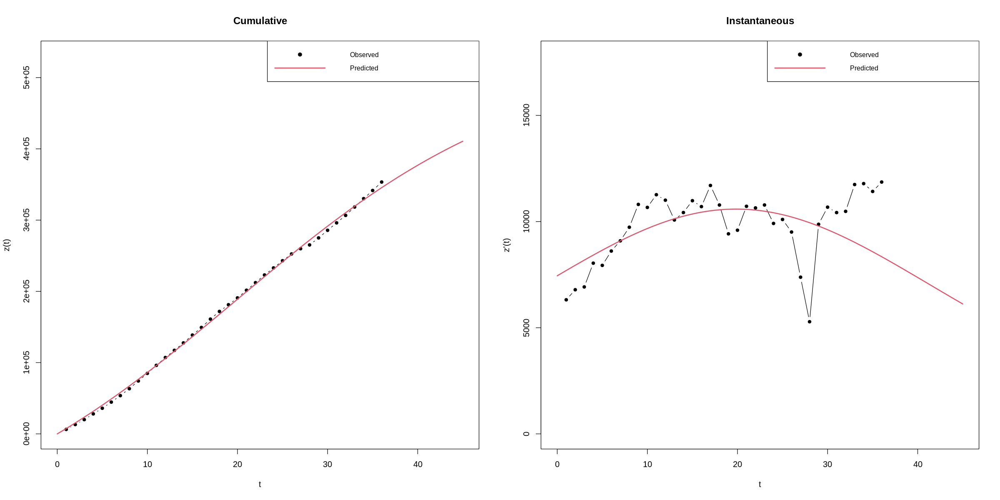

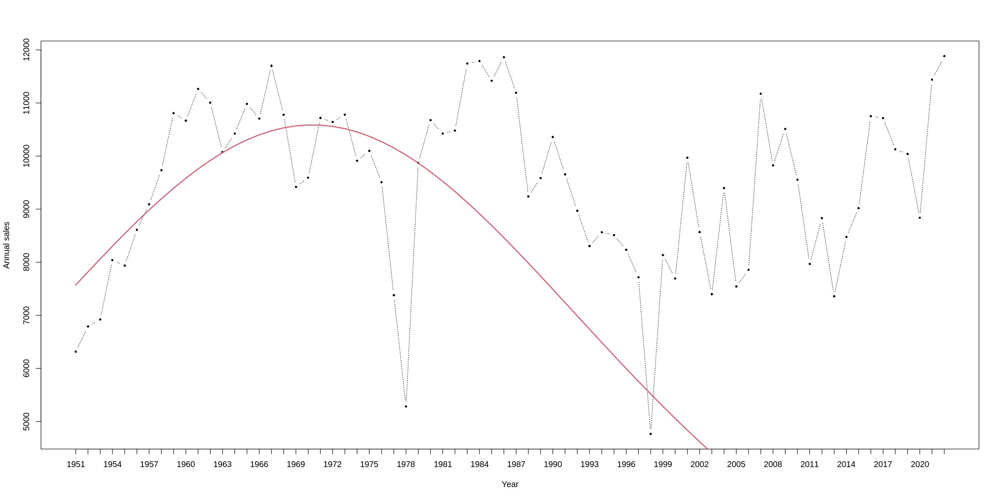

In [ ]:
###we estimate the model with 50% of the data

bm_cass50<-BM(Boston[1:36],display = T)
summary(bm_cass50)

pred_bmcas50<- predict(bm_cass50, newx=c(1:80))
pred.instcas50_bos<- make.instantaneous(pred_bmcas50)

plot(Boston, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Bos)
lines(pred.instcas50_bos, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = Boston[1:18], display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-836.61 -478.86   75.42    1.05  214.06  985.88 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 2.988895e+05 1.043920e+04 2.784290e+05 3.193500e+05 1.66e-14 ***
p 1.983879e-02 4.709641e-04 1.891572e-02 2.076187e-02 5.42e-17 ***
q 1.048163e-01 4.232025e-03 9.652164e-02 1.131109e-01 1.40e-13 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  561.6246  on  15  degrees of freedom
 Multiple R-squared:   0.999967  Residual sum of squares:  4731333


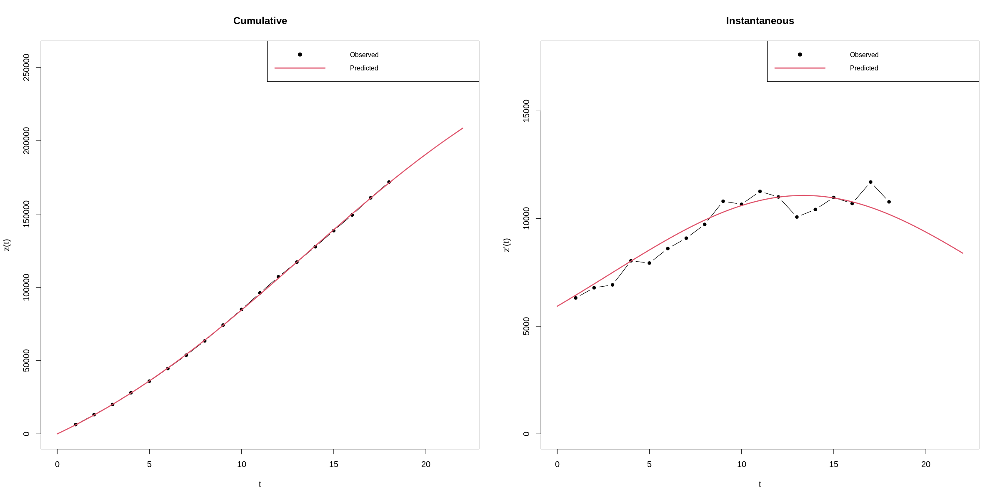

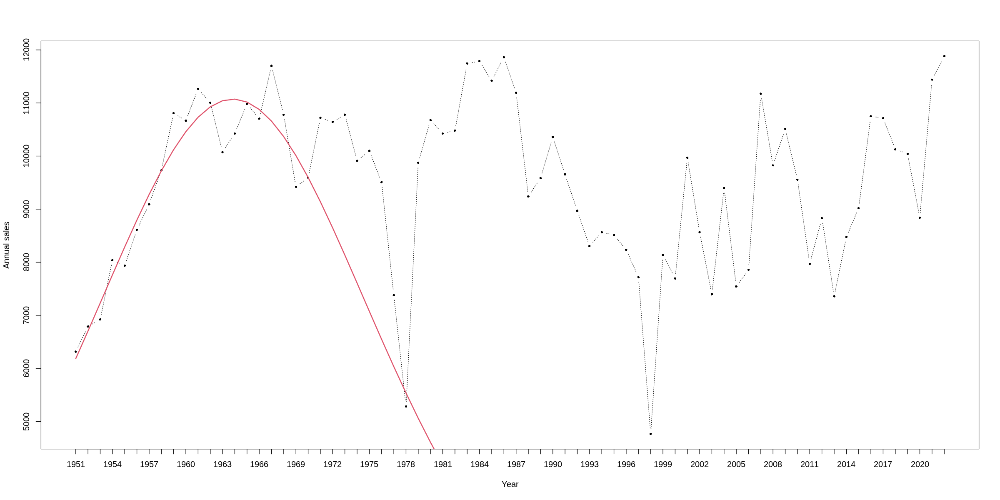

In [ ]:
###we estimate the model with 25% of the data
bm_cass75<-BM(Boston[1:18],display = T)
summary(bm_cass75)

pred_bmcas75<- predict(bm_cass75, newx=c(1:80))
pred.instcas75_bos<- make.instantaneous(pred_bmcas75)
plot(Boston, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Bos)
lines(pred.instcas75_bos, lwd=2, col=2)

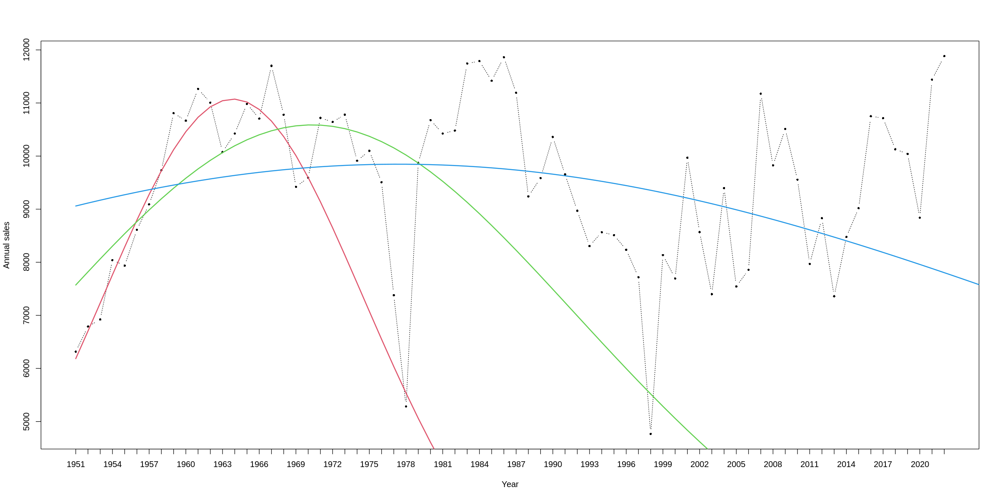

In [ ]:
###Comparison between models (instantaneous)
###instantaneous
plot(Boston, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Bos)
lines(pred.instcas75_bos, lwd=2, col=2)
lines(pred.instcas50_bos, lwd=2, col=3)
lines(pred.instcas_bos, lwd=2, col=4)

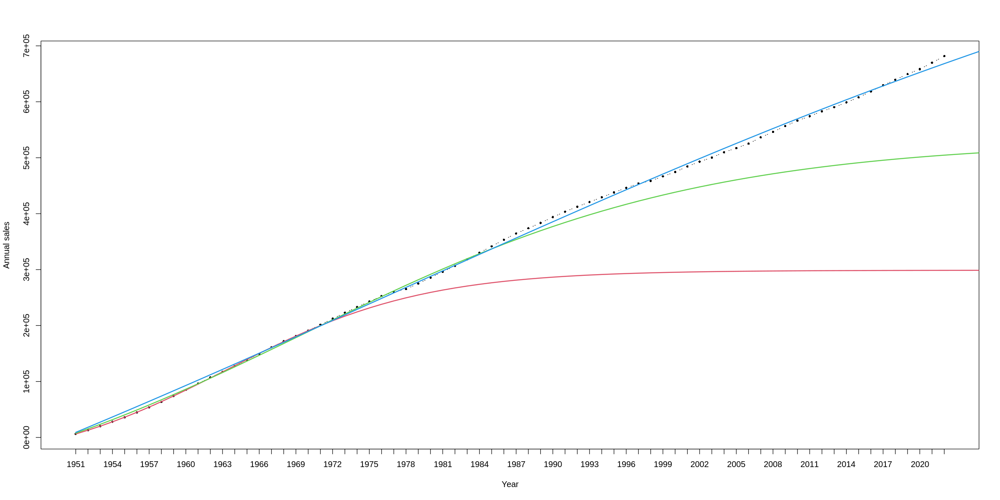

In [ ]:
###Comparison between models (cumulative)
plot(cumsum(Boston), type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Bos)
lines(pred_bmcas75, lwd=2, col=2)
lines(pred_bmcas50, lwd=2, col=3)
lines(pred_bmcas, lwd=2, col=4)

BM for detroit

Call: ( Standard Bass Model )

  BM(series = Detroit, display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-6670.8 -1390.7  -123.2   275.4  2410.1  6800.1 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 1.020768e+06 5.514904e+04 9.126782e+05 1.128858e+06 3.63e-27 ***
p 7.868340e-03 3.414213e-04 7.199166e-03 8.537513e-03 2.12e-32 ***
q 1.542069e-02 1.473373e-03 1.253294e-02 1.830845e-02 2.05e-15 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  3399.657  on  63  degrees of freedom
 Multiple R-squared:   0.999896  Residual sum of squares:  728133246


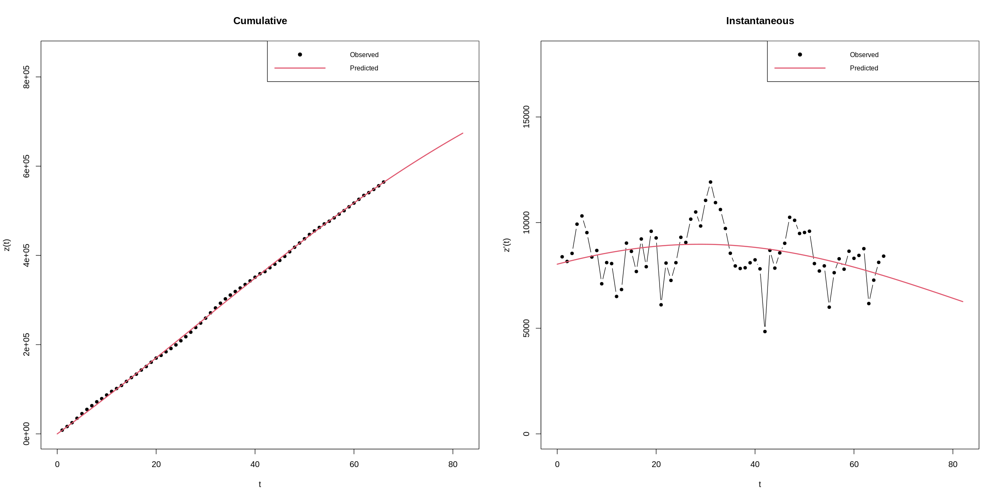

In [ ]:
###we estimate a simple Bass Model
bm_cass<-BM(Detroit,display = T)
summary(bm_cass)

In [ ]:
###prediction (out-of-sample)
pred_bmcas<- predict(bm_cass, newx=c(1:80))
pred.instcas_det<- make.instantaneous(pred_bmcas)

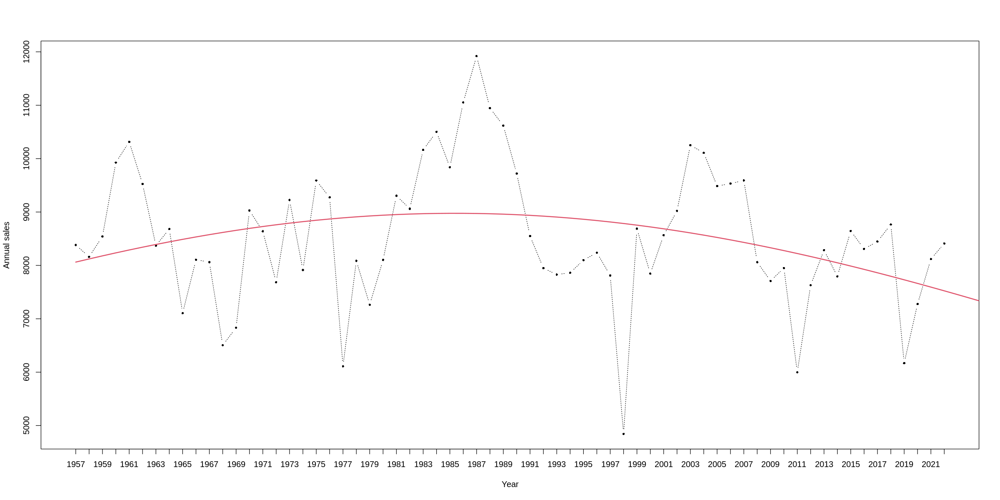

In [ ]:
###plot of fitted model
plot(Detroit, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:66), labels=tt_Det)
lines(pred.instcas_det, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = Detroit[1:33], display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-5320.6 -1137.0   119.6   579.5  3769.7  7160.1 

Coefficients:
       Estimate    Std.Error         Lower        Upper p-value  
m 5.157767e+06 9.809693e+07 -1.871087e+08 1.974242e+08   0.958  
p 1.587806e-03 3.014513e-02 -5.749555e-02 6.067117e-02   0.958  
q 5.105871e-03 3.674018e-02 -6.690356e-02 7.711530e-02   0.890  
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  3544.089  on  30  degrees of freedom
 Multiple R-squared:   0.999548  Residual sum of squares:  376817110


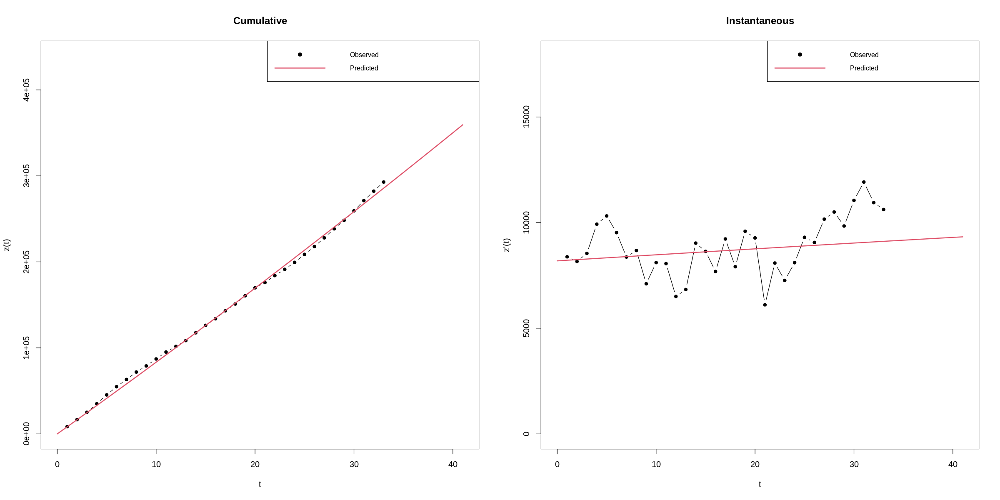

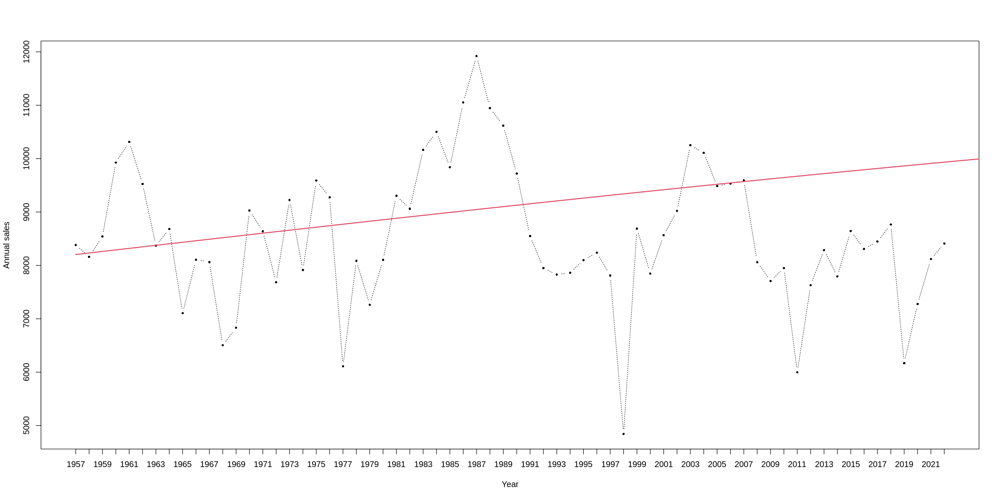

In [ ]:
###we estimate the model with 50% of the data

bm_cass50<-BM(Detroit[1:33],display = T)
summary(bm_cass50)

pred_bmcas50<- predict(bm_cass50, newx=c(1:80))
pred.instcas50_det<- make.instantaneous(pred_bmcas50)

plot(Detroit, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:66), labels=tt_Det)
lines(pred.instcas50_det, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = Detroit[1:16], display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-2117.2  -988.0   136.7  -129.5   764.3  1441.2 

Coefficients:
       Estimate    Std.Error         Lower        Upper p-value    
m 3.050607e+05 1.275424e+05  5.508219e+04 5.550393e+05  0.0326   *
p 2.977124e-02 1.141988e-02  7.388696e-03 5.215379e-02  0.0217   *
q 2.614950e-02 2.676184e-02 -2.630273e-02 7.860174e-02  0.3460    
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  1291.209  on  13  degrees of freedom
 Multiple R-squared:   0.999761  Residual sum of squares:  21673872


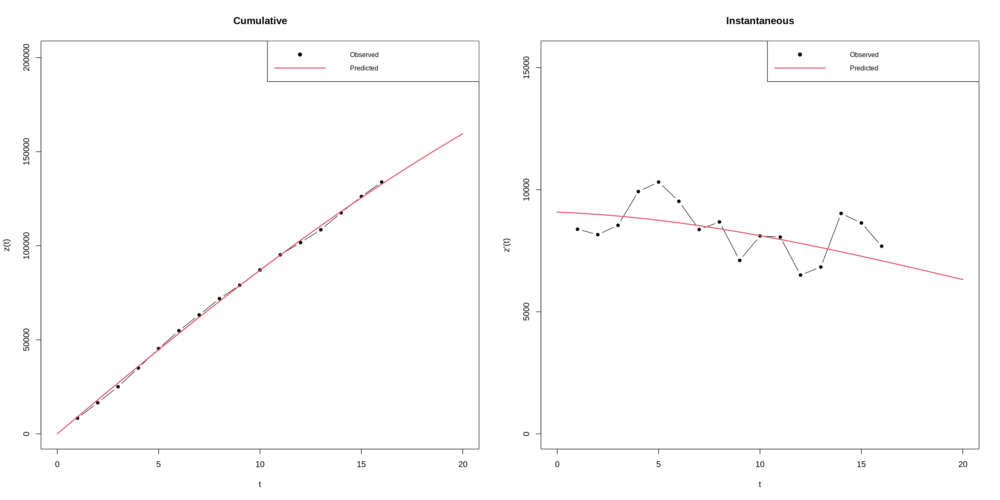

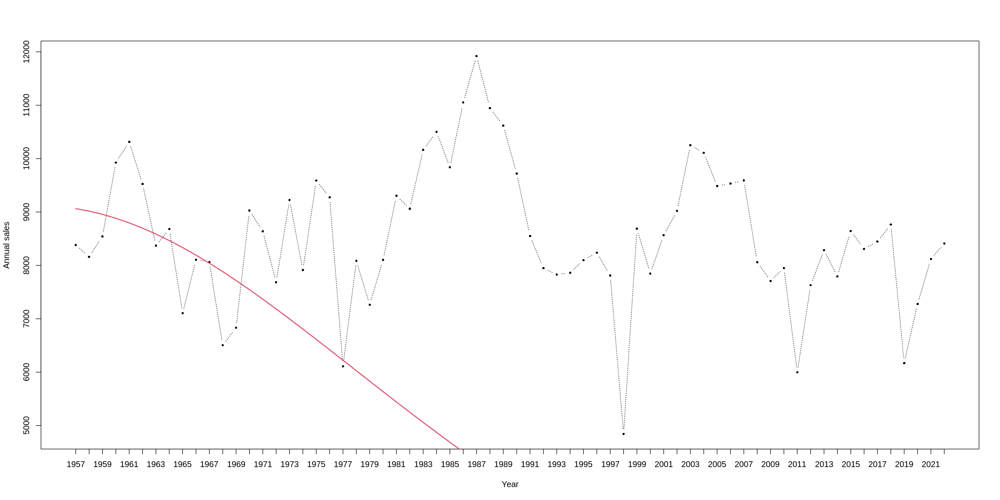

In [ ]:
###we estimate the model with 25% of the data
bm_cass75<-BM(Detroit[1:16],display = T)
summary(bm_cass75)

pred_bmcas75<- predict(bm_cass75, newx=c(1:80))
pred.instcas75_det<- make.instantaneous(pred_bmcas75)
plot(Detroit, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:66), labels=tt_Det)
lines(pred.instcas75_det, lwd=2, col=2)

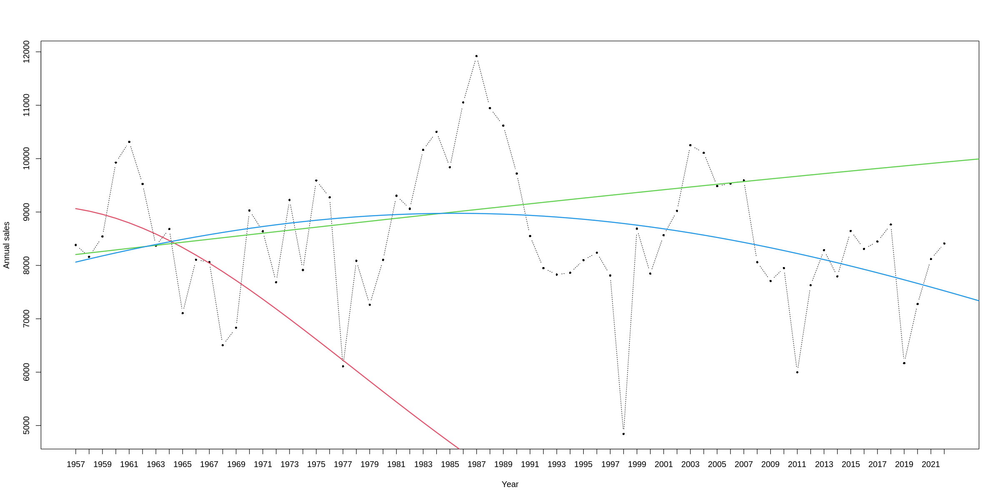

In [ ]:
###Comparison between models (instantaneous)
###instantaneous
plot(Detroit, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:66), labels=tt_Det)
lines(pred.instcas75_det, lwd=2, col=2)
lines(pred.instcas50_det, lwd=2, col=3)
lines(pred.instcas_det, lwd=2, col=4)

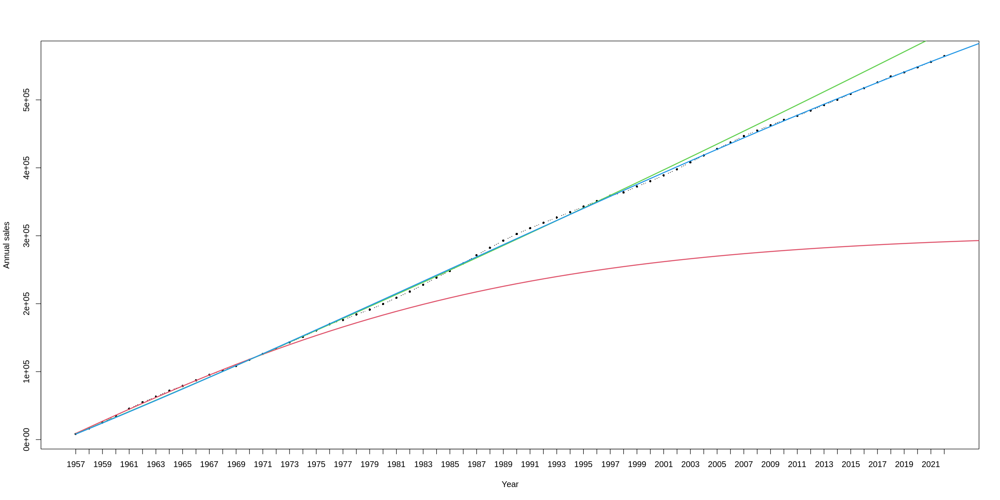

In [ ]:
###Comparison between models (cumulative)
plot(cumsum(Detroit), type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:66), labels=tt_Det)
lines(pred_bmcas75, lwd=2, col=2)
lines(pred_bmcas50, lwd=2, col=3)
lines(pred_bmcas, lwd=2, col=4)

BM for Los

Call: ( Standard Bass Model )

  BM(series = Los, display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-6966.4 -2247.5   848.1   134.3  2175.3  6538.3 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 1.296731e+06 1.164247e+05 1.068543e+06 1.524920e+06 3.09e-16 ***
p 7.761005e-03 6.200777e-04 6.545675e-03 8.976335e-03 2.24e-18 ***
q 9.746102e-03 1.737999e-03 6.339687e-03 1.315252e-02 5.50e-07 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  3291.778  on  60  degrees of freedom
 Multiple R-squared:   0.999919  Residual sum of squares:  650147982


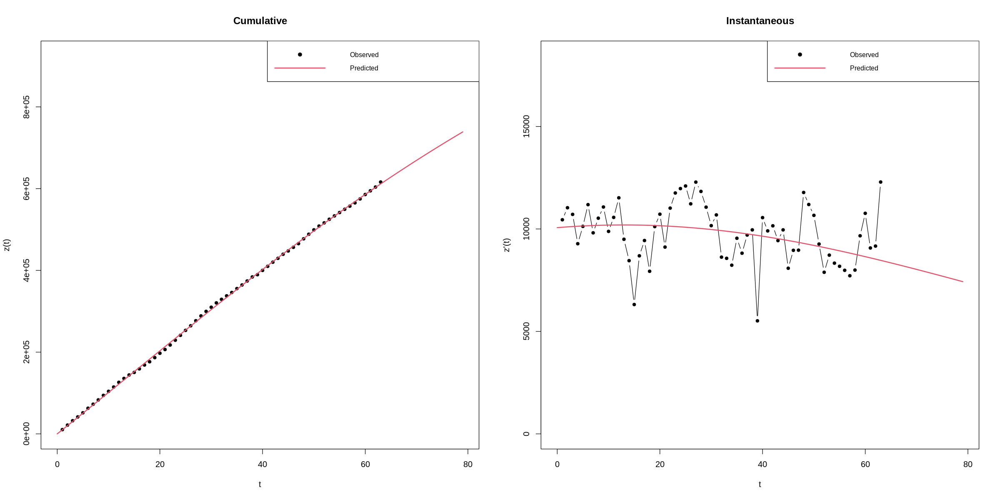

In [ ]:
###we estimate a simple Bass Model
bm_cass<-BM(Los,display = T)
summary(bm_cass)

In [ ]:
###prediction (out-of-sample)
pred_bmcas<- predict(bm_cass, newx=c(1:80))
pred.instcas_los<- make.instantaneous(pred_bmcas)

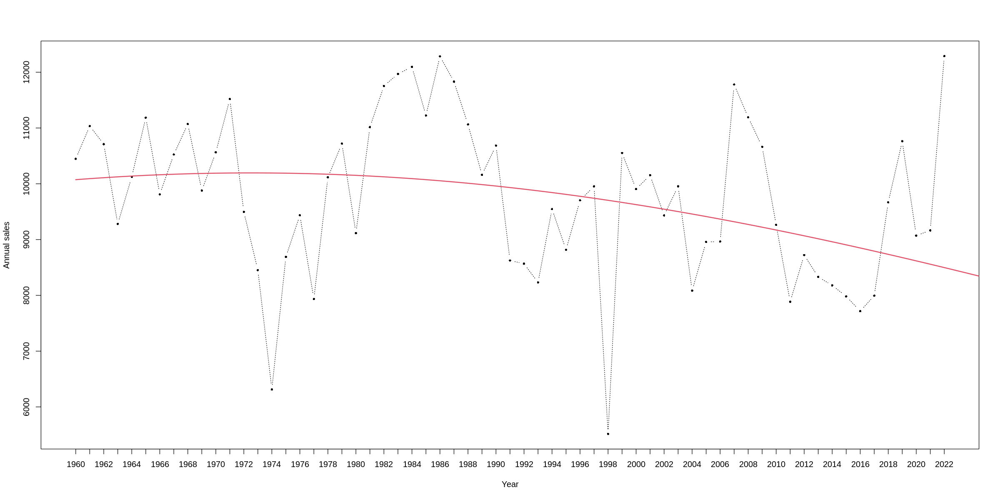

In [ ]:
###plot of fitted model
plot(Los, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:63), labels=tt_Lal)
lines(pred.instcas_los, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = Los[1:31], display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-6252.3 -2369.2  1742.7   567.2  3338.7  5713.8 

Coefficients:
       Estimate    Std.Error         Lower        Upper p-value  
m 5.431422e+06 1.154729e+08 -2.208912e+08 2.317541e+08   0.963  
p 1.824832e-03 3.964041e-02 -7.586894e-02 7.951860e-02   0.964  
q 3.974750e-03 4.665579e-02 -8.746891e-02 9.541841e-02   0.933  
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  3794.286  on  28  degrees of freedom
 Multiple R-squared:   0.999586  Residual sum of squares:  403104966


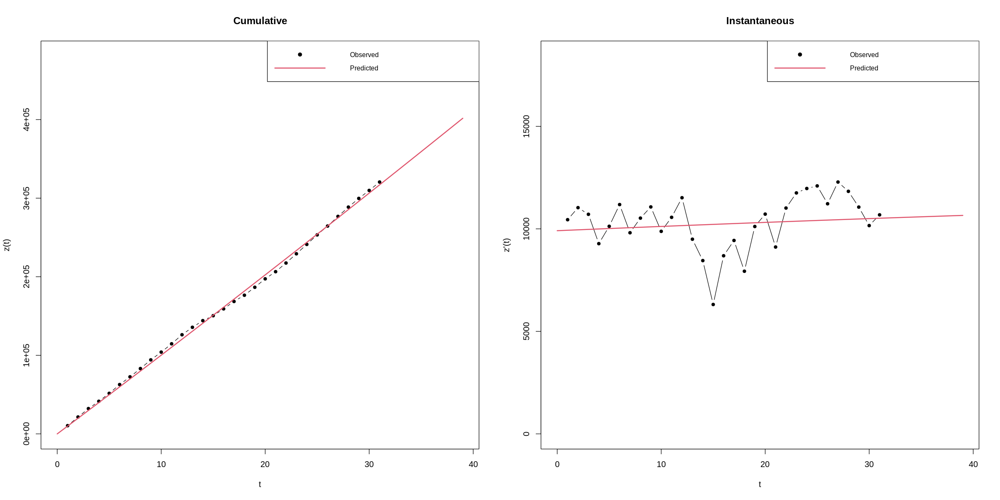

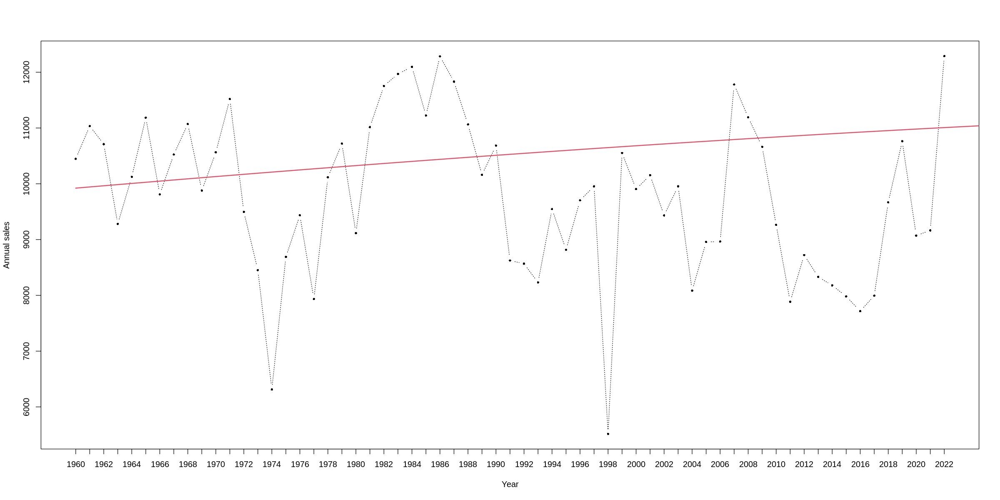

In [ ]:
###we estimate the model with 50% of the data

bm_cass50<-BM(Los[1:31],display = T)
summary(bm_cass50)

pred_bmcas50<- predict(bm_cass50, newx=c(1:80))
pred.instcas50_los<- make.instantaneous(pred_bmcas50)

plot(Los, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:63), labels=tt_Lal)
lines(pred.instcas50_los, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = Boston[1:15], display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-660.80 -159.64   21.06   48.79  381.47  679.92 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 2.612478e+05 1.156950e+04 2.385720e+05 2.839237e+05 3.37e-11 ***
p 2.199978e-02 7.061809e-04 2.061569e-02 2.338387e-02 7.53e-13 ***
q 1.184393e-01 5.436899e-03 1.077831e-01 1.290954e-01 5.13e-11 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  438.0047  on  12  degrees of freedom
 Multiple R-squared:   0.99997  Residual sum of squares:  2302177


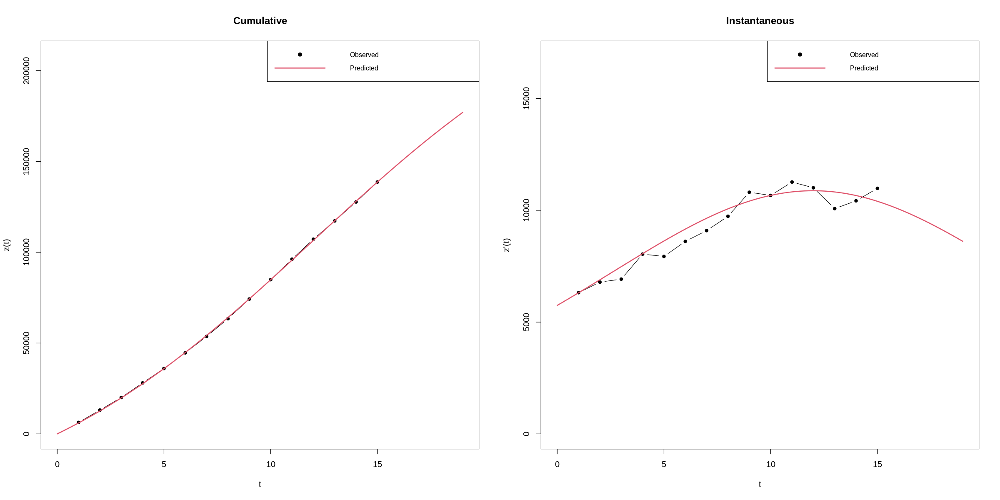

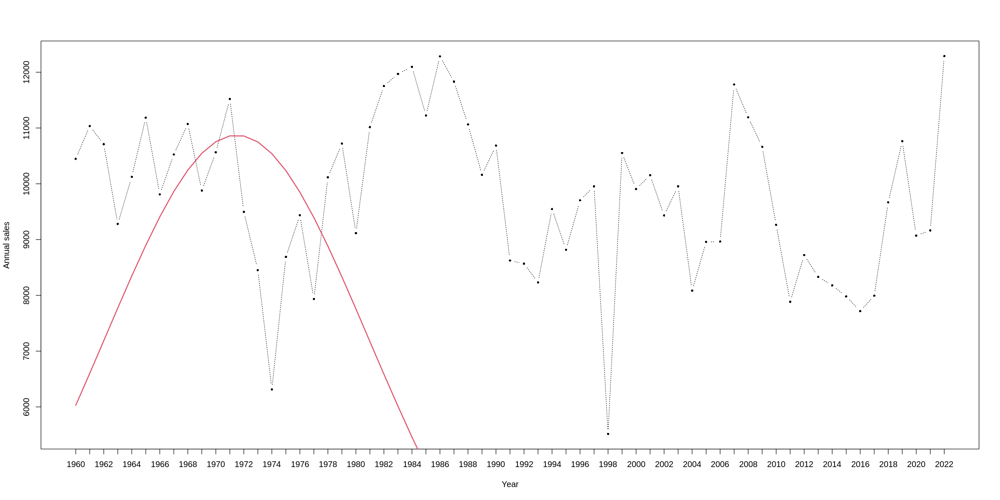

In [ ]:
###we estimate the model with 25% of the data
bm_cass75<-BM(Boston[1:15],display = T)
summary(bm_cass75)

pred_bmcas75<- predict(bm_cass75, newx=c(1:80))
pred.instcas75_los<- make.instantaneous(pred_bmcas75)
plot(Los, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:63), labels=tt_Lal)
lines(pred.instcas75_los, lwd=2, col=2)

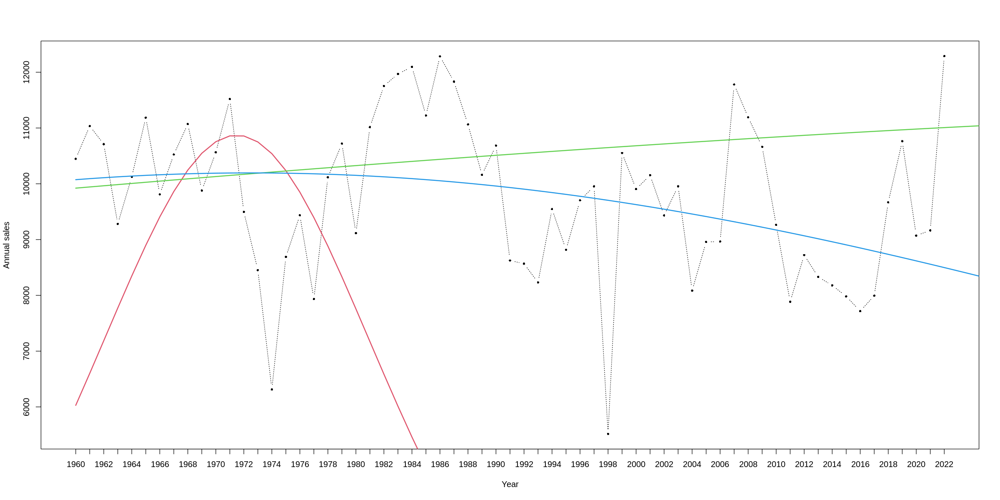

In [ ]:
###Comparison between models (instantaneous)
###instantaneous
plot(Los, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:63), labels=tt_Lal)
lines(pred.instcas75_los, lwd=2, col=2)
lines(pred.instcas50_los, lwd=2, col=3)
lines(pred.instcas_los, lwd=2, col=4)

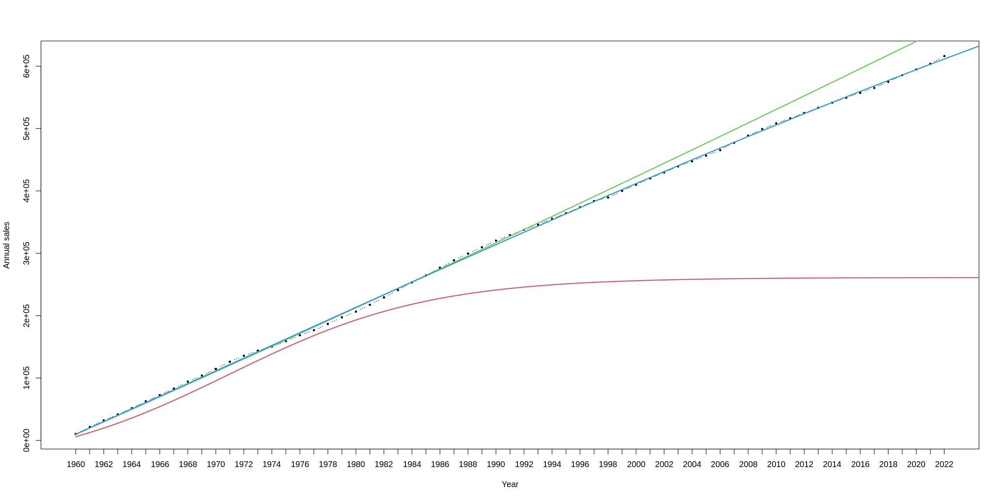

In [ ]:
###Comparison between models (cumulative)
plot(cumsum(Los), type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:63), labels=tt_Lal)
lines(pred_bmcas75, lwd=2, col=2)
lines(pred_bmcas50, lwd=2, col=3)
lines(pred_bmcas, lwd=2, col=4)

BM for NYK

Call: ( Standard Bass Model )

  BM(series = NewYork, display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-4097.0 -2018.6  -878.2  -322.1   811.9  7312.6 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 9.265816e+05 1.796507e+04 8.913708e+05 9.617925e+05 7.65e-57 ***
p 7.849511e-03 1.011335e-04 7.651294e-03 8.047729e-03 7.02e-69 ***
q 2.078274e-02 7.689714e-04 1.927558e-02 2.228989e-02 1.97e-38 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  2534.392  on  69  degrees of freedom
 Multiple R-squared:   0.99995  Residual sum of squares:  443196986


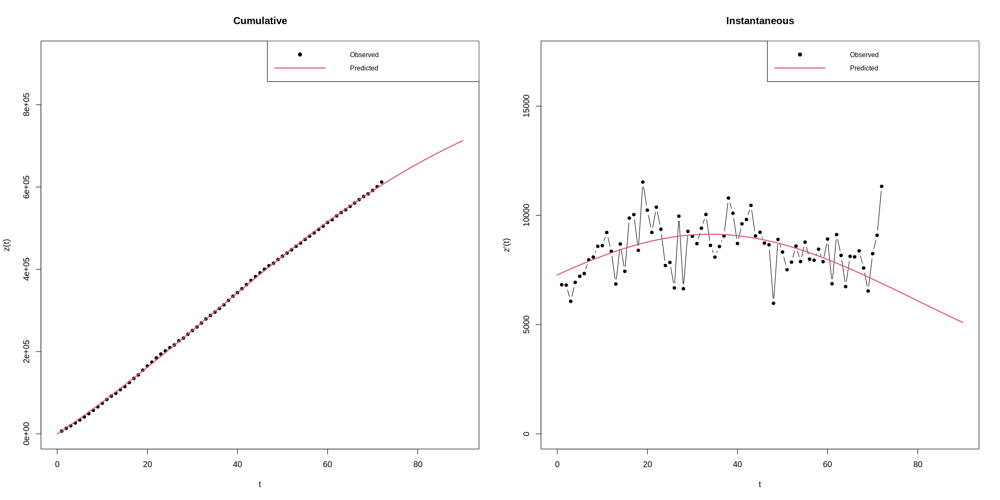

In [ ]:
###we estimate a simple Bass Model
bm_cass<-BM(NewYork,display = T)
summary(bm_cass)

In [ ]:
###prediction (out-of-sample)
pred_bmcas<- predict(bm_cass, newx=c(1:80))
pred.instcas_nyk<- make.instantaneous(pred_bmcas)

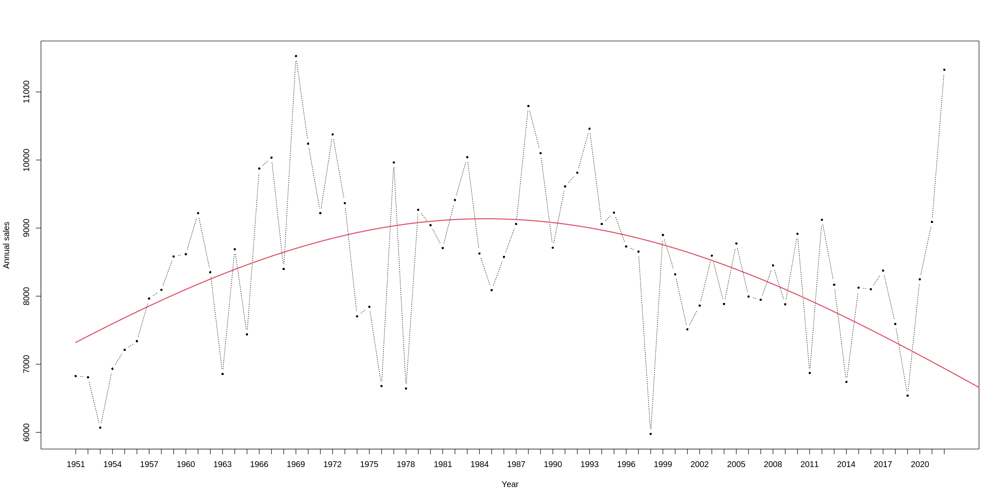

In [ ]:
###plot of fitted model
plot(NewYork, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Nyk)
lines(pred.instcas_nyk, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = NewYork[1:36], display = T)

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-3049.49 -1043.38  -470.89   -53.02  1104.22  3479.82 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 4.890612e+05 1.917951e+04 4.514700e+05 5.266523e+05 2.72e-23 ***
p 1.313093e-02 3.482456e-04 1.244838e-02 1.381348e-02 1.03e-28 ***
q 4.546727e-02 2.748211e-03 4.008087e-02 5.085366e-02 1.54e-17 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  1677.301  on  33  degrees of freedom
 Multiple R-squared:   0.99991  Residual sum of squares:  92840216


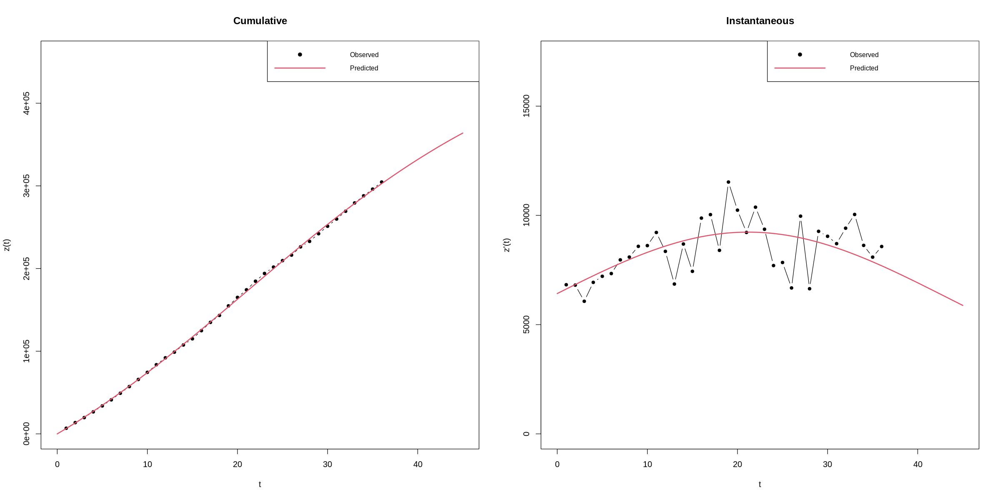

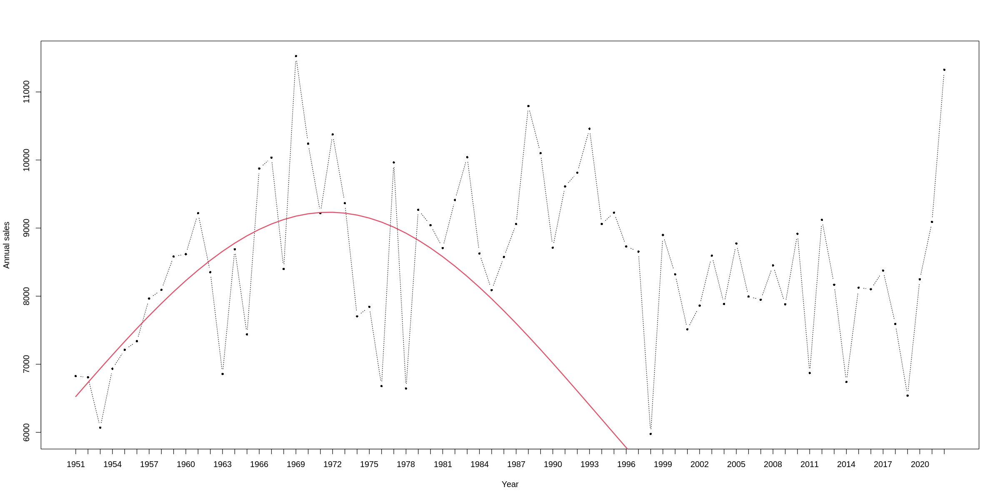

In [ ]:
###we estimate the model with 50% of the data

bm_cass50<-BM(NewYork[1:36],display = T)
summary(bm_cass50)

pred_bmcas50<- predict(bm_cass50, newx=c(1:80))
pred.instcas50_nyk<- make.instantaneous(pred_bmcas50)

plot(NewYork, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Nyk)
lines(pred.instcas50_nyk, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = NewYork[1:18], display = T)

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-1730.63  -456.45  -204.93    14.89   546.74  1399.54 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 3.532171e+05 6.198901e+04 2.317208e+05 4.747133e+05 4.22e-05 ***
p 1.768383e-02 2.739207e-03 1.231508e-02 2.305257e-02 1.08e-05 ***
q 5.803169e-02 9.720206e-03 3.898043e-02 7.708294e-02 2.57e-05 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  817.0883  on  15  degrees of freedom
 Multiple R-squared:   0.999904  Residual sum of squares:  10014499


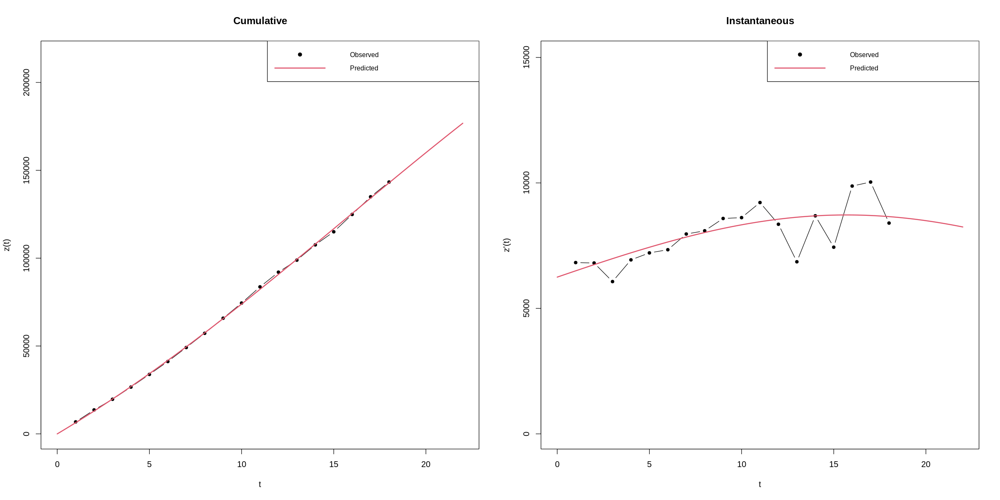

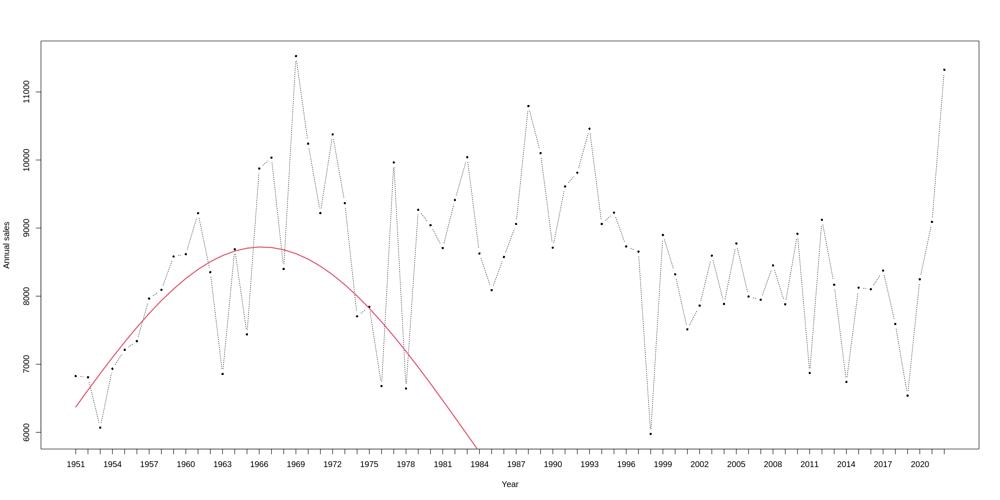

In [ ]:
###we estimate the model with 25% of the data
bm_cass75<-BM(NewYork[1:18],display = T)
summary(bm_cass75)

pred_bmcas75<- predict(bm_cass75, newx=c(1:80))
pred.instcas75_nyk<- make.instantaneous(pred_bmcas75)
plot(NewYork, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Nyk)
lines(pred.instcas75_nyk, lwd=2, col=2)

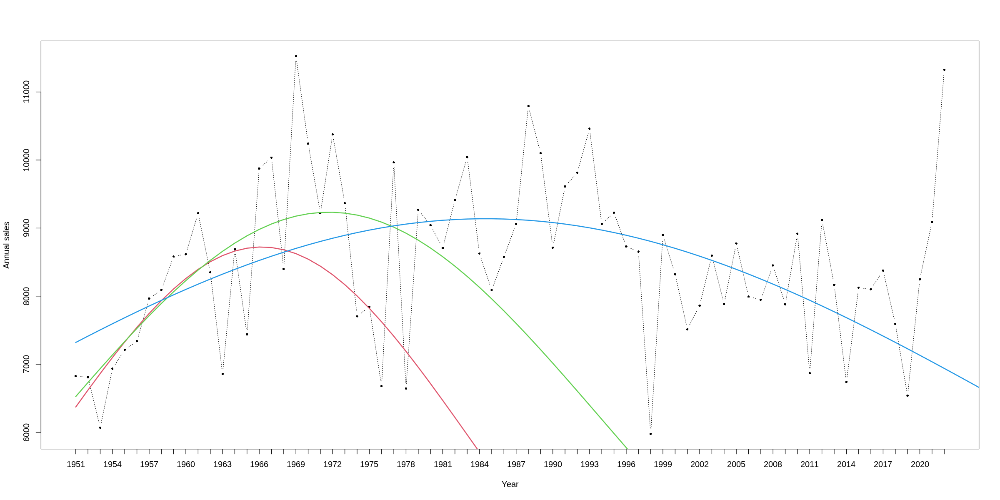

In [ ]:
###Comparison between models (instantaneous)
###instantaneous
plot(NewYork, type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Nyk)
lines(pred.instcas75_nyk, lwd=2, col=2)
lines(pred.instcas50_nyk, lwd=2, col=3)
lines(pred.instcas_nyk, lwd=2, col=4)

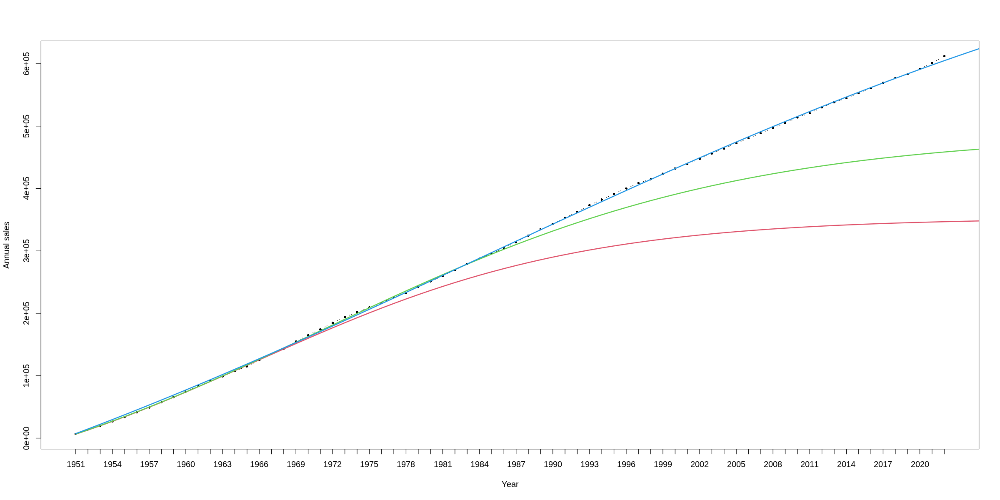

In [ ]:
###Comparison between models (cumulative)
plot(cumsum(NewYork), type= "b",xlab="Year", ylab="Annual sales",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1:72), labels=tt_Nyk)
lines(pred_bmcas75, lwd=2, col=2)
lines(pred_bmcas50, lwd=2, col=3)
lines(pred_bmcas, lwd=2, col=4)

gbm for boston

Call: ( Generalized Bass model with 3  Exponential  shock )

  GBM(series = Boston, shock = "exp", nshock = 3, prelimestimates = c(2692190000, 
    0.002030157, 0.05740193, 20, -0.1, 0.1, 40, -0.1, 0.1, 45, 
    -0.1, 0.1))

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-39.675 -13.295   1.213   1.339  16.950  62.089 

Coefficients:
           Estimate    Std.Error         Lower        Upper  p-value    
m     1.799529e+04 9.169630e+03 23.1474645646 3.596744e+04 5.43e-02   .
p     2.086265e-03 1.153091e-03 -0.0001737524 4.346283e-03 7.54e-02   .
q     7.976516e-03 7.293954e-03 -0.0063193706 2.227240e-02 2.79e-01    
a1    1.735769e+01 4.552469e-01 16.4654186986 1.824995e+01 9.17e-44 ***
b1    1.774275e-02 2.295822e-02 -0.0272545390 6.274005e-02 4.43e-01    
c1    9.972360e-01 2.052877e-01  0.5948794077 1.399593e+00 8.87e-06 ***
a2    4.032405e+01 7.732387e-01 38.8085336570 4.183957e+01 1.10e-51 ***
b2   -2.403220e-01 4.760313e-01 -1.1733263290 6.926822e-01 6.16e-01    
c

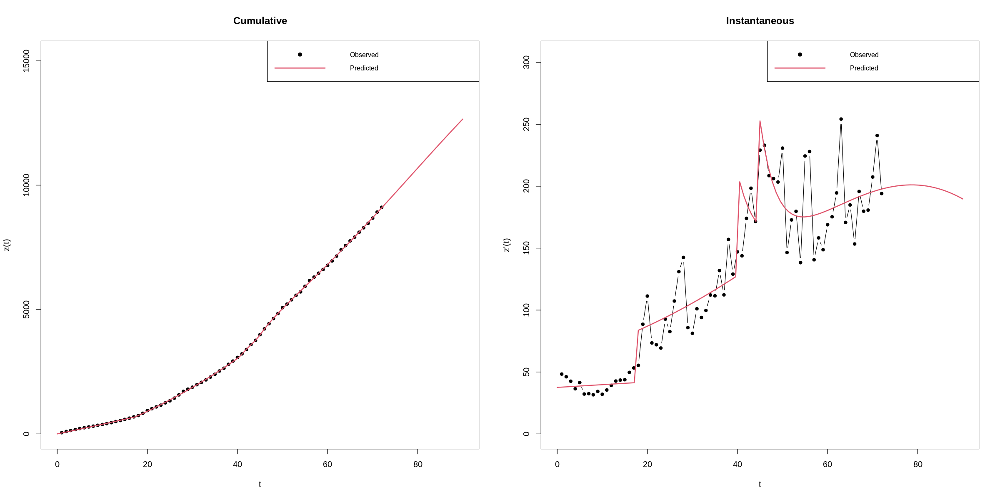

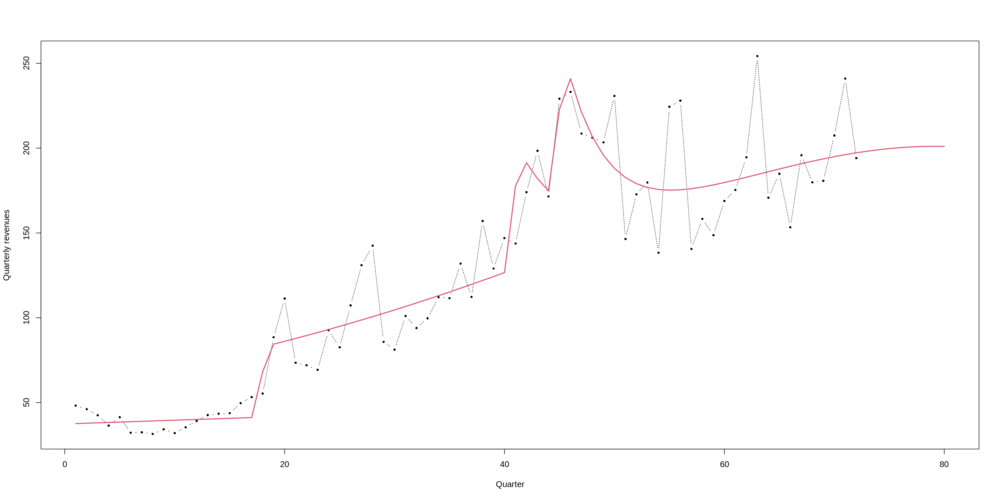

In [ ]:
######GBMe1

GBMe1tw<- GBM(Boston,shock = "exp",nshock = 3,prelimestimates = c(269219e+04, 2.030157e-03, 5.740193e-02, 20,-0.1,0.1,40,-0.1,0.1,45,-0.1,0.1))
summary(GBMe1tw)

pred_GBMe1tw<- predict(GBMe1tw, newx=c(1:80))
pred_GBMe1tw.inst<- make.instantaneous(pred_GBMe1tw)

plot(Boston, type= "b",xlab="Quarter", ylab="Quarterly revenues",  pch=16, lty=3, cex=0.6, xlim=c(1,80))
lines(pred_GBMe1tw.inst, lwd=2, col=2)


Call: ( Generalized Bass model with 2  Rectangular  shock )

  GBM(series = Boston, shock = "rett", nshock = 2, prelimestimates = c(2692190000, 
    0.002030157, 0.05740193, 20, 35, 0.8, 42, 45, 0.1))

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-40.209 -19.199   0.169   3.114  20.650  72.480 

Coefficients:
          Estimate    Std.Error        Lower        Upper  p-value    
m    1.814641e+04 1.019523e+03 1.614818e+04 2.014464e+04 2.90e-26 ***
p    1.661432e-03 7.799072e-05 1.508573e-03 1.814291e-03 1.73e-30 ***
q    3.867897e-02 1.628059e-03 3.548804e-02 4.186991e-02 3.79e-33 ***
a1   1.806129e+01 1.197599e+00 1.571404e+01 2.040854e+01 1.39e-22 ***
b1   3.034169e+01 8.311563e-01 2.871265e+01 3.197073e+01 4.26e-44 ***
c1   2.788347e-01 3.928623e-02 2.018351e-01 3.558343e-01 1.35e-09 ***
a2   3.834563e+01 4.564621e-01 3.745098e+01 3.924028e+01 2.13e-66 ***
b2   4.990970e+01 3.557504e-01 4.921245e+01 5.060696e+01 2.36e-80 ***
c2   4.028067e-01 3.170513e-02 3.406657e-0

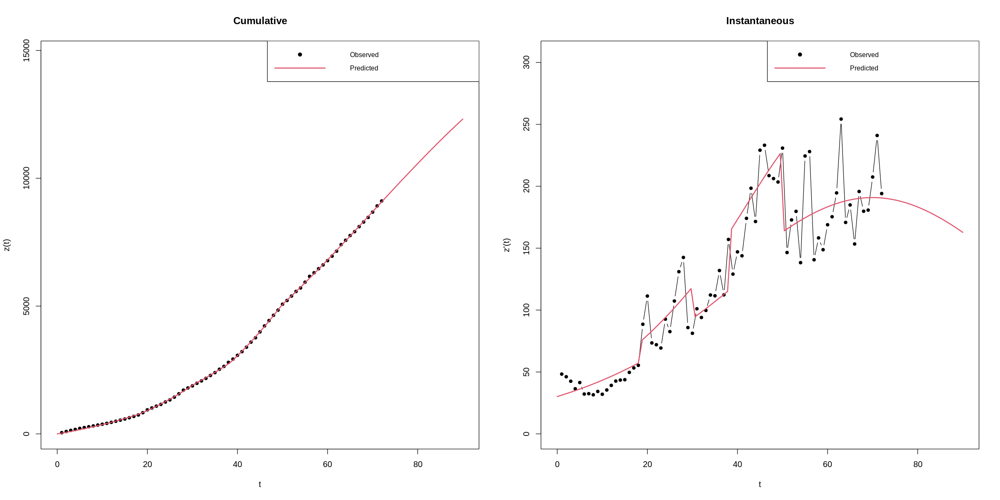

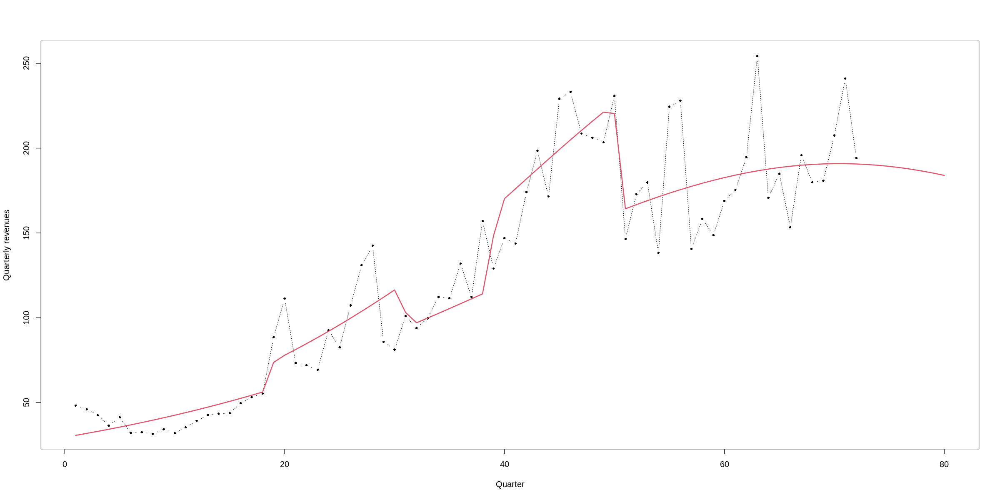

In [ ]:
######GBMe1

GBMe1tw<- GBM(Boston,shock = "rett",nshock = 2,prelimestimates = c(269219e+04, 2.030157e-03, 5.740193e-02, 20,35,0.8,42,45,0.1))
summary(GBMe1tw)

pred_GBMe1tw<- predict(GBMe1tw, newx=c(1:80))
pred_GBMe1tw.inst<- make.instantaneous(pred_GBMe1tw)

plot(Boston, type= "b",xlab="Quarter", ylab="Quarterly revenues",  pch=16, lty=3, cex=0.6, xlim=c(1,80))
lines(pred_GBMe1tw.inst, lwd=2, col=2)

Call: ( Generalized Bass model with 2  Mixed  shock )

  GBM(series = Boston, shock = "mixed", nshock = 2, prelimestimates = c(2692190000, 
    0.002030157, 0.05740193, 40, -0.1, 0.1, 20, 28, 0.1))

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-78.493 -27.788  -2.701   3.534  32.801 130.538 

Coefficients:
           Estimate    Std.Error         Lower        Upper  p-value    
m     1.387454e+04 3.320237e+02  1.322378e+04 1.452529e+04 1.19e-47 ***
p     2.000106e-03 5.174818e-05  1.898681e-03 2.101530e-03 1.36e-45 ***
q     5.008559e-02 1.348778e-03  4.744204e-02 5.272915e-02 1.52e-44 ***
a1    4.518788e+01 1.335460e+00  4.257043e+01 4.780533e+01 4.04e-42 ***
b1   -1.488847e+00 2.300909e+00 -5.998546e+00 3.020853e+00 5.20e-01    
c1    2.551053e+00 3.816514e+00 -4.929176e+00 1.003128e+01 5.06e-01    
a2    1.902055e+01 4.076122e+00  1.103149e+01 2.700960e+01 1.65e-05 ***
b2    2.800000e+01 2.754212e+00  2.260185e+01 3.339816e+01 6.56e-15 ***
c2    1.228534e-01 7.008857

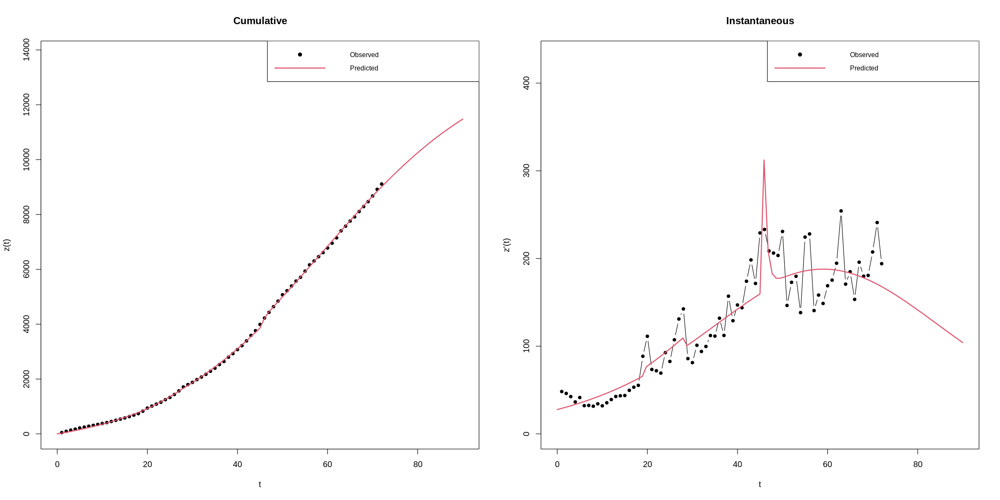

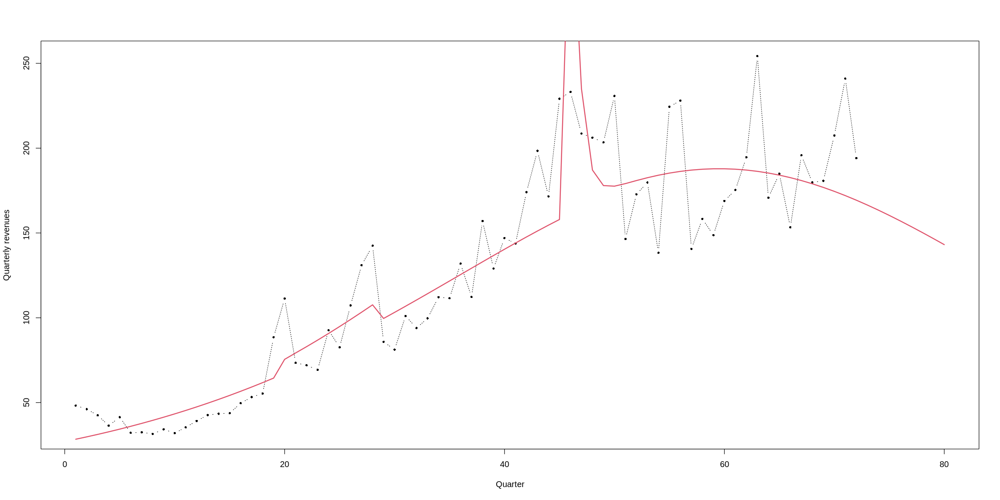

In [ ]:
######GBMe1

GBMe1tw<- GBM(Boston,shock = "mixed",nshock = 2,prelimestimates = c(269219e+04, 2.030157e-03, 5.740193e-02, 40,-0.1,0.1,20,28,0.1))
summary(GBMe1tw)

pred_GBMe1tw<- predict(GBMe1tw, newx=c(1:80))
pred_GBMe1tw.inst<- make.instantaneous(pred_GBMe1tw)

plot(Boston, type= "b",xlab="Quarter", ylab="Quarterly revenues",  pch=16, lty=3, cex=0.6, xlim=c(1,80))
lines(pred_GBMe1tw.inst, lwd=2, col=2)